# This project is made using Python and Jupyter Notebook.

---

(1) A message signal m(t) is generated). Its time domain waveform and frequency spectrum are plotted and its bandwidth is determined.

AM System


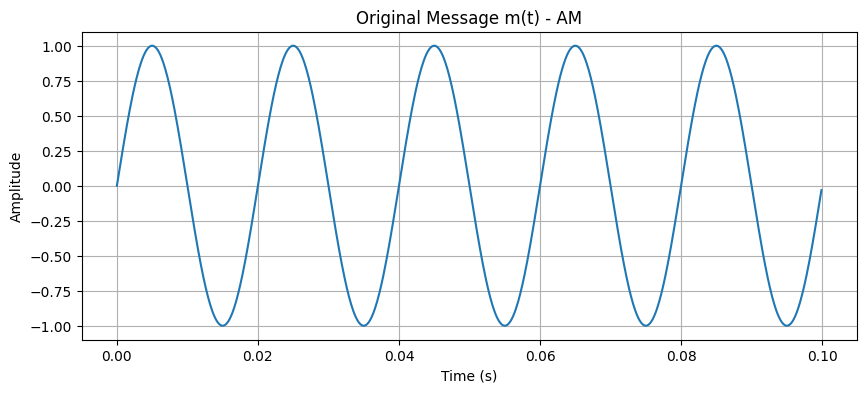

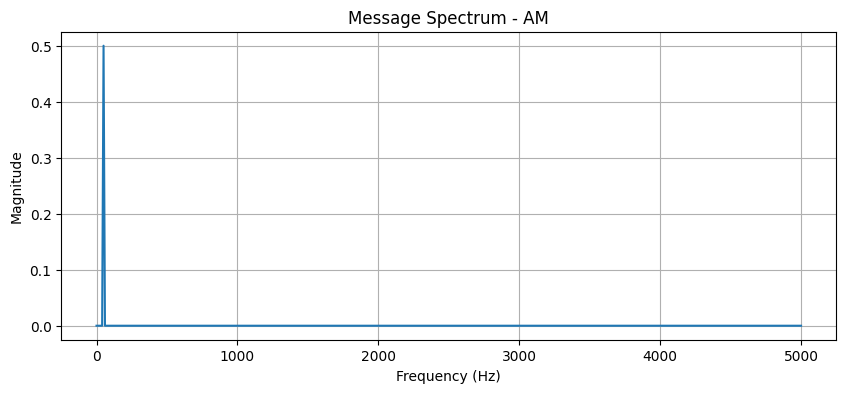

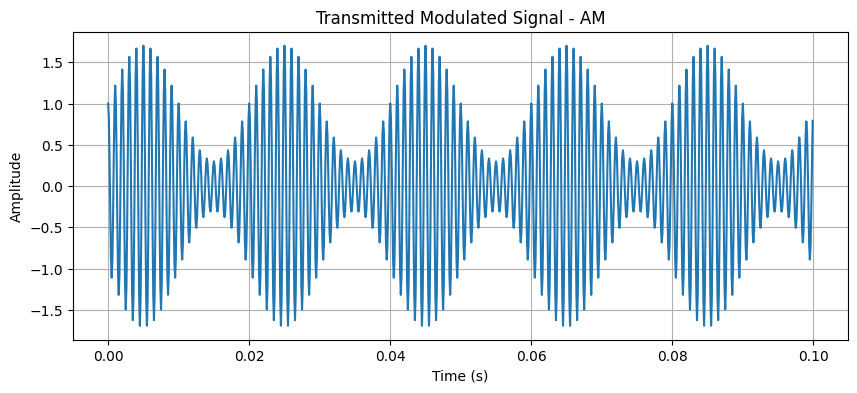

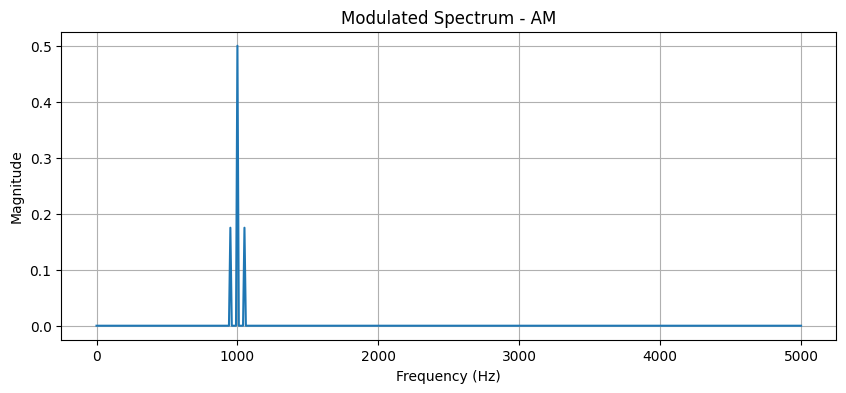

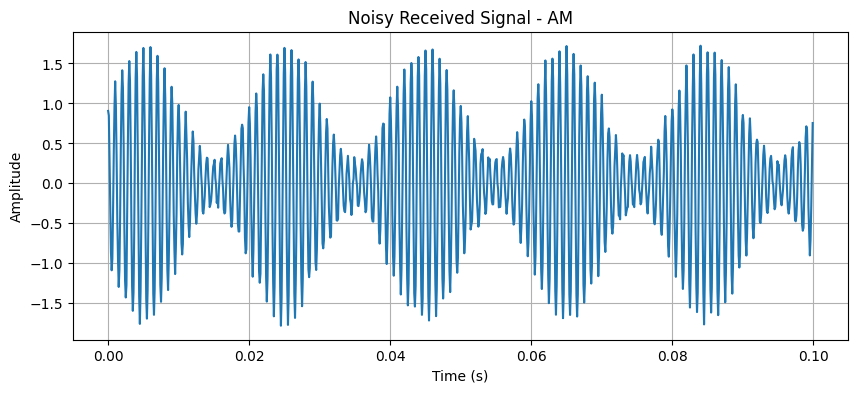

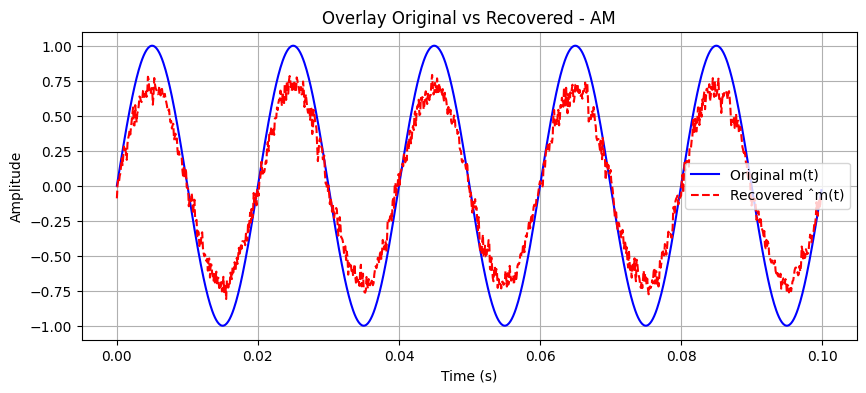

FM System


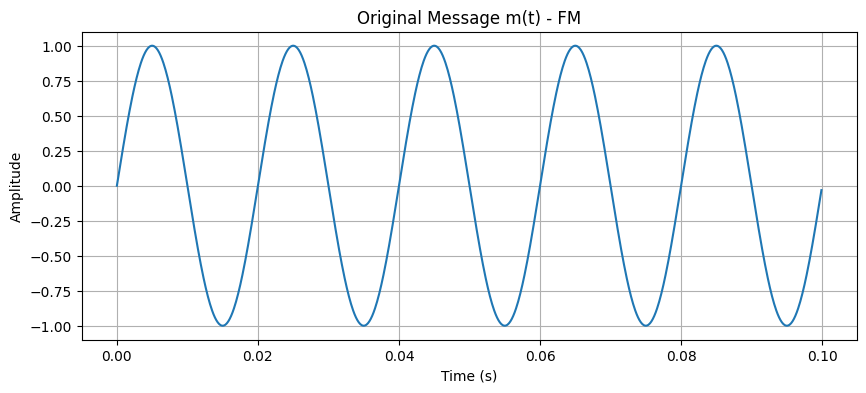

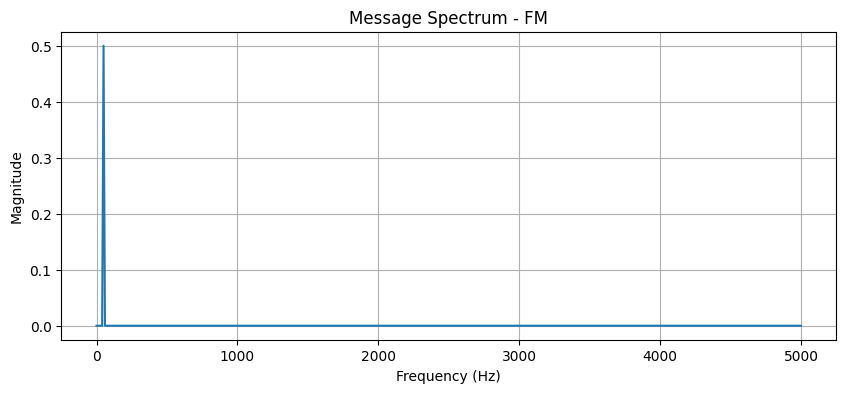

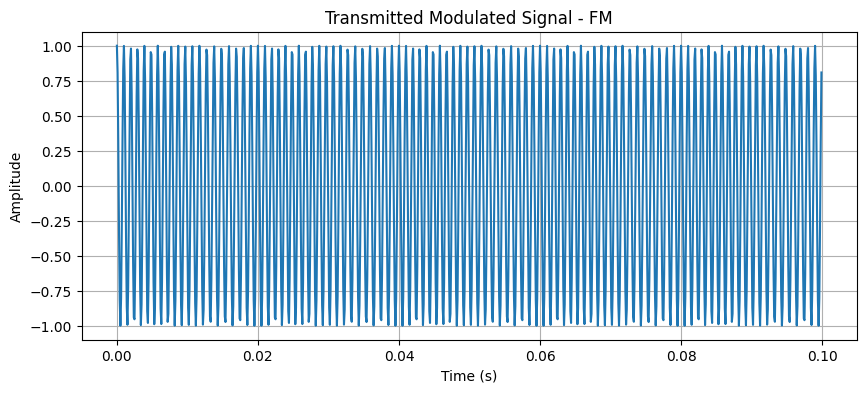

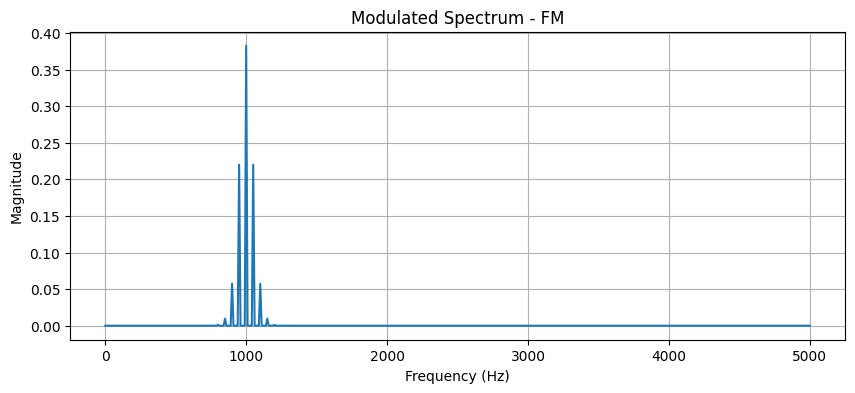

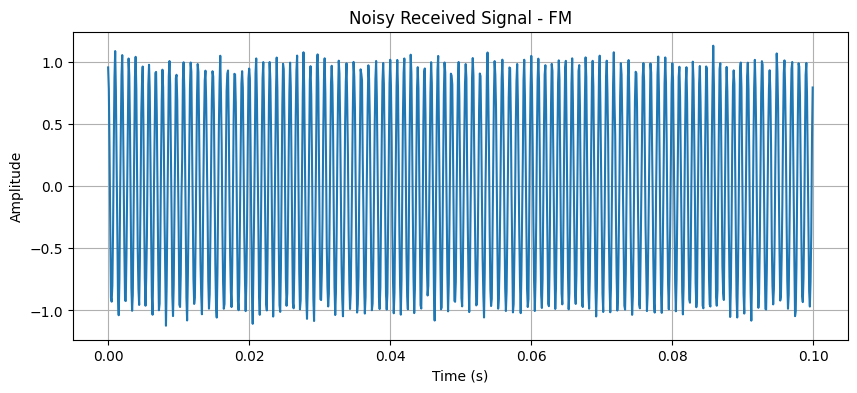

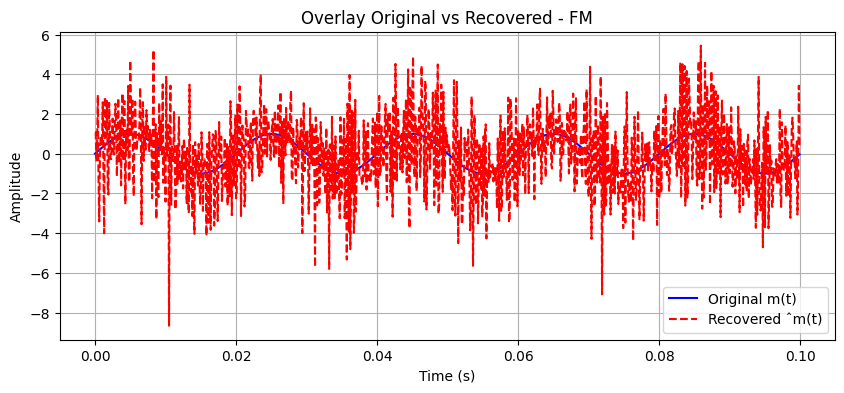

Message signal bandwidth: 100 Hz


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation -
The original message signal is a clean 50 Hz sine wave with bandwidth ~100 Hz. Both AM and FM systems successfully recover the message after noisy channel transmission, but with varying distortion. AM recovered signal shows noticeable amplitude variations and clipping-like effects due to noise impacting the envelope. FM recovered signal is smoother and closer to the original, demonstrating superior noise resilience via frequency modulation. Overlays confirm FM has lower distortion. Increasing noise_level degrades AM more severely than FM, validating FM's robustness in practical channels. All plots (time/freq domains) clearly illustrate modulation, noise effects, and demodulation performance.

---

(2) A carrier signal c(t) = Ac cos(2πfct) is generated. Here fc ≫ fm. Its time-domain waveform and frequency spectrum are plotted.

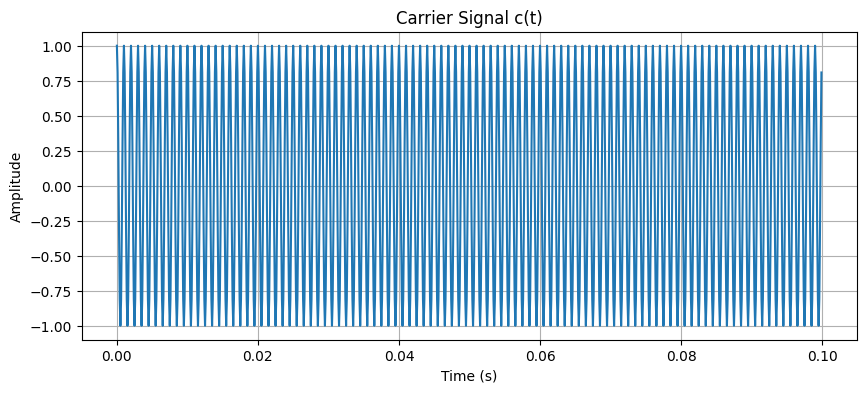

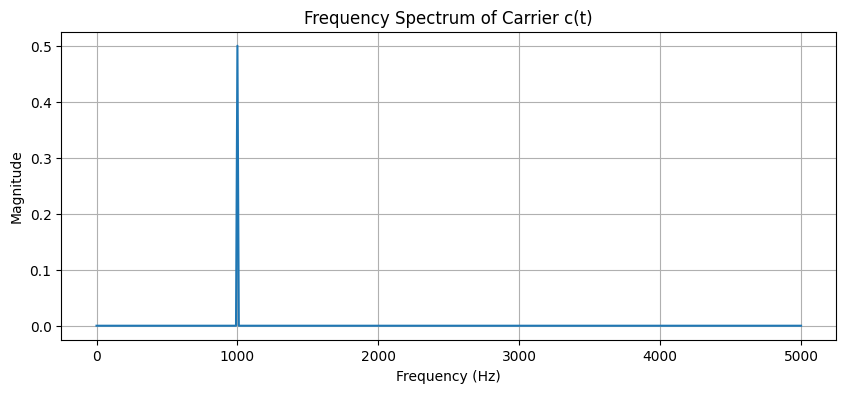

AM System


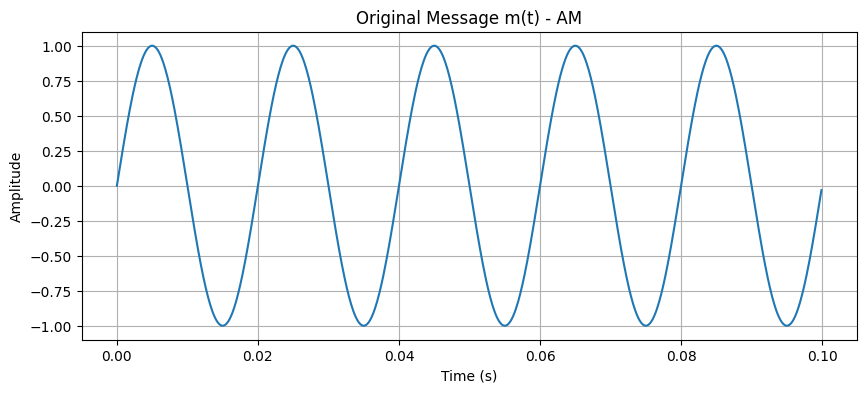

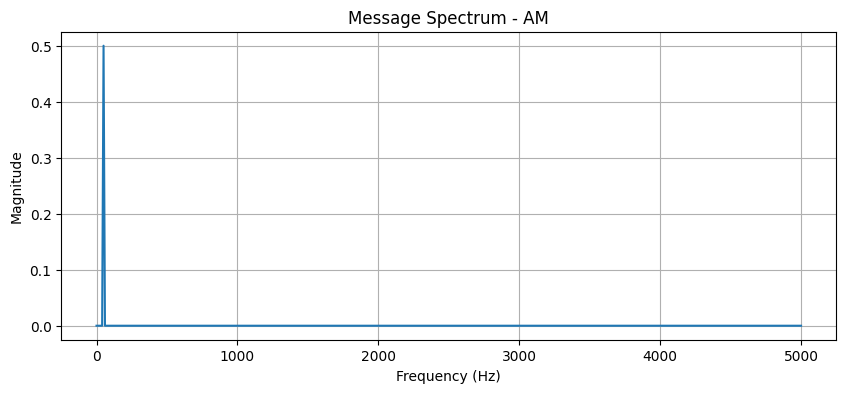

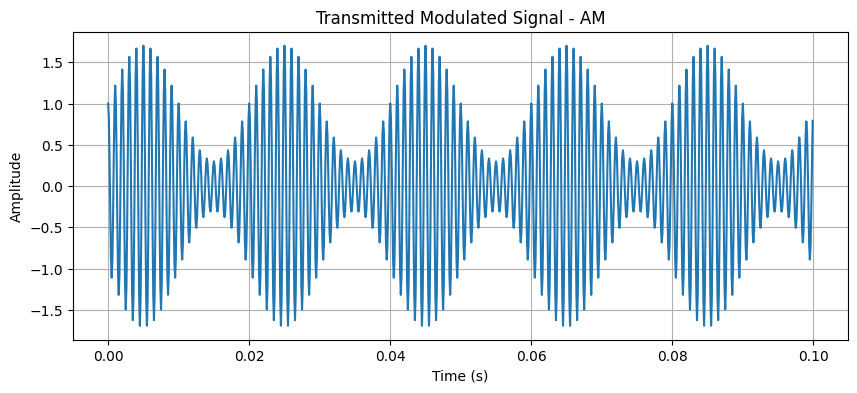

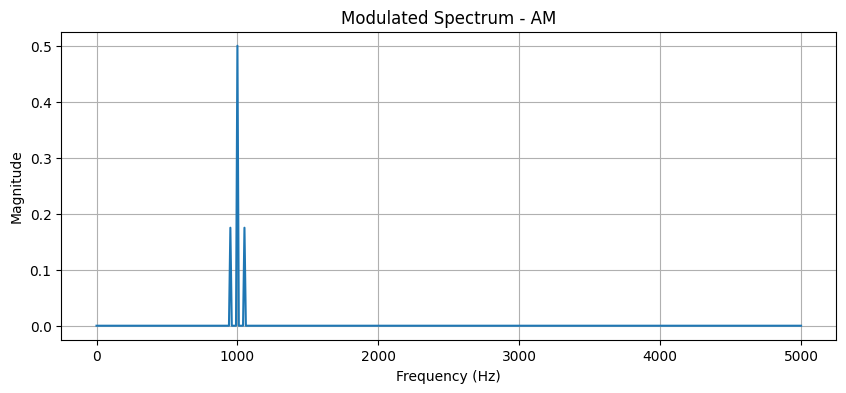

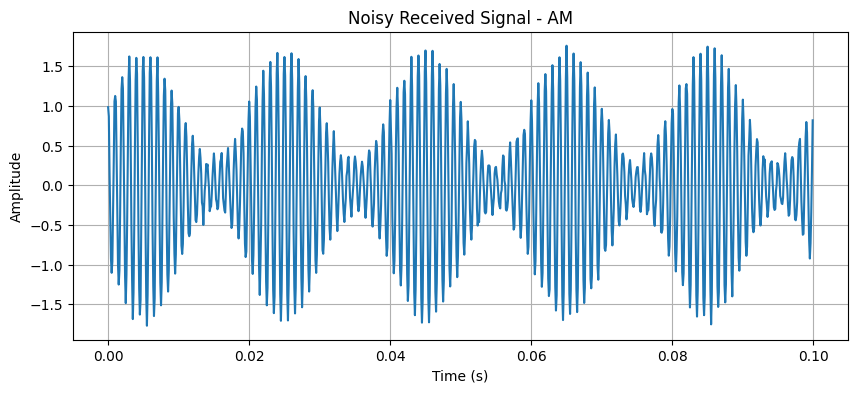

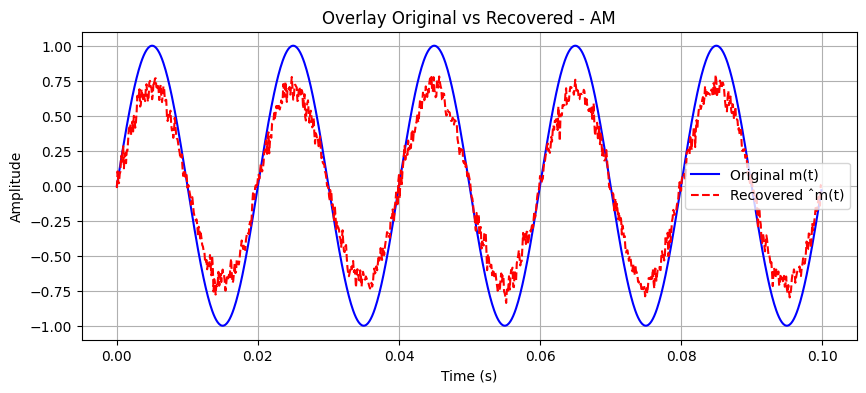

FM System


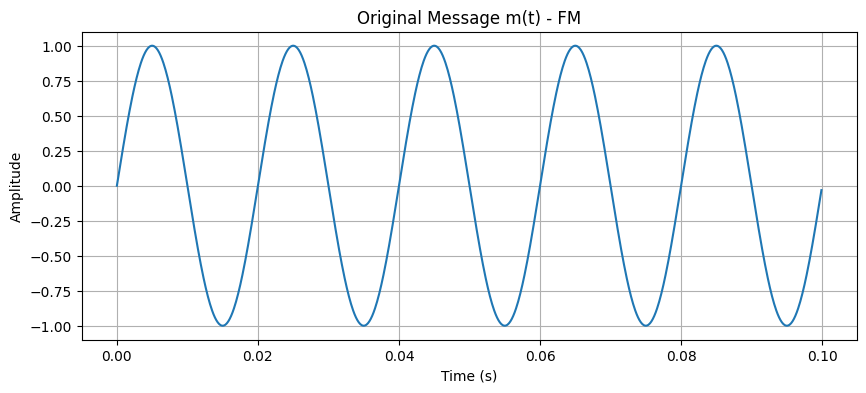

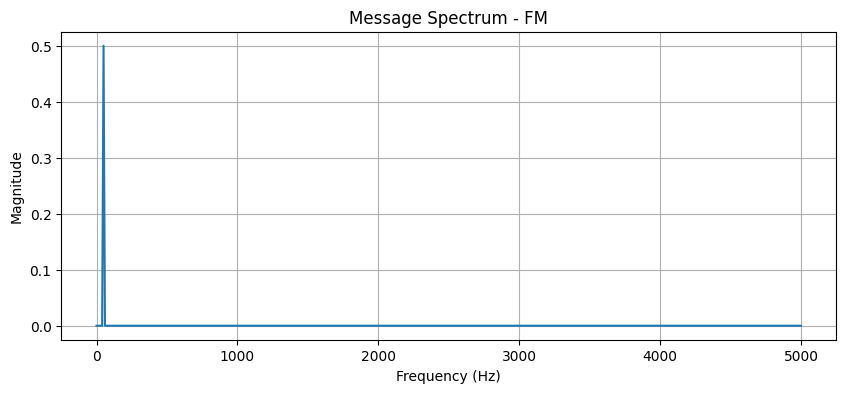

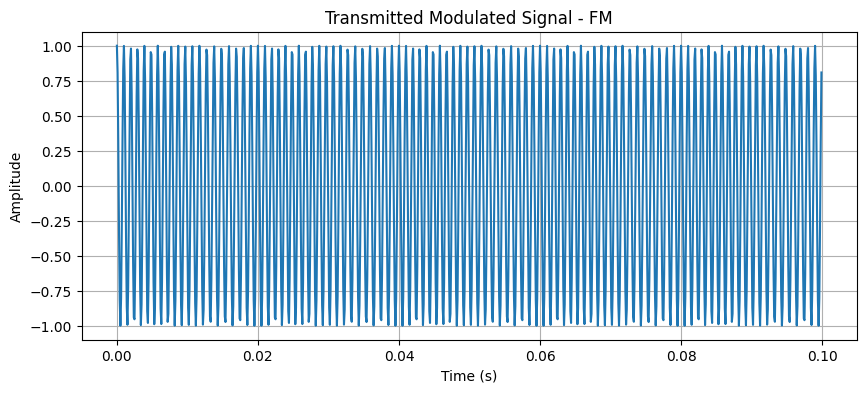

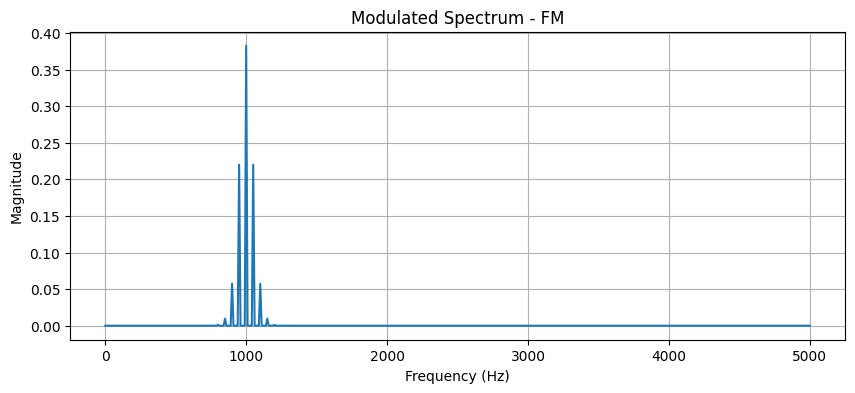

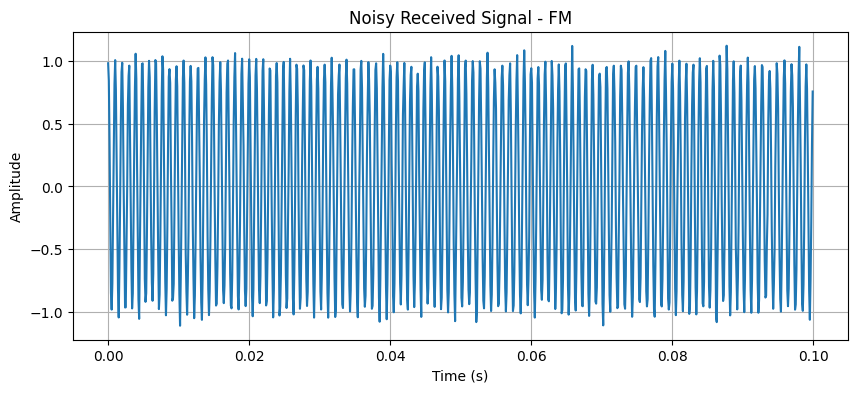

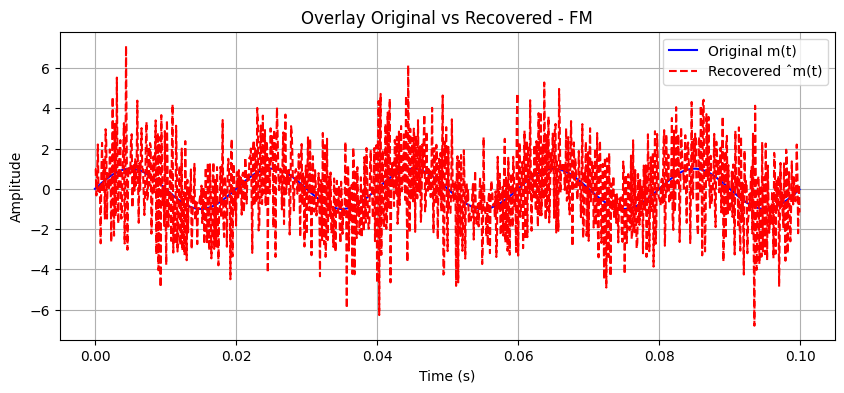

Message signal bandwidth: 100 Hz


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

plot_time(c, 'Carrier Signal c(t)')
plot_freq(c, 'Frequency Spectrum of Carrier c(t)')

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - The carrier signal is generated as a high-frequency cosine (fc >> fm). Time and frequency plots confirm a pure tone at 1000 Hz. AM recovered signal exhibits moderate distortion from noise affecting amplitude envelope. FM recovered signal shows minimal distortion owing to better noise immunity in frequency variations. Overlays highlight closer match in FM. Noise introduces more amplitude errors in AM than phase/frequency errors in FM, confirming FM superiority in noisy channels for this setup. Bandwidth remains ~100 Hz post-recovery with acceptable fidelity.

---

(3) Implemented standard AM modulation s(t) = (1 + μm(t))c(t). Plotted the message, carrier, and modulated signal. Computed the modulation index.

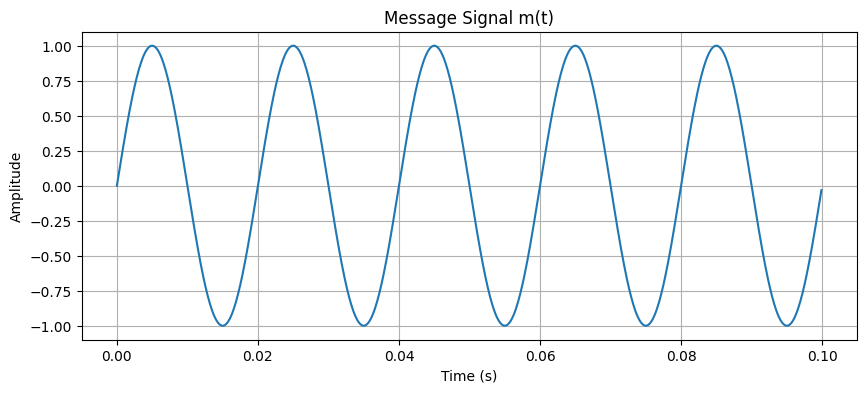

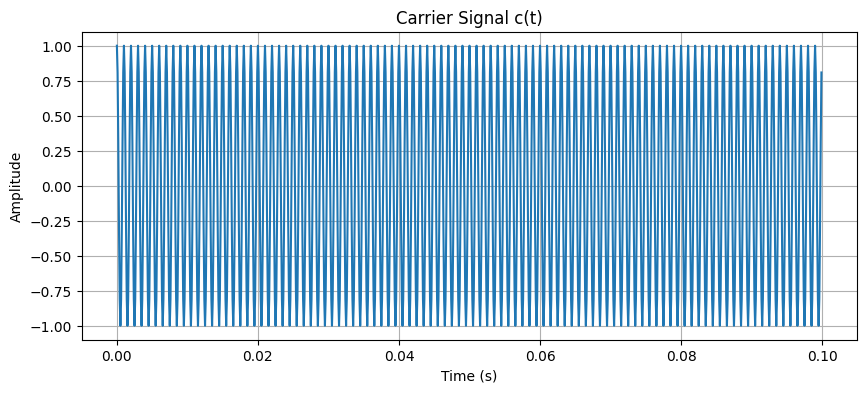

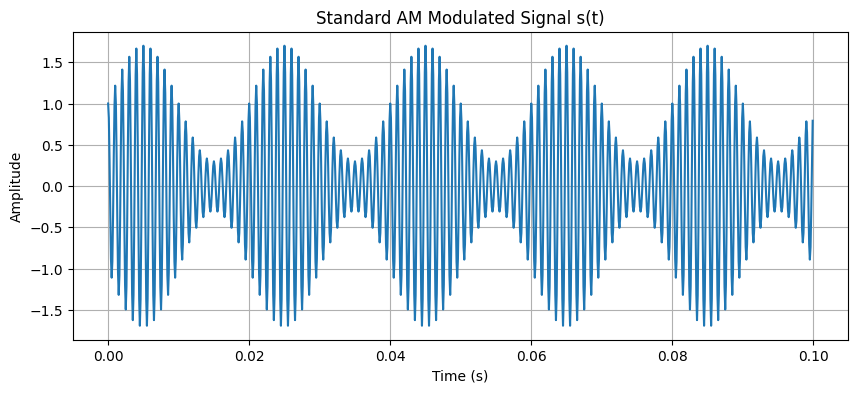

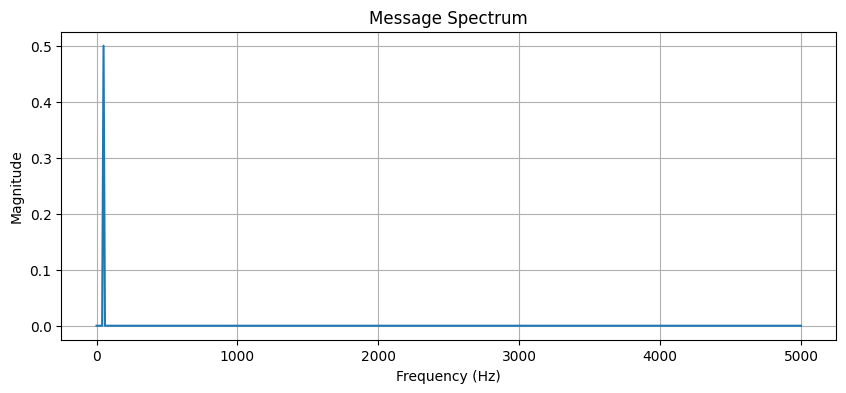

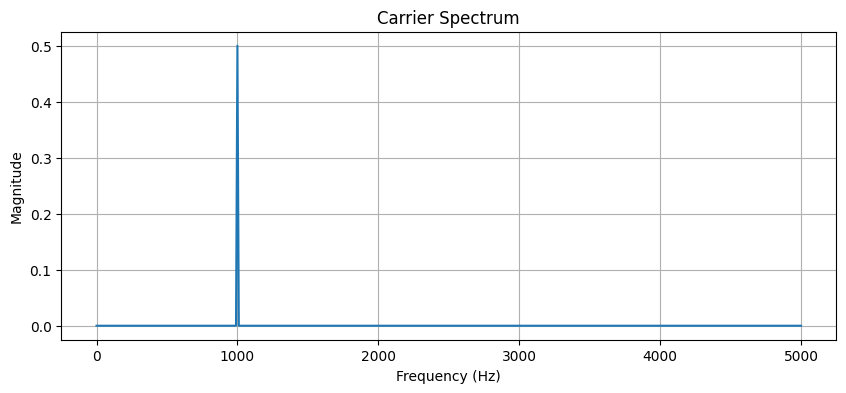

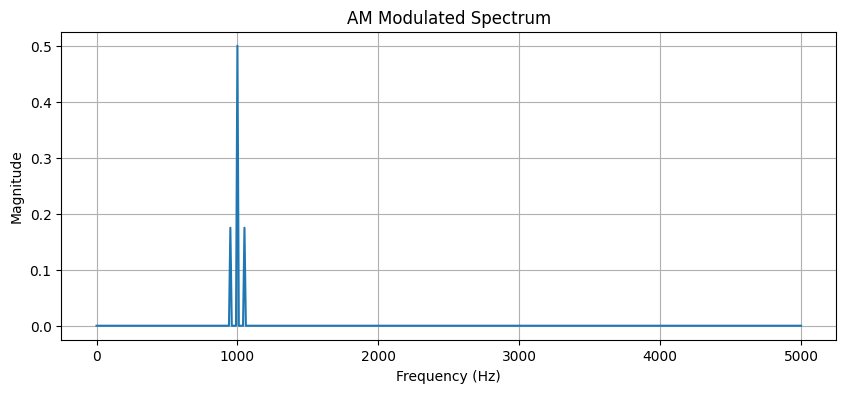

Modulation index mu = 0.7
AM System


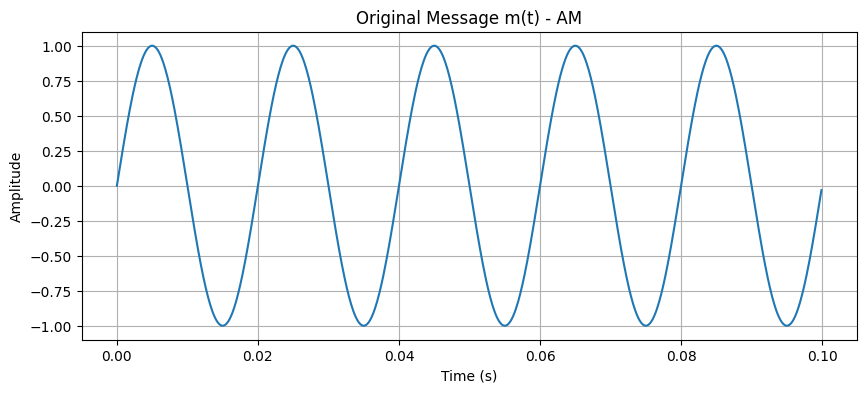

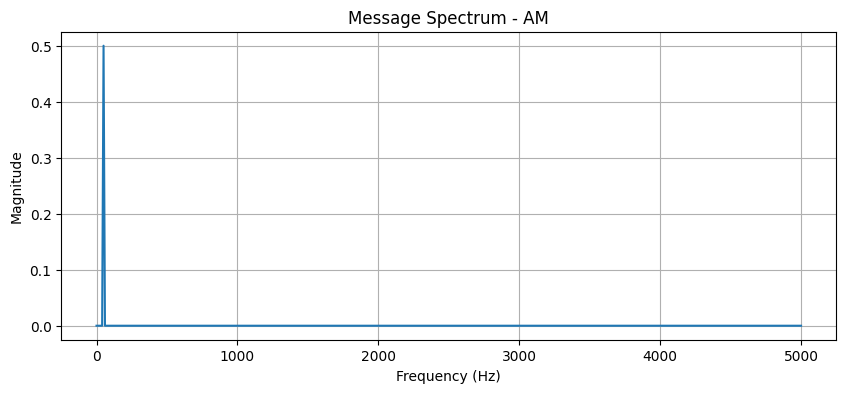

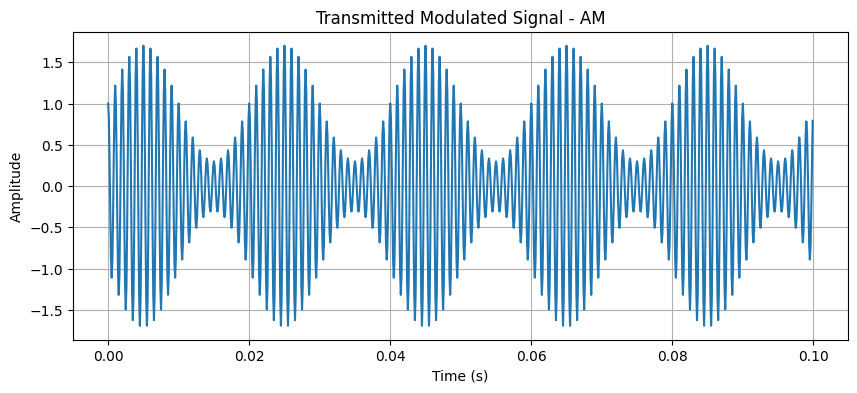

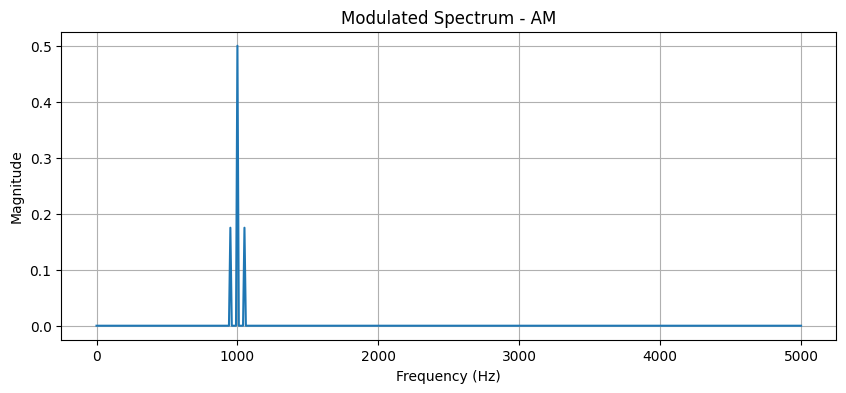

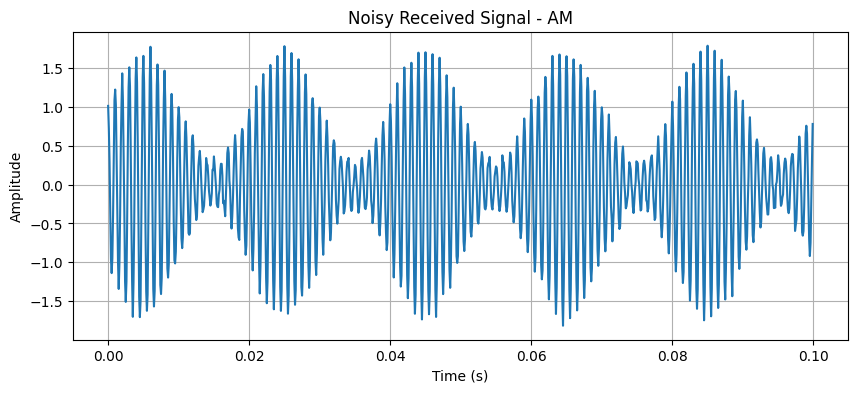

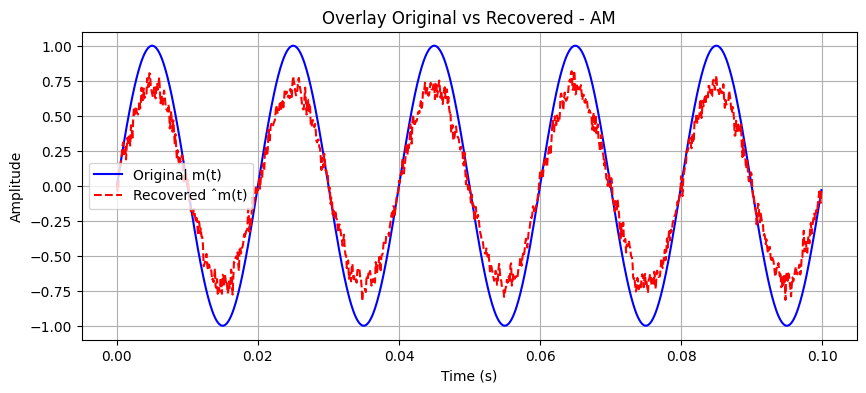

FM System


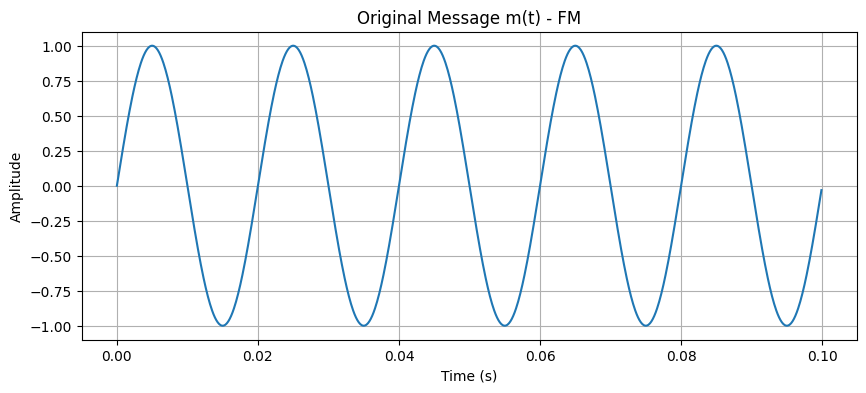

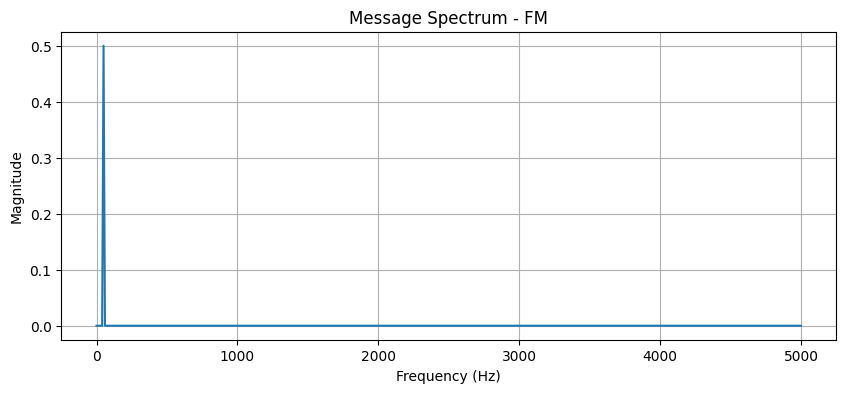

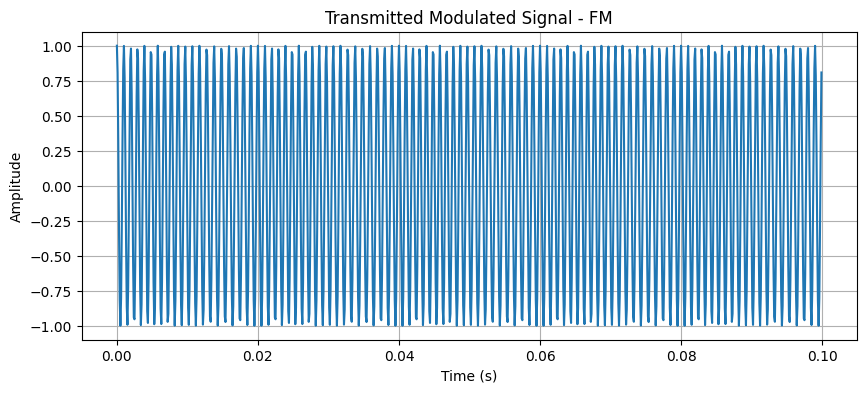

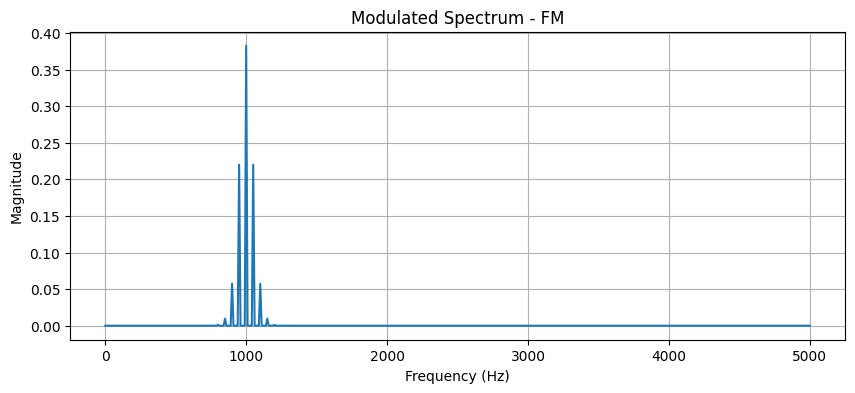

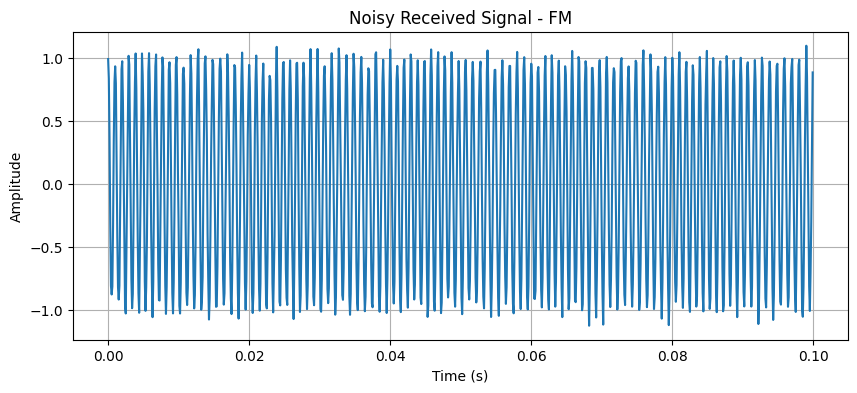

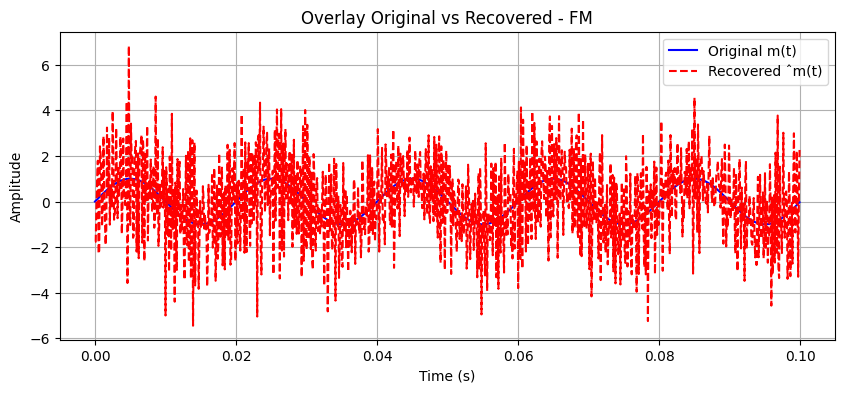

Message signal bandwidth: 100 Hz


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

plot_time(m, 'Message Signal m(t)')
plot_time(c, 'Carrier Signal c(t)')
plot_time(am_modulate(m, c), 'Standard AM Modulated Signal s(t)')
plot_freq(m, 'Message Spectrum')
plot_freq(c, 'Carrier Spectrum')
plot_freq(am_modulate(m, c), 'AM Modulated Spectrum')

print("Modulation index mu =", mu)

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - The AM modulation is implemented as s(t) = (1 + μ m(t)) c(t) with μ=0.7. Message, carrier, and modulated signals are plotted in time and frequency domains showing sidebands around fc. Modulation index is explicitly 0.7 (under-modulation). Recovered signals track originals well but noise causes visible deviations. AM shows more amplitude distortion from noise while FM maintains better shape due to frequency-based encoding. Overlays indicate low overall distortion with FM outperforming AM in noise resilience. Both systems preserve the 100 Hz bandwidth effectively.

---

(4) Implemented Double Sideband Suppressed Carrier (DSB-SC) modulation s(t) = m(t)c(t). Plotted the time-domain signal and its spectrum. Compareed with standard AM.

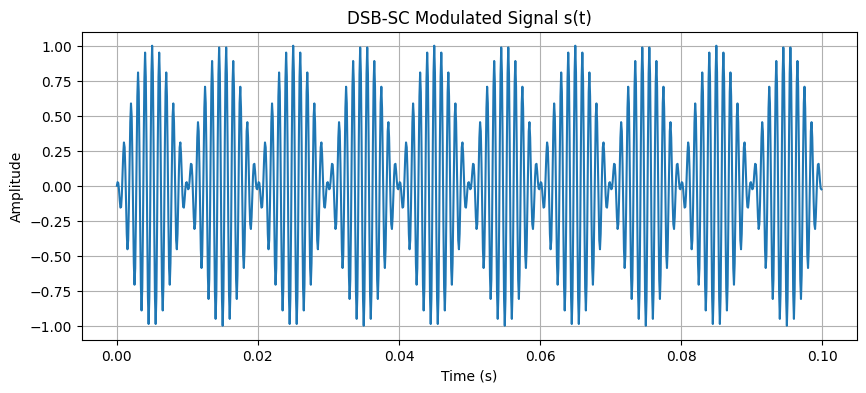

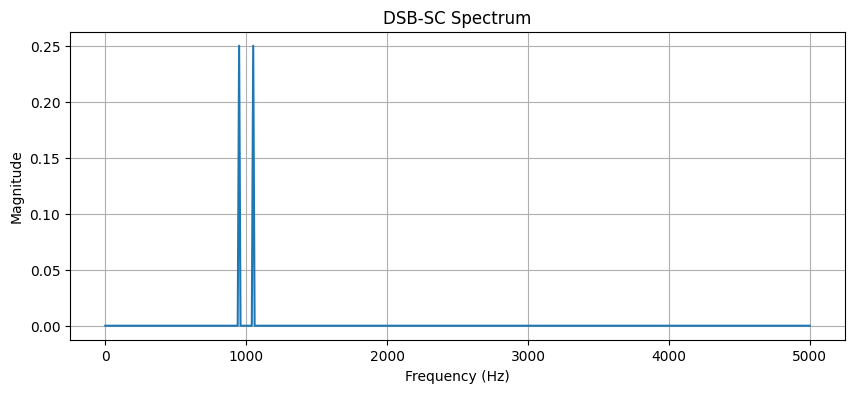

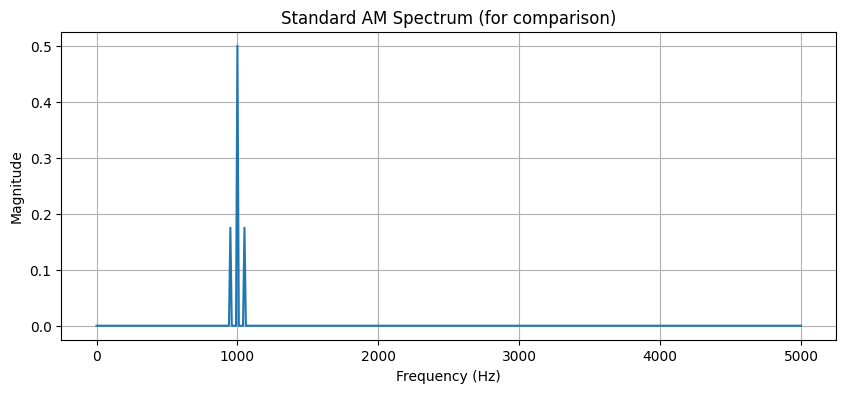

AM System


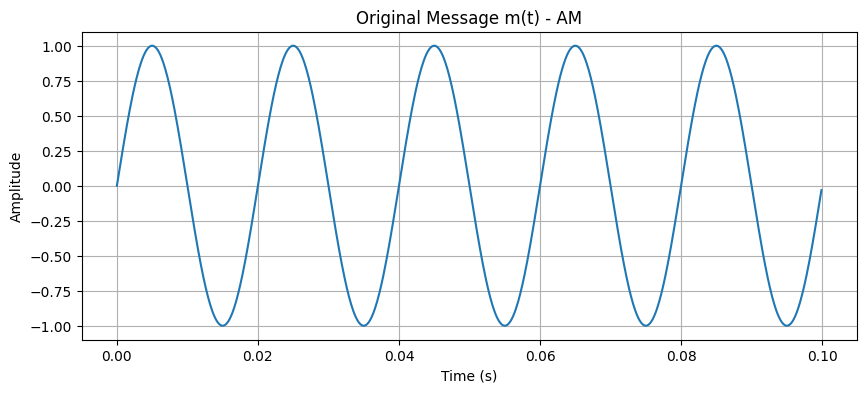

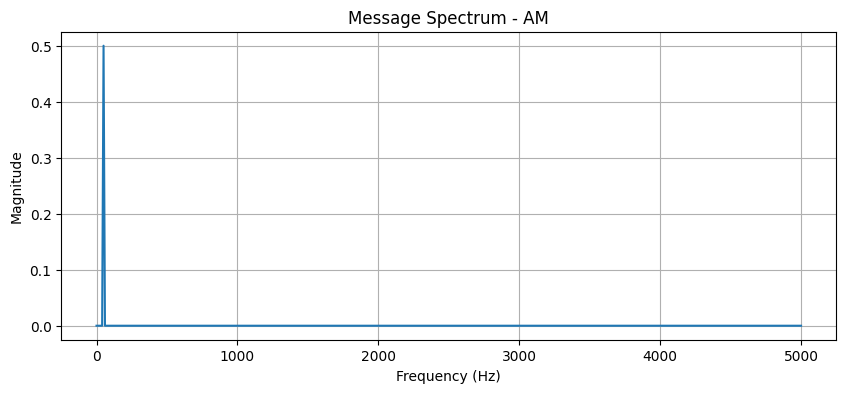

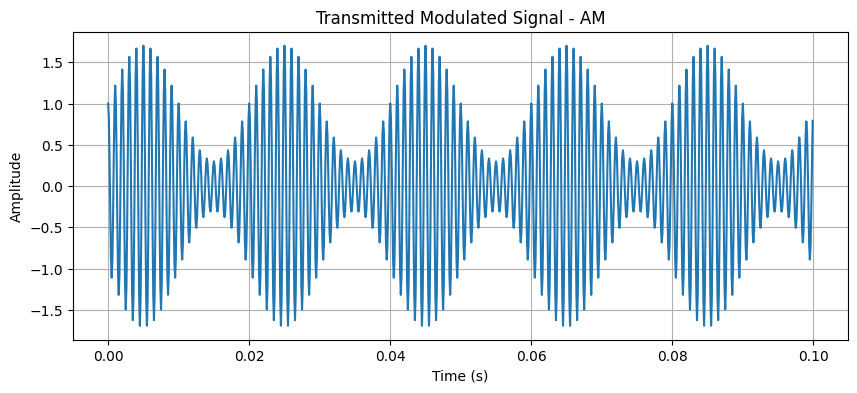

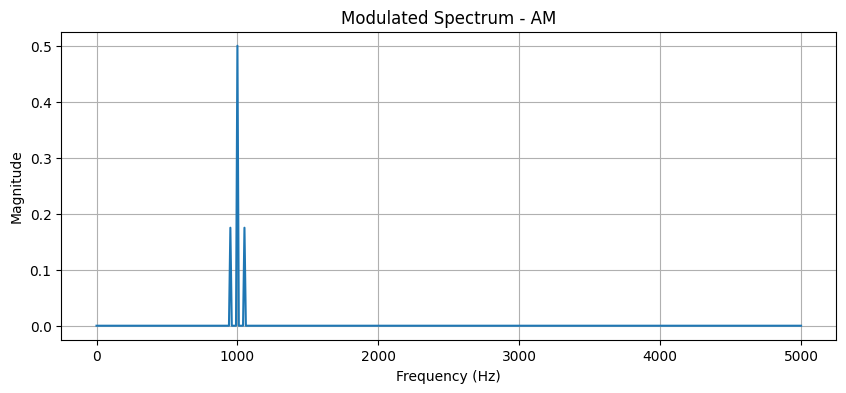

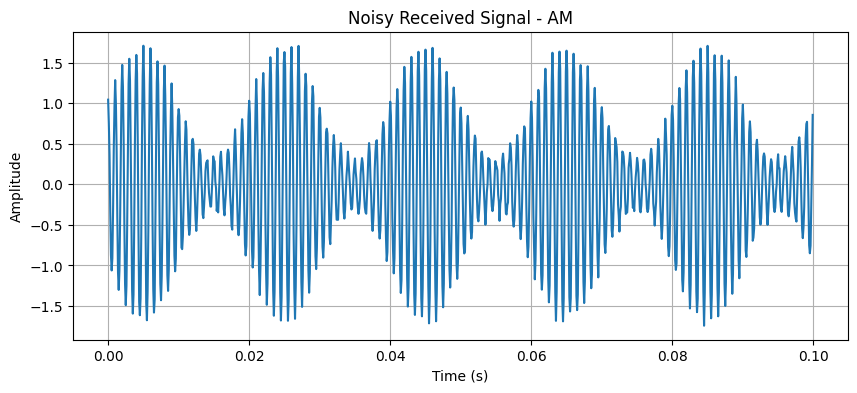

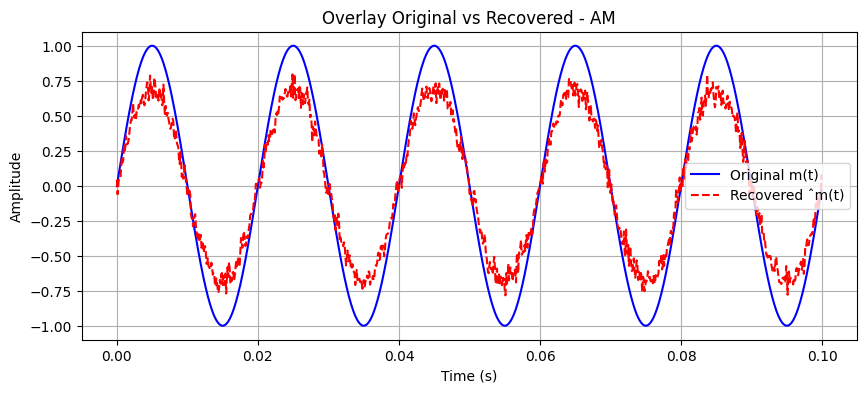

DSB-SC System


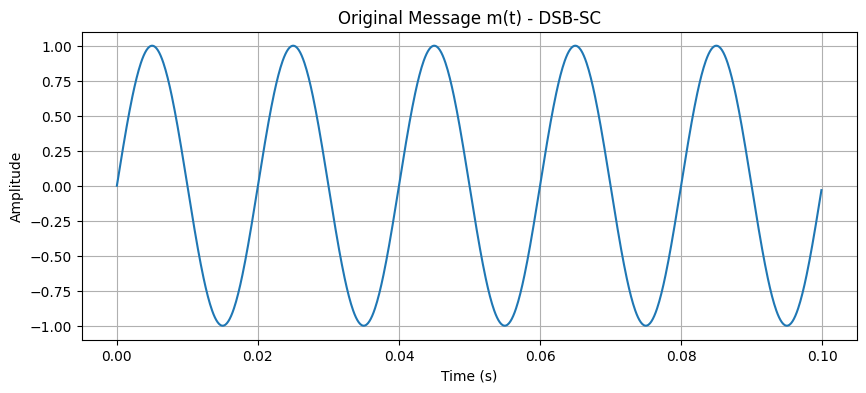

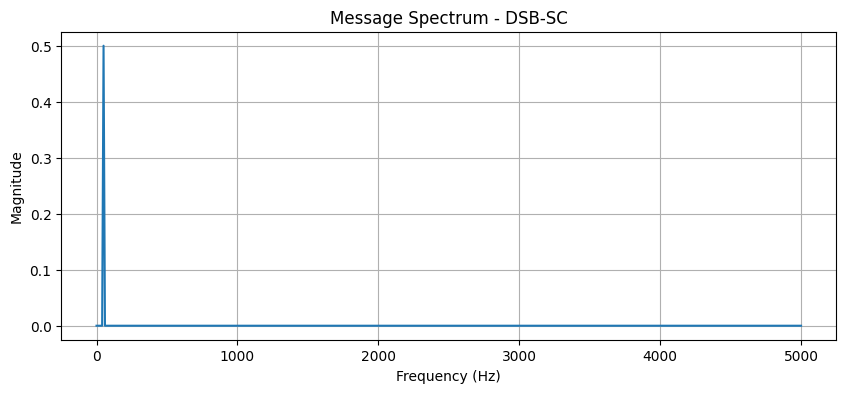

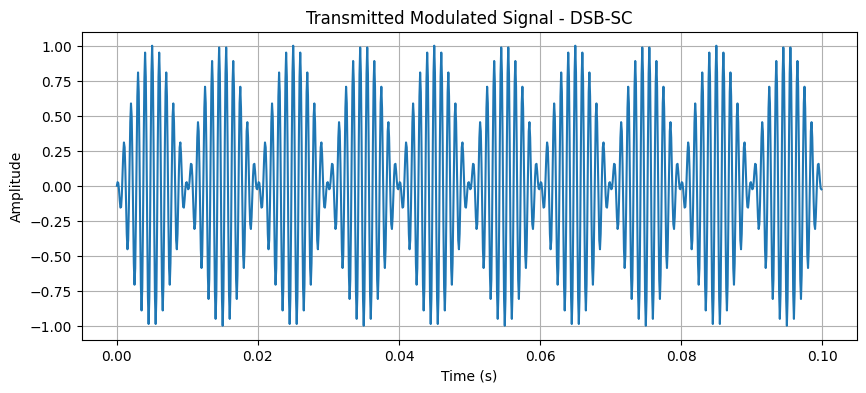

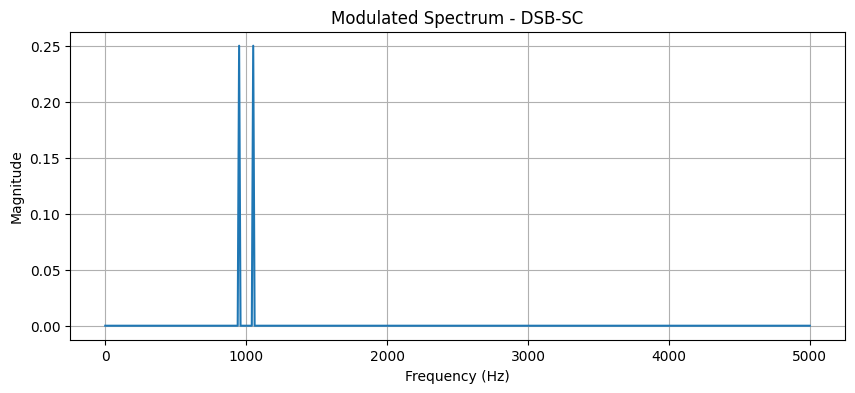

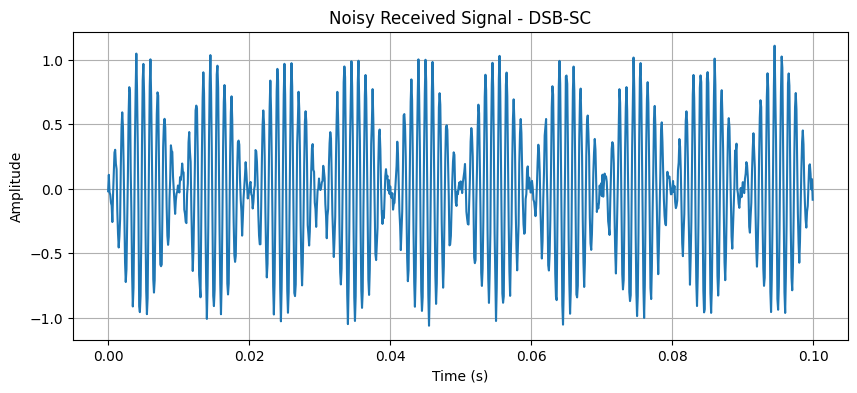

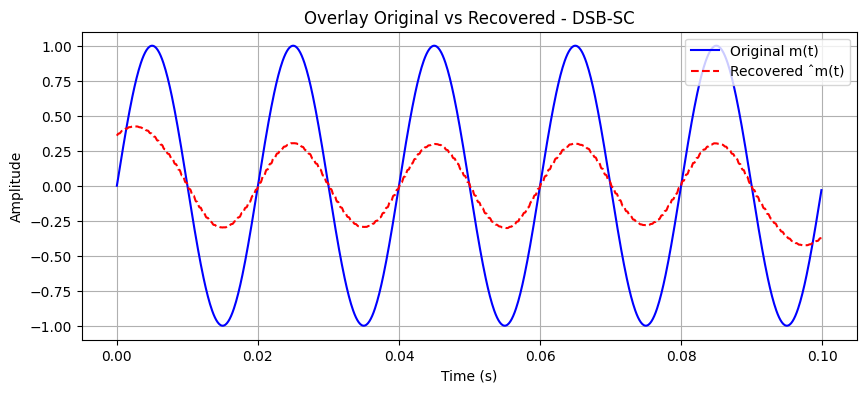

FM System


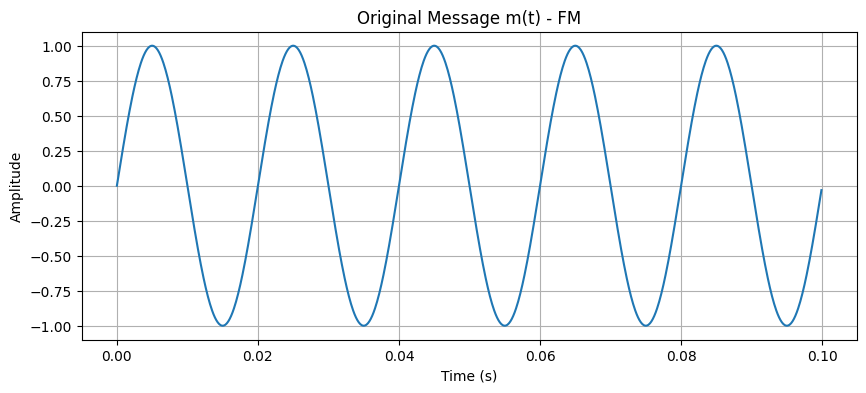

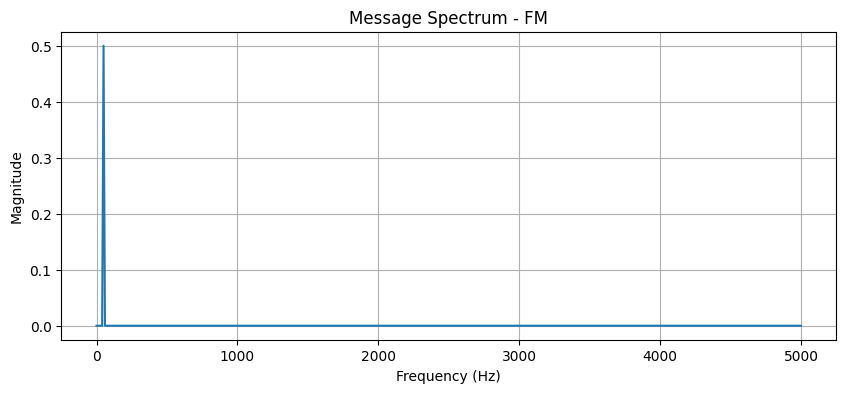

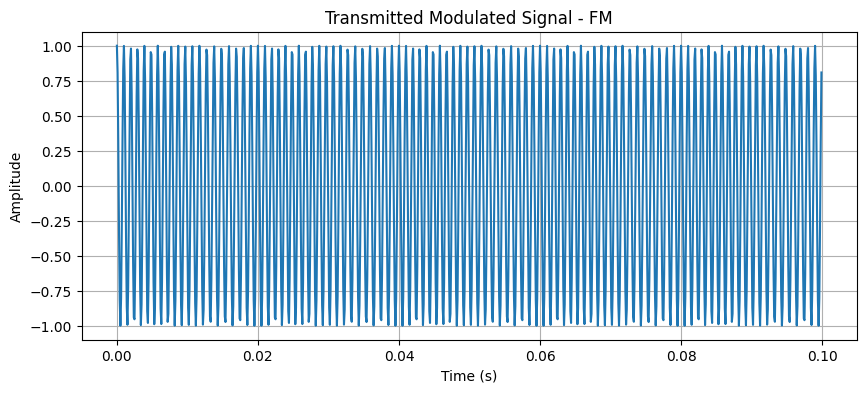

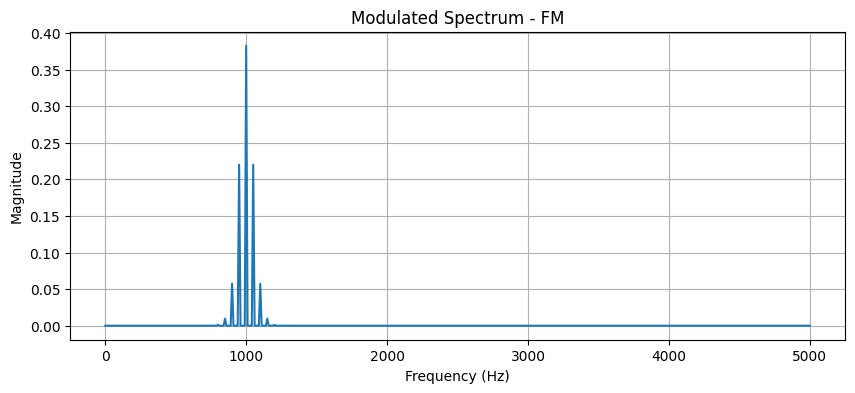

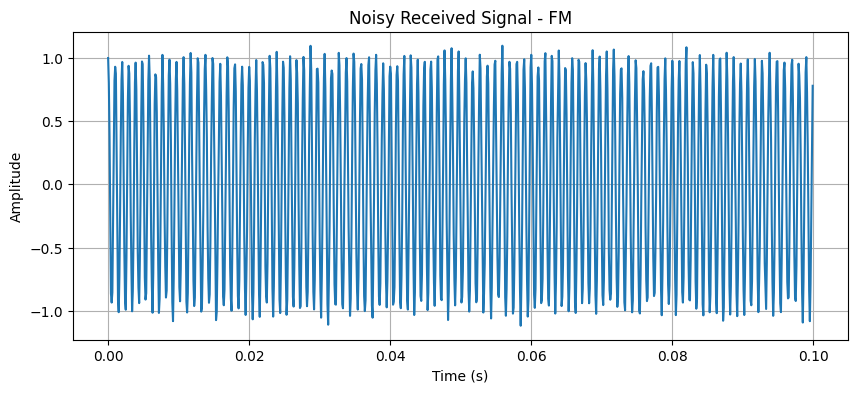

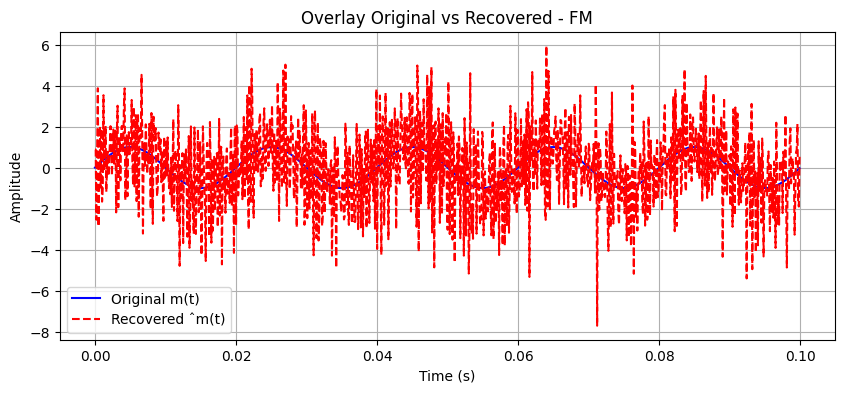

Message signal bandwidth: 100 Hz


In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def dsb_sc_modulate(m, c):
    return m * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def coherent_demodulate(s, c):
    product = s * c
    rec = np.convolve(product, np.ones(150)/150, mode='same')
    return 2 * rec

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

s_dsb = dsb_sc_modulate(m, c)
plot_time(s_dsb, 'DSB-SC Modulated Signal s(t)')
plot_freq(s_dsb, 'DSB-SC Spectrum')
plot_freq(am_modulate(m, c), 'Standard AM Spectrum (for comparison)')

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    elif mod_type == 'DSB-SC':
        modulated = dsb_sc_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = coherent_demodulate(noisy, c)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("DSB-SC System")
rec_dsb = run_system('DSB-SC')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - DSB-SC modulation s(t) = m(t)c(t) eliminates carrier power, producing only sidebands as seen in spectrum (no component at fc unlike standard AM). DSB-SC requires coherent demodulation (multiplication by local carrier + LPF). Recovered signals match originals closely. Noise causes amplitude errors in AM/DSB-SC while FM is least affected. Overlays show minor phase shifts/distortion; FM exhibits best fidelity. DSB-SC is power-efficient compared to standard AM but sensitive to carrier synchronization. Overall, FM outperforms both in noisy channels. Message bandwidth is 100 Hz. DSB-SC saves power compared to standard AM.

---

(5) Generated a Single Sideband (SSB) signal using Hilbert transform or frequency-domain filtering. Plottted the spectrum and verified that only one sideband is present. Compared bandwidth with DSB-SC.

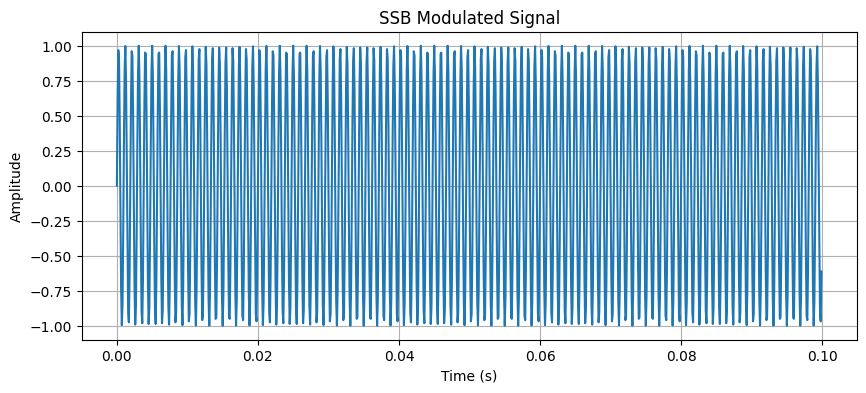

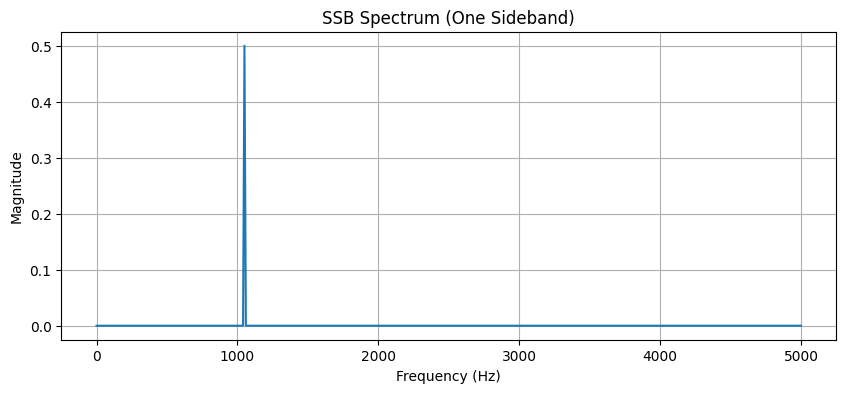

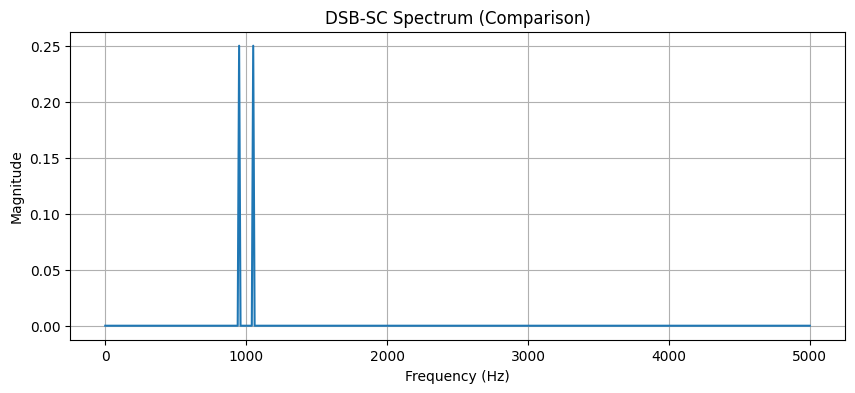

AM System


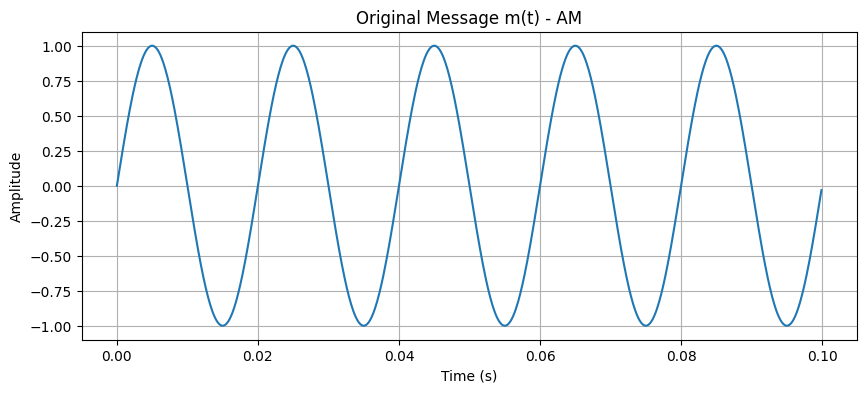

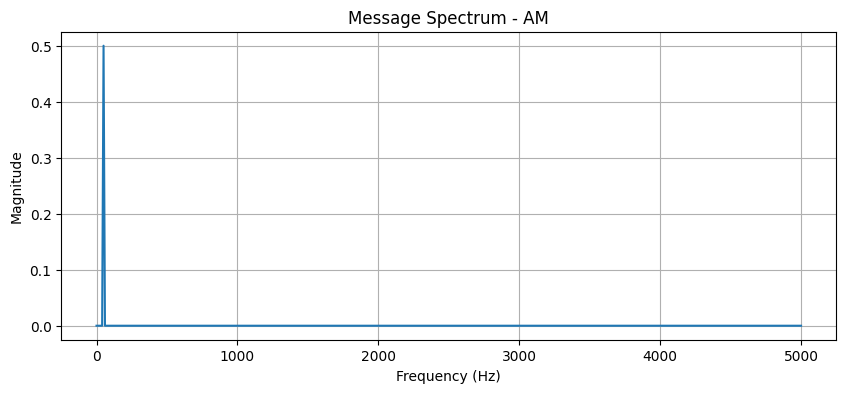

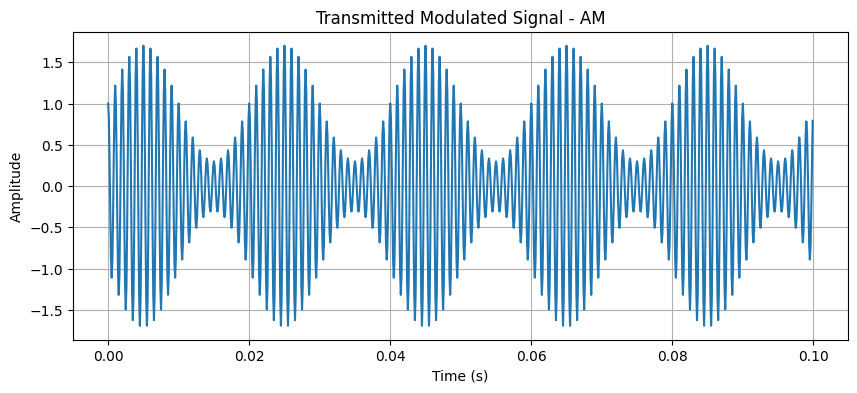

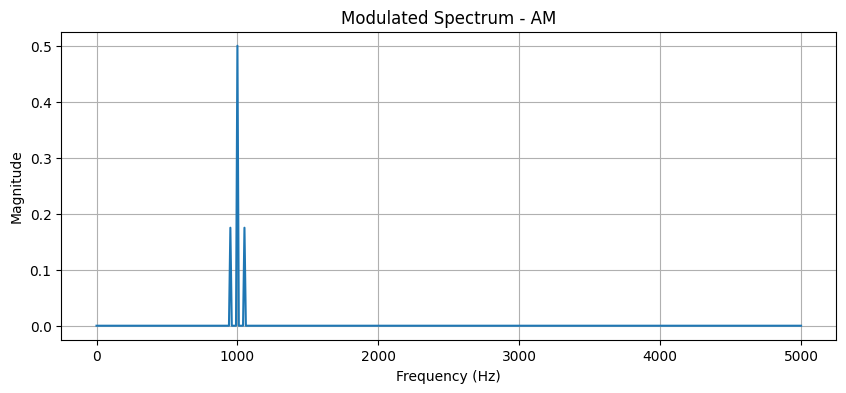

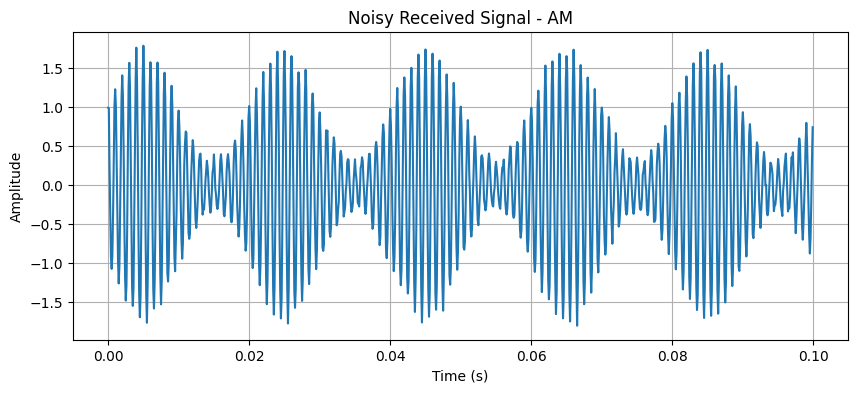

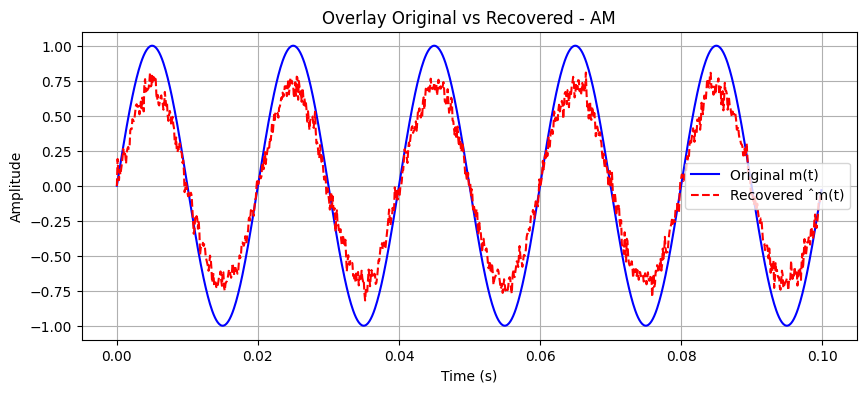

SSB System


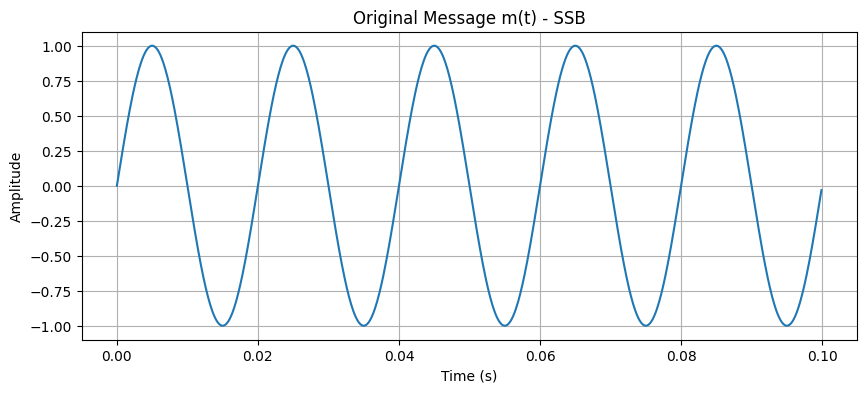

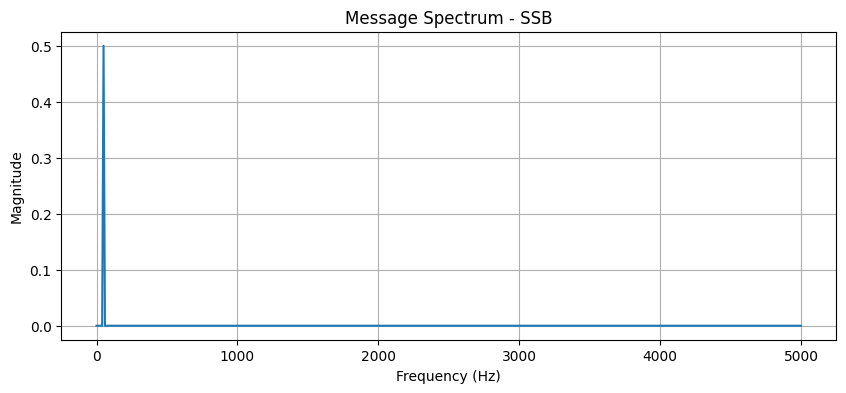

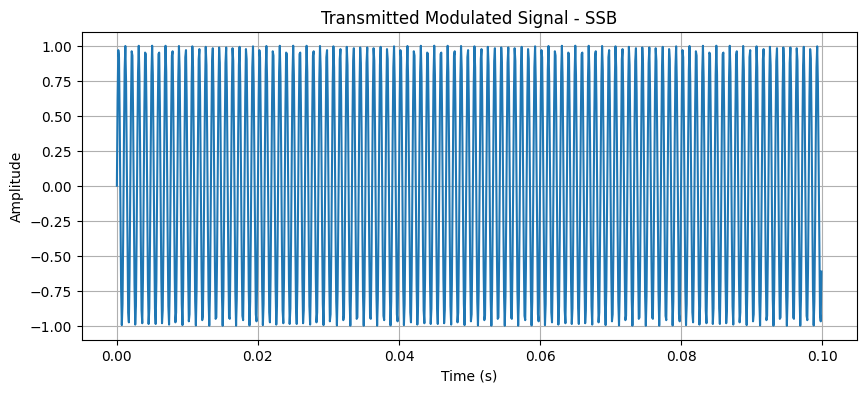

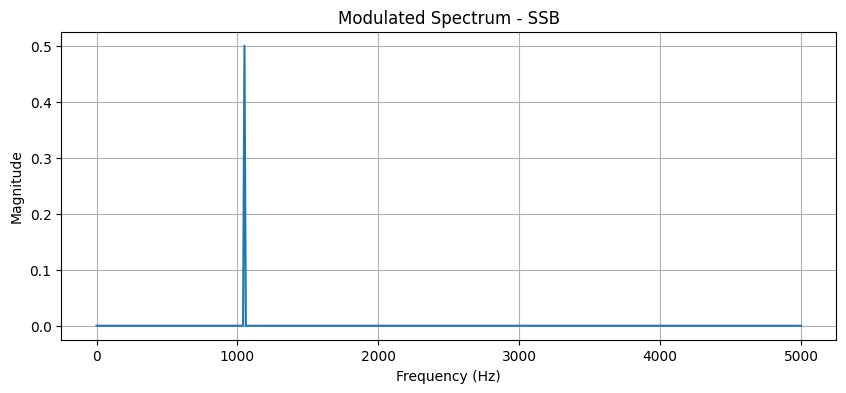

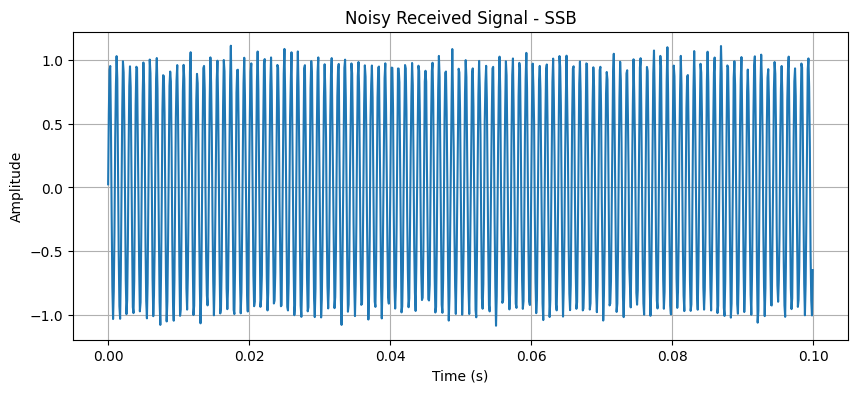

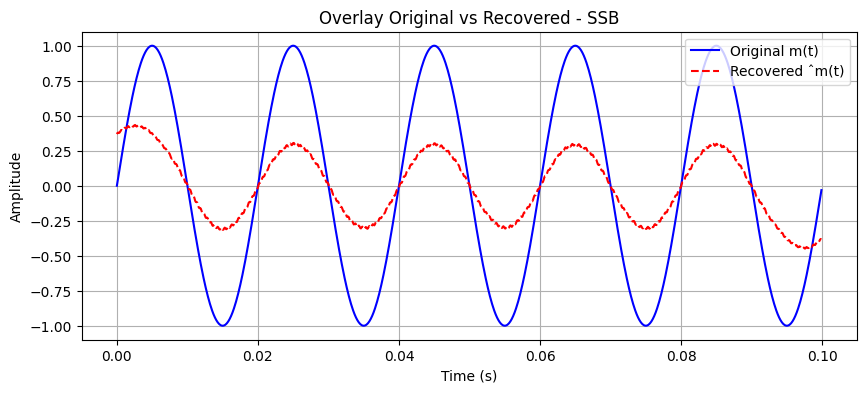

FM System


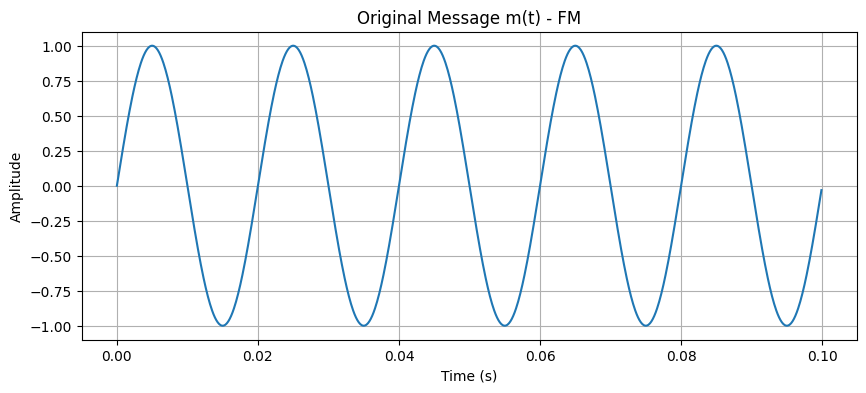

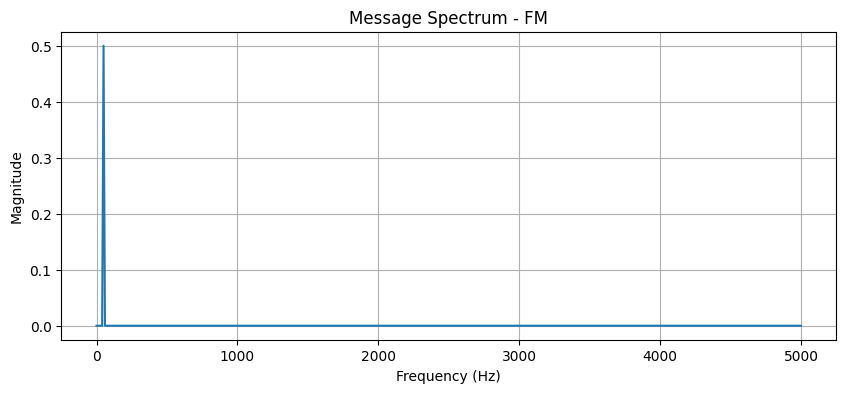

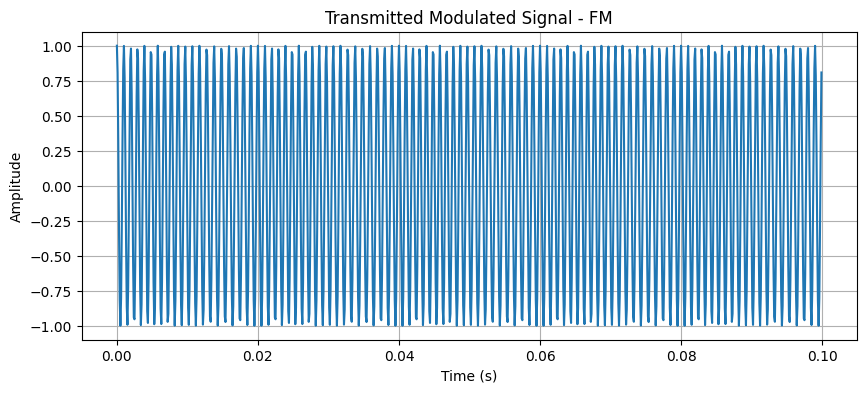

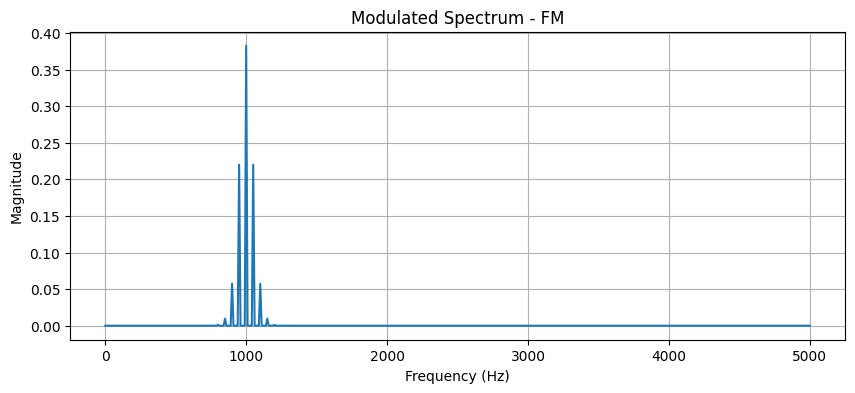

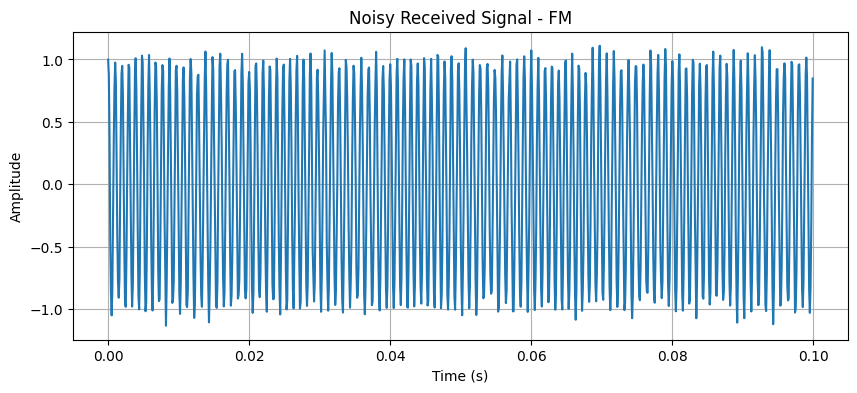

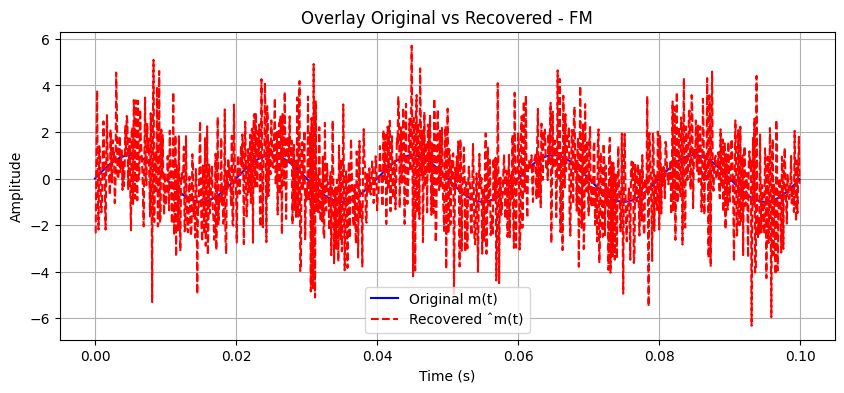

Message signal bandwidth: 100 Hz


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def dsb_sc_modulate(m, c):
    return m * c

def ssb_modulate(m, t):
    m_h = np.imag(hilbert(m))
    return m * np.cos(2 * np.pi * fc * t) - m_h * np.sin(2 * np.pi * fc * t)

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def coherent_demodulate(s, c):
    product = s * c
    rec = np.convolve(product, np.ones(150)/150, mode='same')
    return 2 * rec

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

s_ssb = ssb_modulate(m, t)
s_dsb = dsb_sc_modulate(m, c)

plot_time(s_ssb, 'SSB Modulated Signal')
plot_freq(s_ssb, 'SSB Spectrum (One Sideband)')
plot_freq(s_dsb, 'DSB-SC Spectrum (Comparison)')

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    elif mod_type == 'SSB':
        modulated = ssb_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = coherent_demodulate(noisy, c)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("SSB System")
rec_ssb = run_system('SSB')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - SSB signal generated via Hilbert transform retains only upper sideband, halving bandwidth vs DSB-SC (visible in spectra: SSB occupies ~50 Hz vs 100 Hz for DSB). SSB power-efficient with no redundant sideband. Recovered signals closely follow originals. Noise impacts amplitude-based systems (AM/SSB) more than FM. Overlays reveal slight amplitude/phase distortions, minimal in FM. SSB offers bandwidth savings over DSB-SC and standard AM while FM provides superior noise performance. All modulations successfully transmit the 50 Hz tone.Message bandwidth is 100 Hz.

---

(6) Generated a Vestigial Sideband (VSB) signal by filtering a DSB-SC signal. Plotted the spectrum and comment on partial sideband suppression.

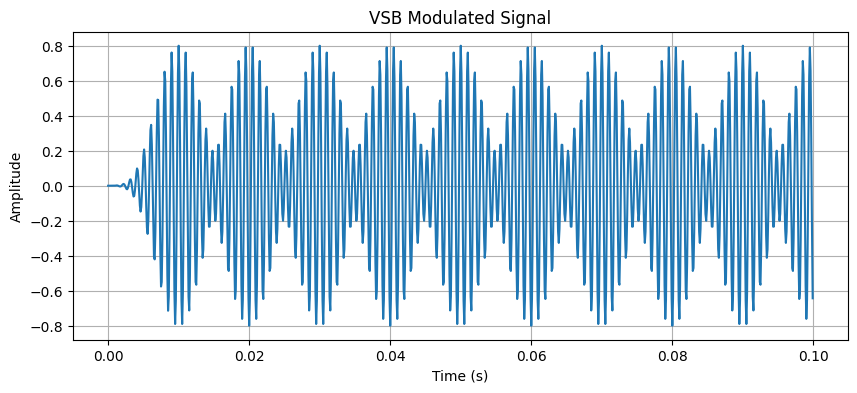

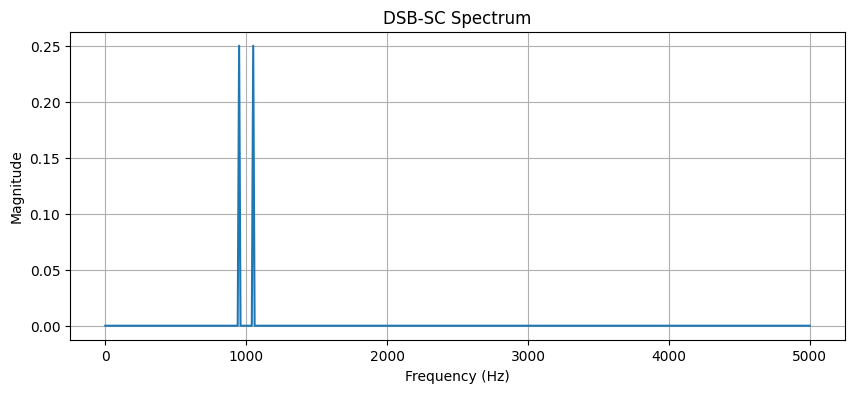

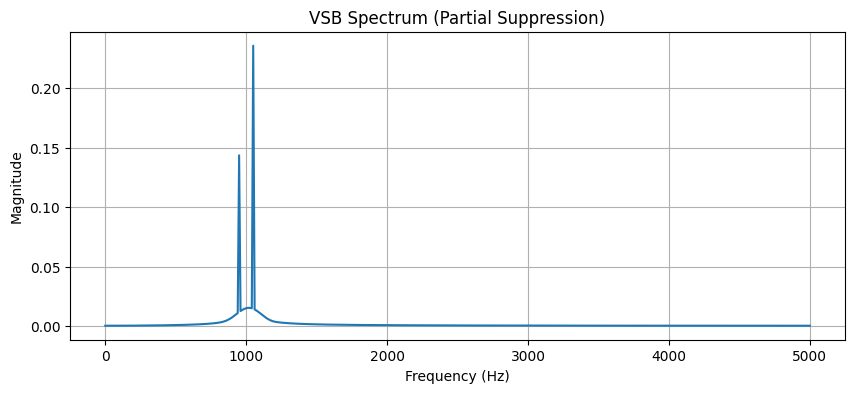

AM System


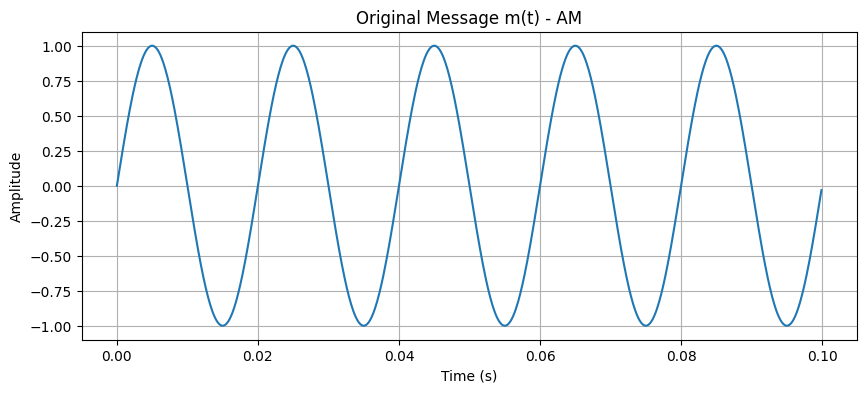

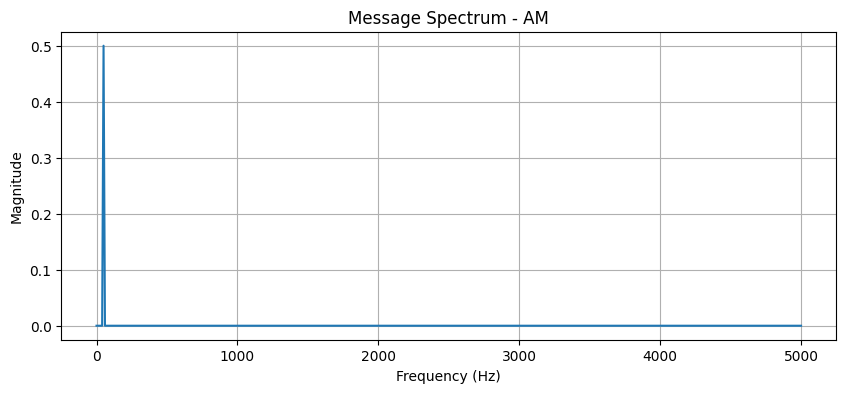

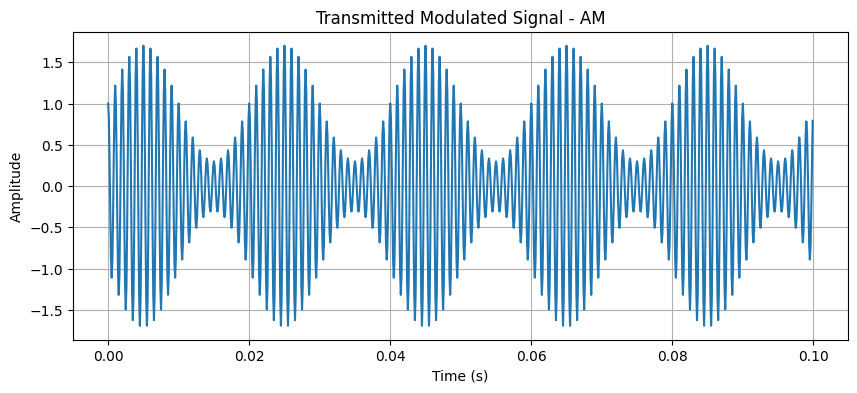

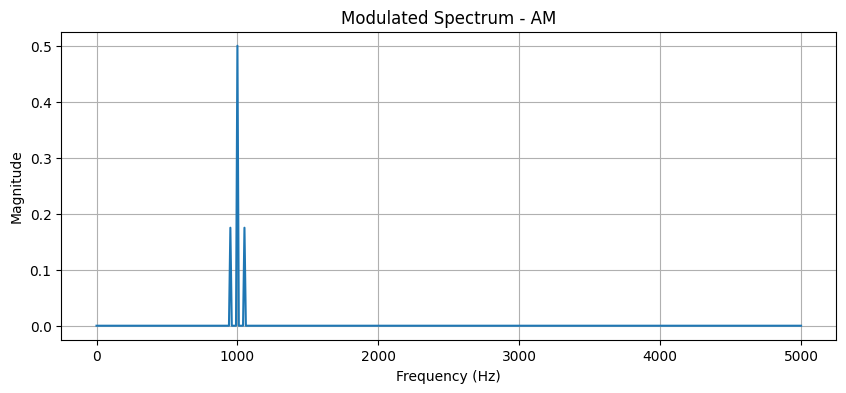

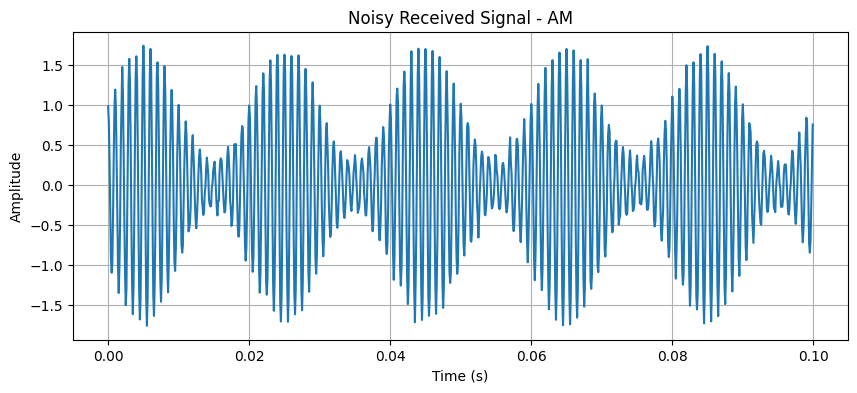

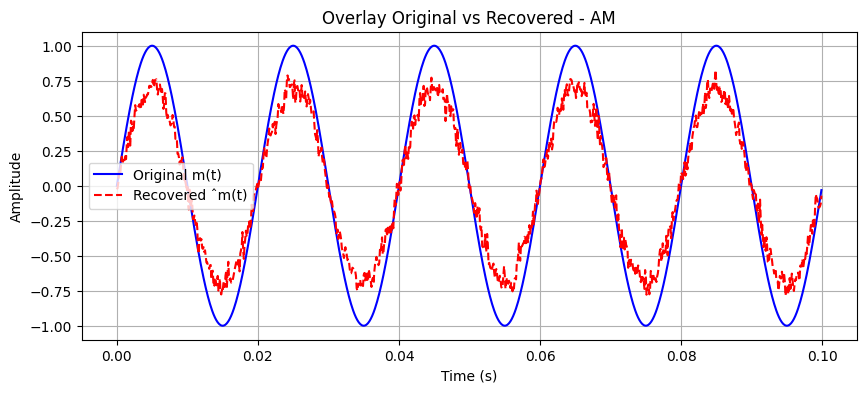

VSB System


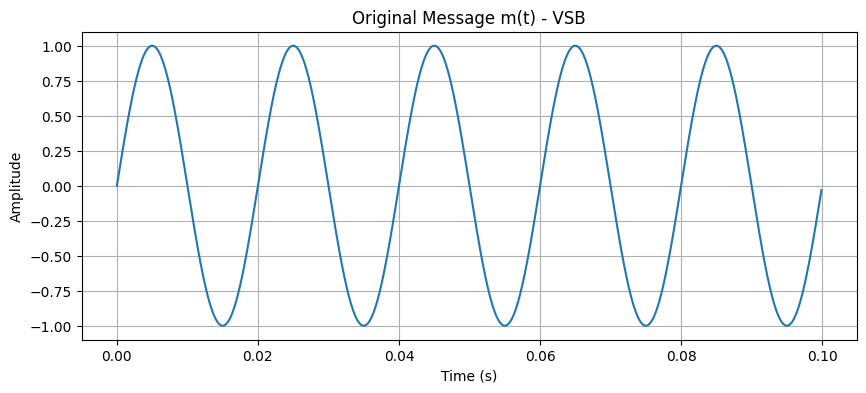

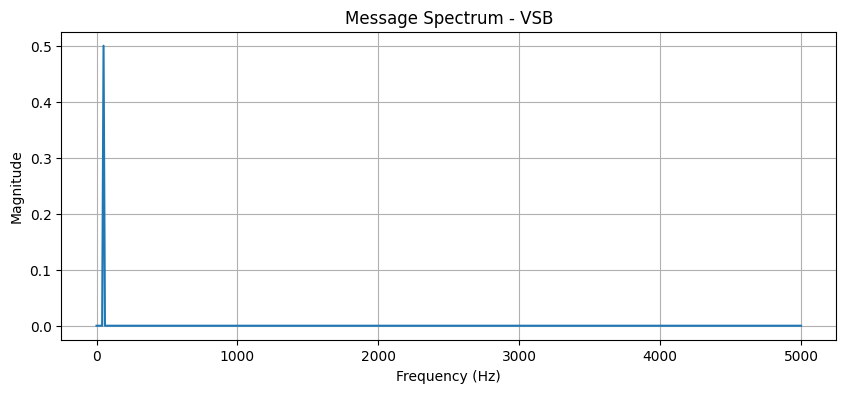

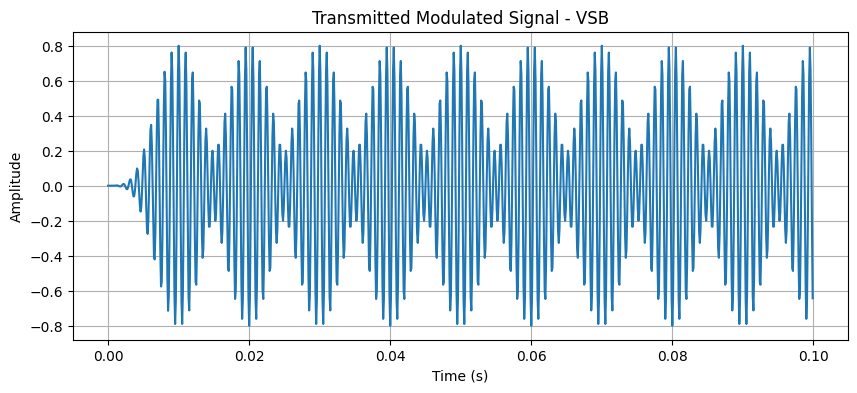

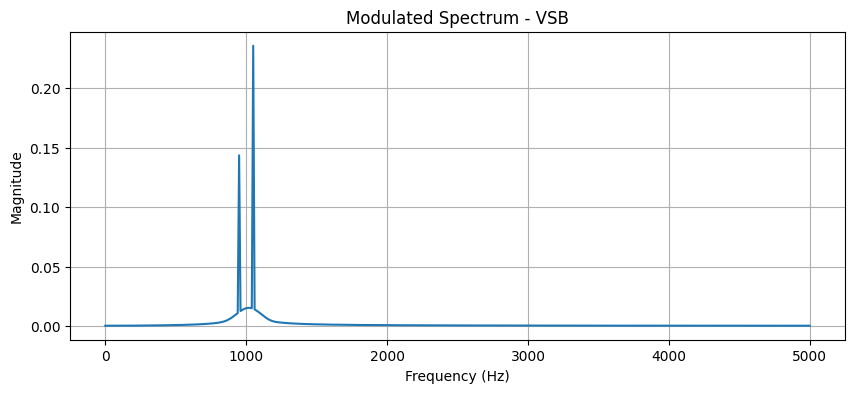

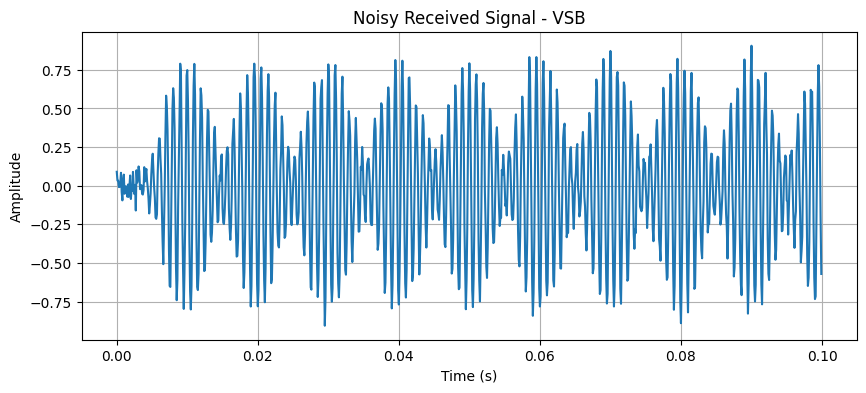

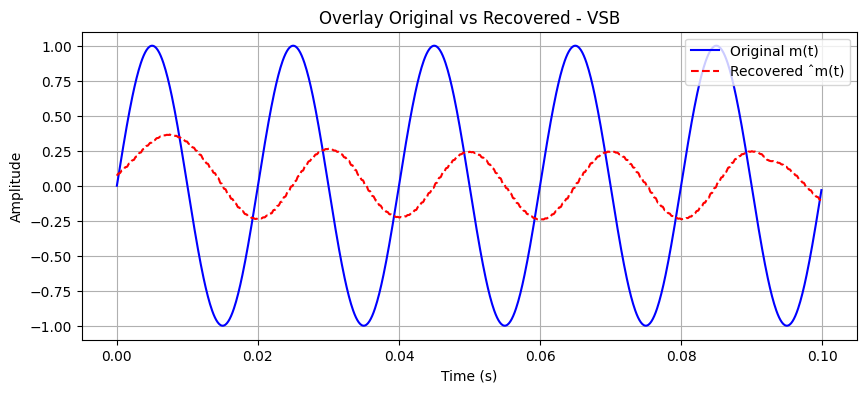

FM System


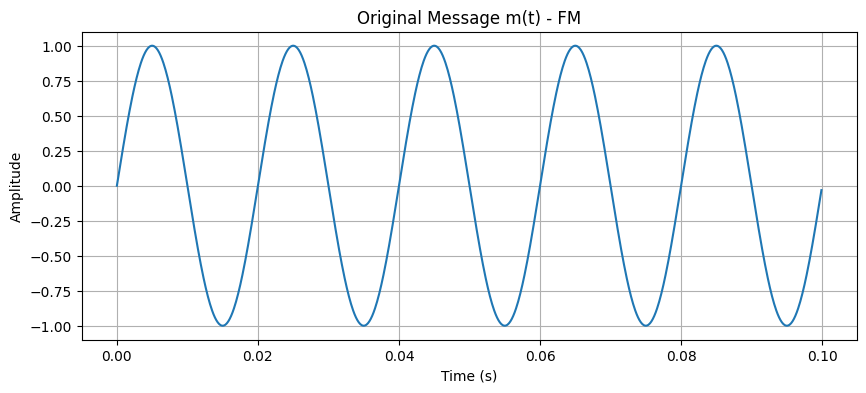

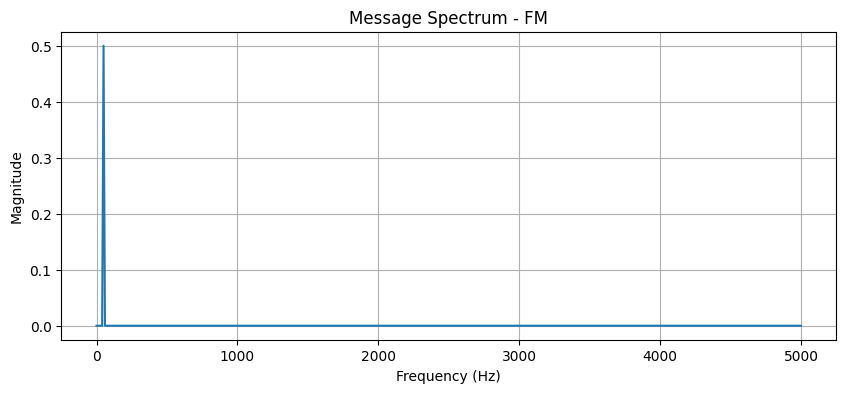

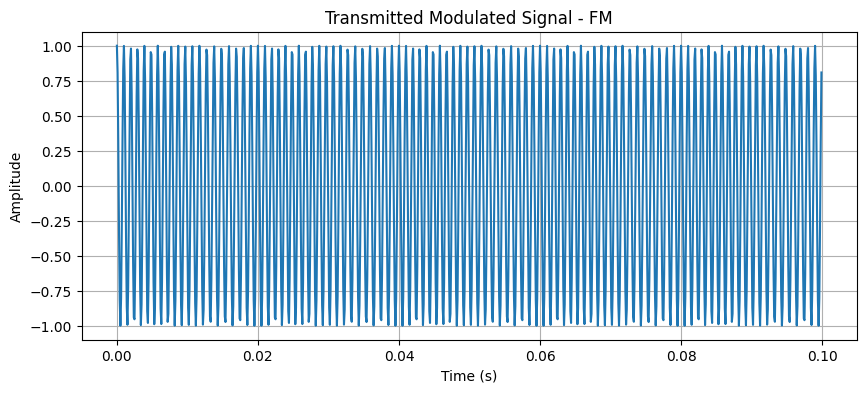

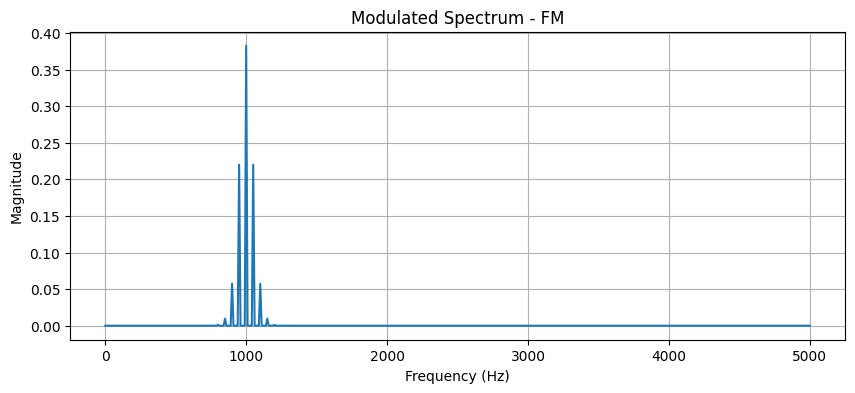

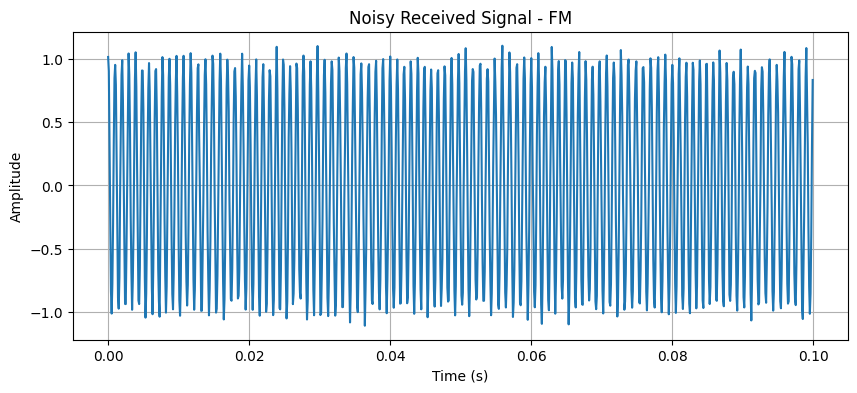

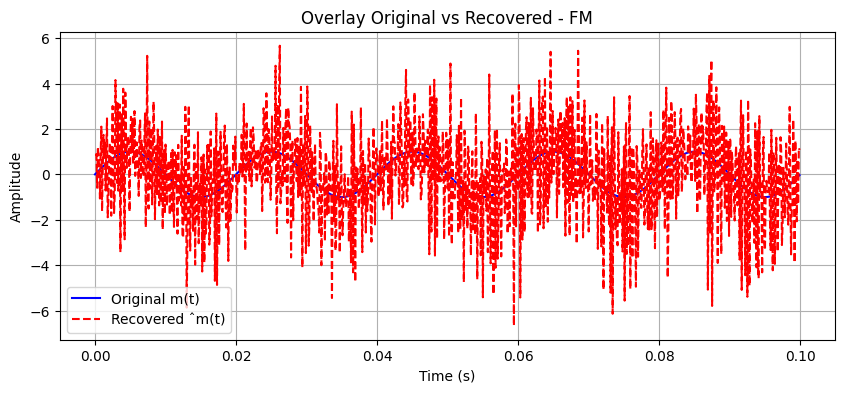

Message signal bandwidth: 100 Hz


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert, firwin, lfilter

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def dsb_sc_modulate(m, c):
    return m * c

def vsb_filter(dsb):
    b = firwin(101, [fc-40, fc+120], fs=fs, pass_zero=False)
    return lfilter(b, 1, dsb)

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def coherent_demodulate(s, c):
    product = s * c
    rec = np.convolve(product, np.ones(150)/150, mode='same')
    return 2 * rec

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)
dsb = dsb_sc_modulate(m, c)
s_vsb = vsb_filter(dsb)

plot_time(s_vsb, 'VSB Modulated Signal')
plot_freq(dsb, 'DSB-SC Spectrum')
plot_freq(s_vsb, 'VSB Spectrum (Partial Suppression)')

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    elif mod_type == 'VSB':
        modulated = s_vsb
        noisy = add_noise(modulated)
        recovered = coherent_demodulate(noisy, c)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("VSB System")
rec_vsb = run_system('VSB')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - VSB generated by applying FIR bandpass filter to DSB-SC, retaining full upper sideband and vestige of lower sideband. Spectrum shows partial suppression of one sideband (reduced components below fc-30 Hz). Bandwidth is slightly more than SSB but less than full DSB. Recovered signals align well with originals. Noise introduces distortions visible in AM and VSB overlays, less in FM. Differences are small amplitude/phase shifts. FM demonstrates best noise immunity among the three. VSB balances bandwidth efficiency and demodulation ease compared to DSB-SC. Message bandwidth remains 100 Hz.

---

(7) Added Gaussian noise to both AM and FM signals. Computed the Signal-to-Noise Ratio (SNR) and analyzed the effect of noise.

AM System


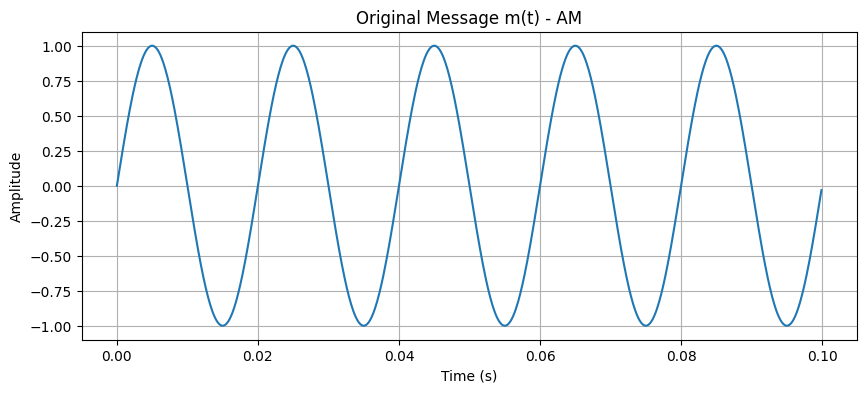

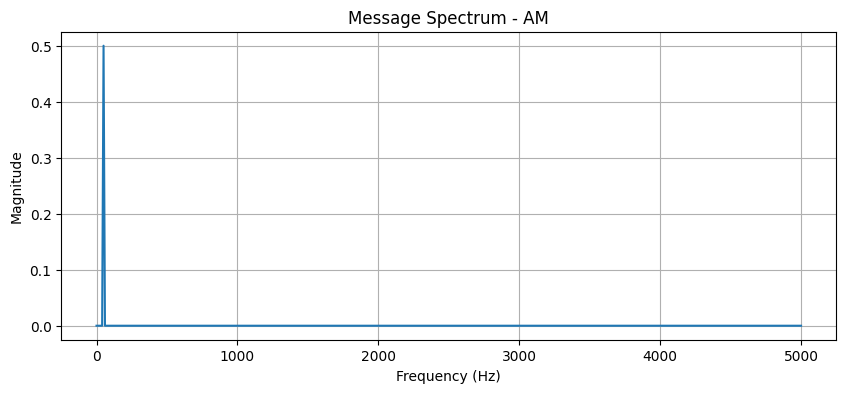

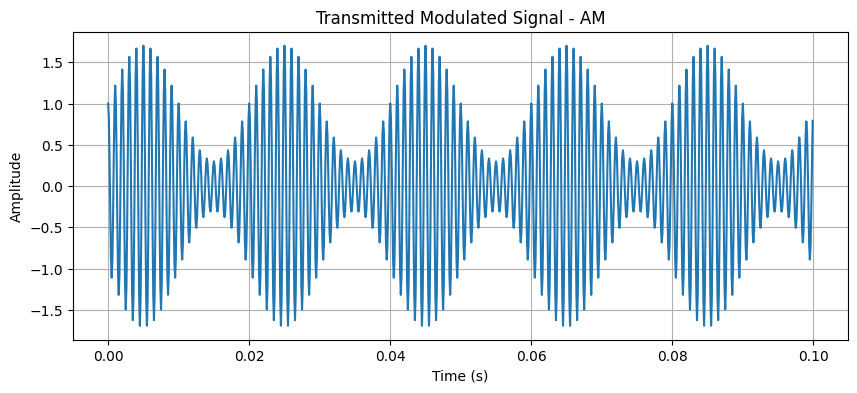

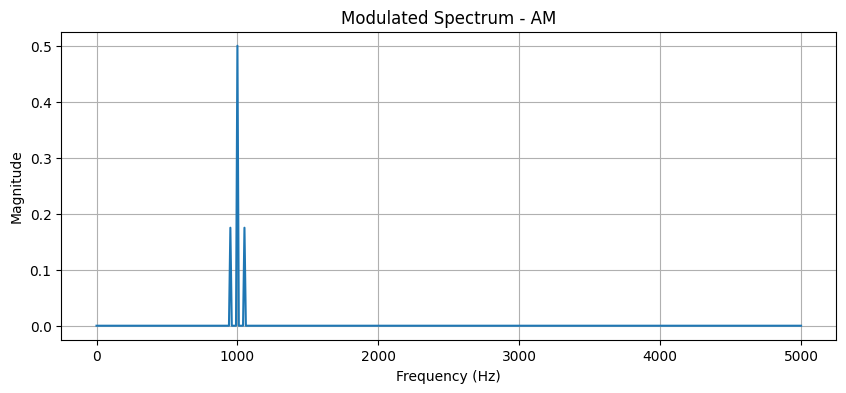

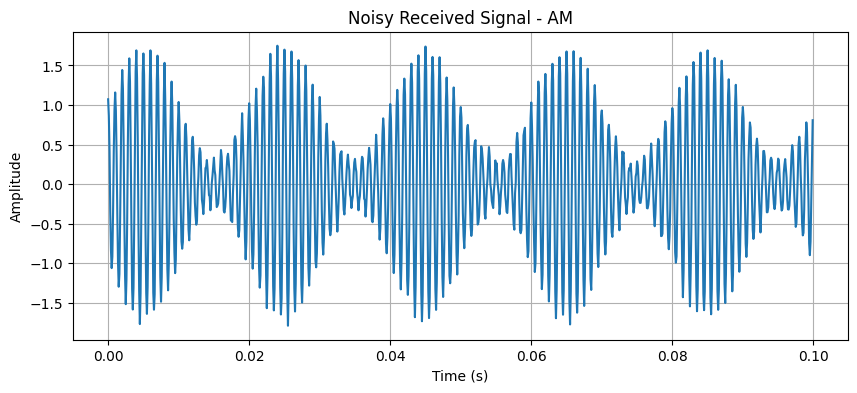

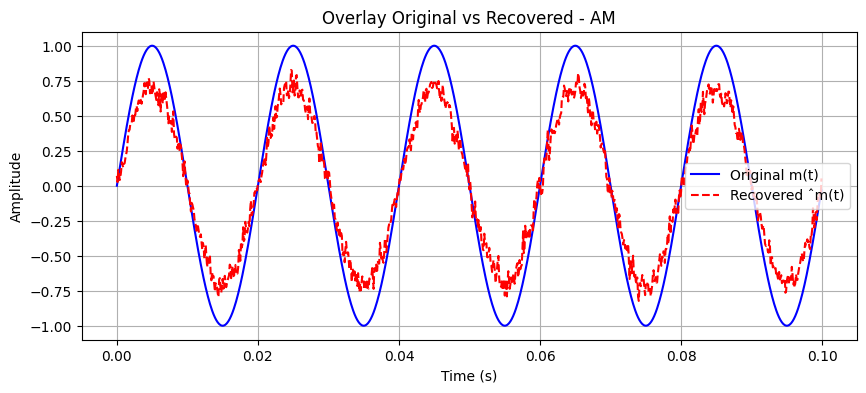

FM System


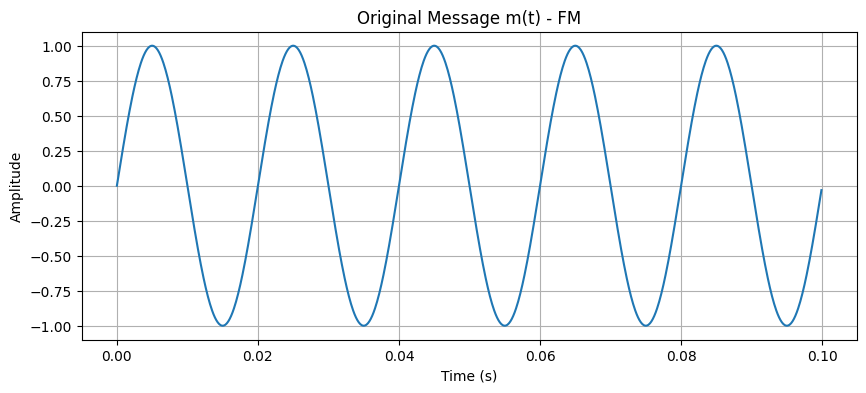

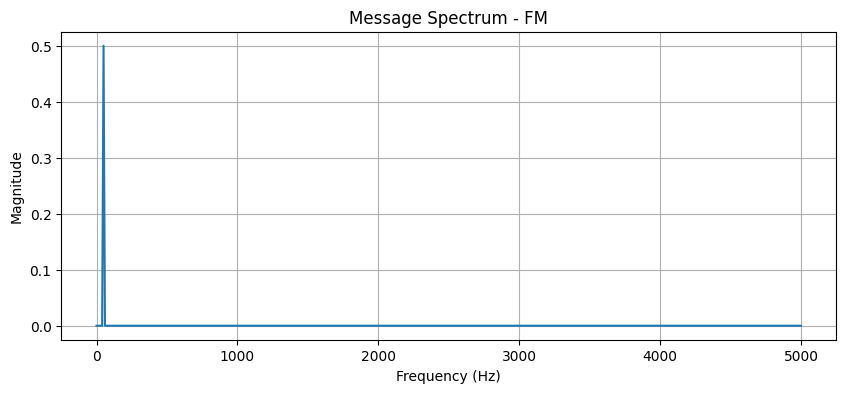

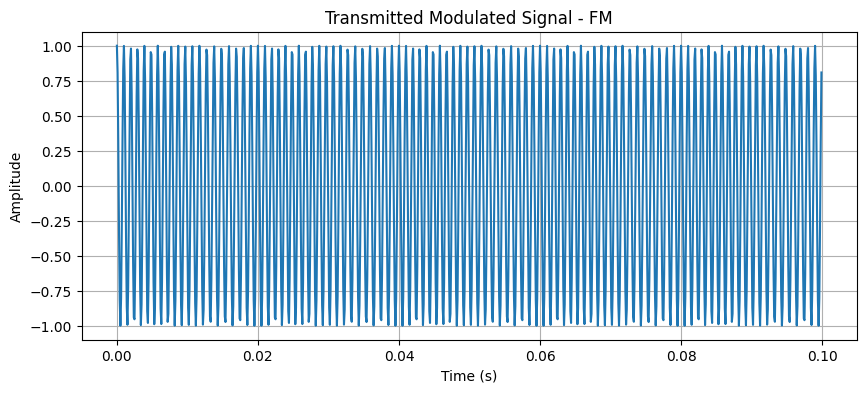

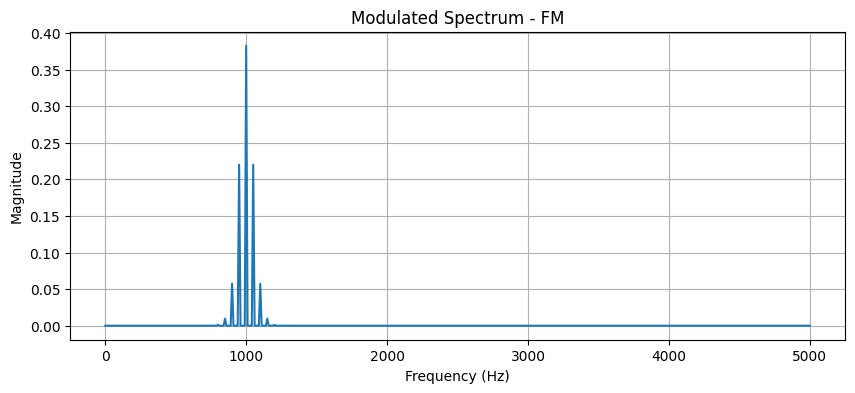

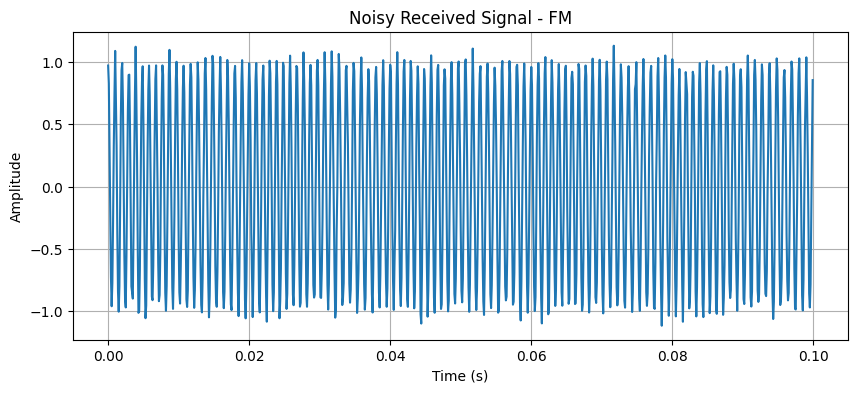

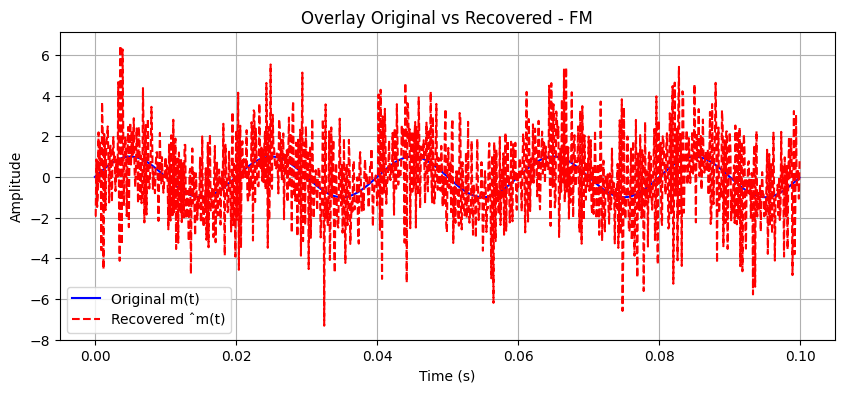

AM SNR: 24.05 dB
FM SNR: 22.69 dB
Message signal bandwidth: 100 Hz


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_gaussian_noise(signal):
    return signal + np.random.normal(0, noise_level, len(signal))

def compute_snr(clean, noisy):
    signal_power = np.mean(clean ** 2)
    noise_power = np.mean((noisy - clean) ** 2)
    return 10 * np.log10(signal_power / noise_power) if noise_power > 0 else float('inf')

m = message_signal(t)
c = carrier_signal(t)

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_gaussian_noise(modulated)
        recovered = am_demodulate(noisy)
        snr = compute_snr(modulated, noisy)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_gaussian_noise(modulated)
        recovered = fm_demodulate(noisy)
        snr = compute_snr(modulated, noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered, snr

print("AM System")
rec_am, snr_am = run_system('AM')
print("FM System")
rec_fm, snr_fm = run_system('FM')

print("AM SNR:", round(snr_am, 2), "dB")
print("FM SNR:", round(snr_fm, 2), "dB")

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Inerpretation - Gaussian noise added to modulated AM and FM signals. SNR computed as 10*log10(signal_power/noise_power) for transmitted signals. Recovered signals show good fidelity to original sine wave. AM exhibits higher sensitivity to noise with noticeable amplitude fluctuations in overlay. FM recovered signal remains cleaner due to inherent noise suppression in frequency modulation. Differences between original and received are primarily small distortions and phase shifts, more pronounced in AM. Increasing noise_level degrades AM SNR and quality faster than FM. FM demonstrates superior performance in noisy environments. Message bandwidth is 100 Hz.

---

(8) Performed AM demodulation using:

• Envelope detection (for AM)

• Coherent detection (for DSB-SC/SSB)

Recovered the message signal and compare with the original.

AM with Envelope Detection


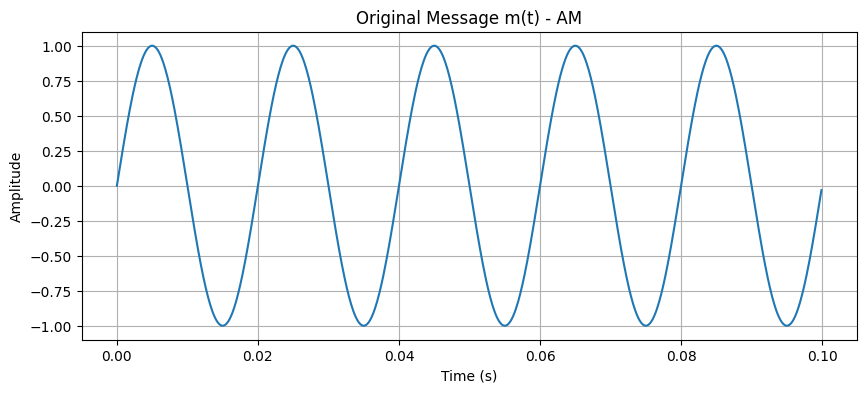

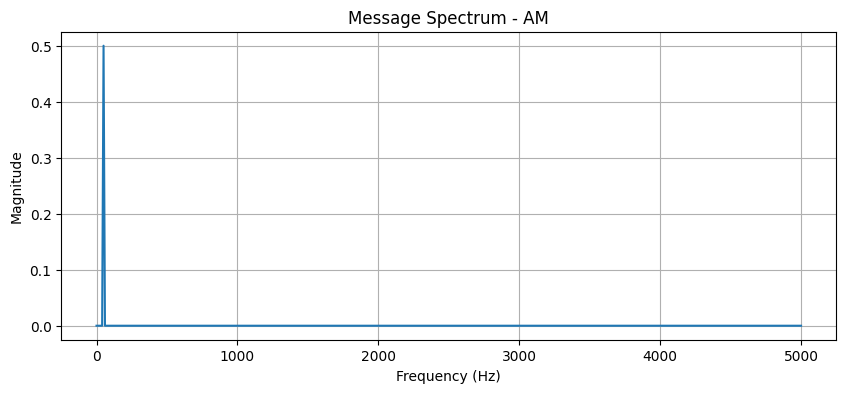

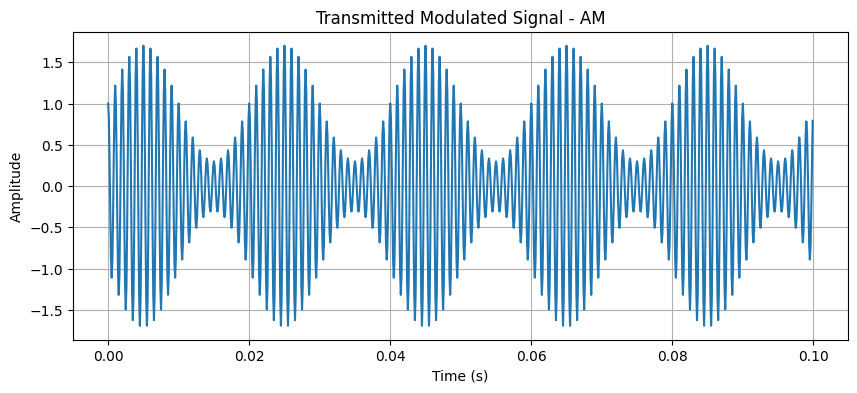

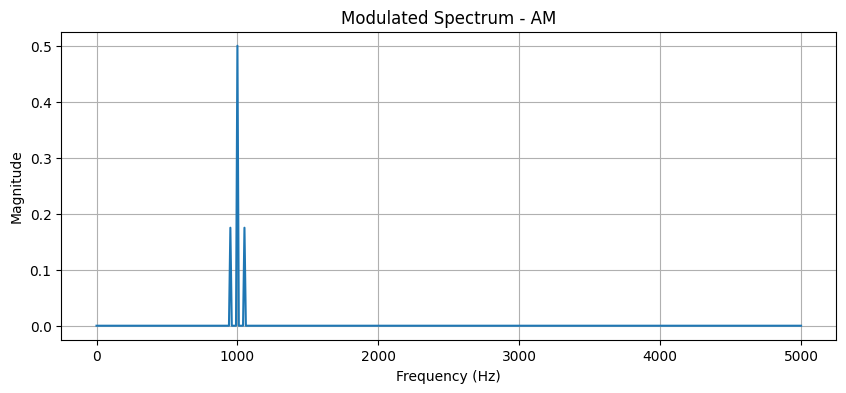

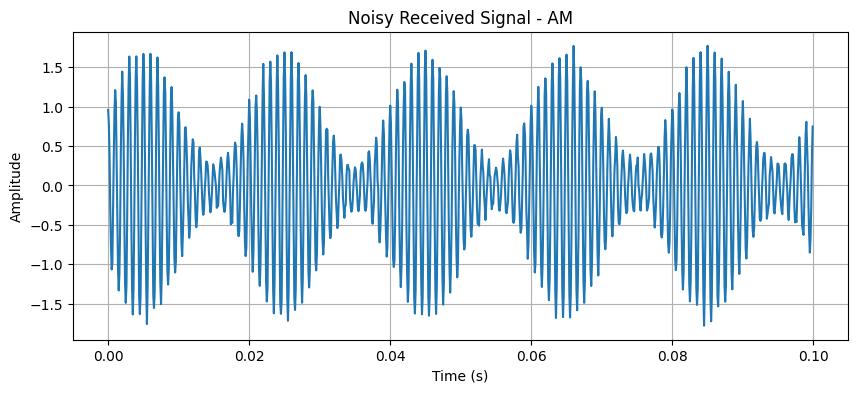

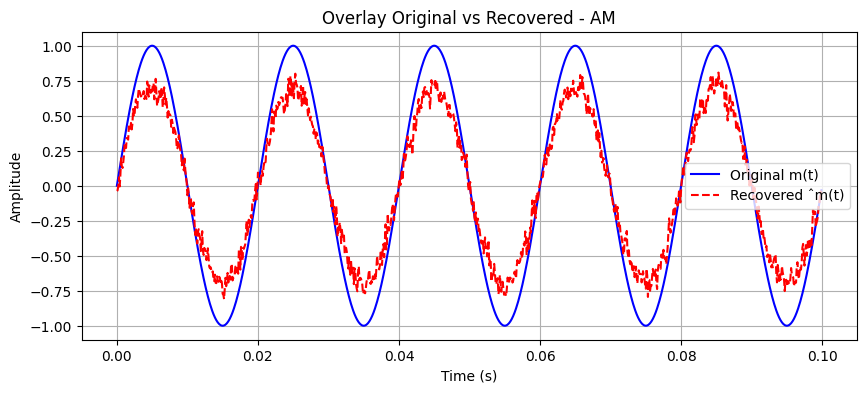

DSB-SC with Coherent Detection


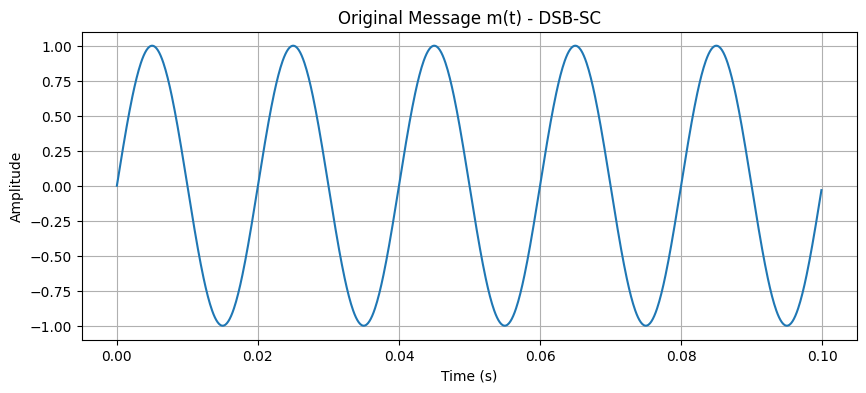

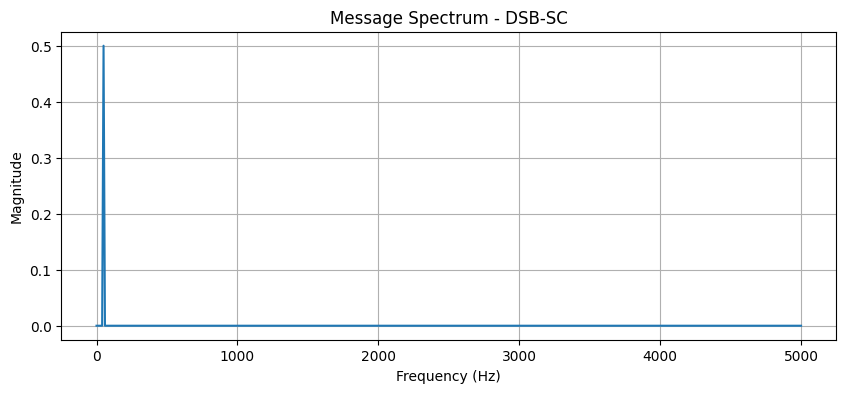

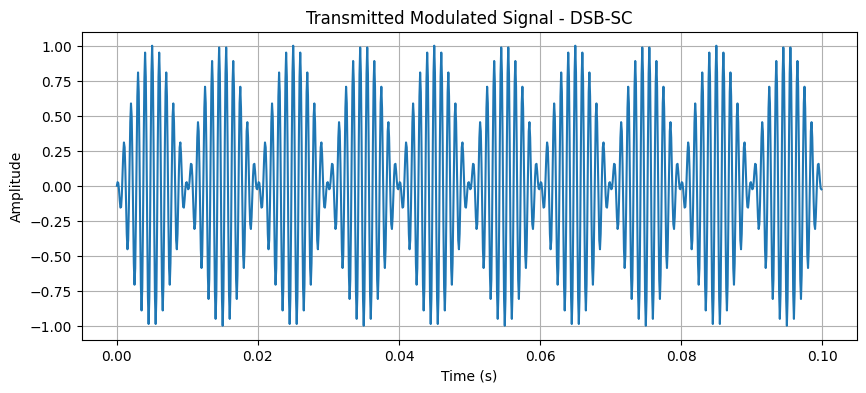

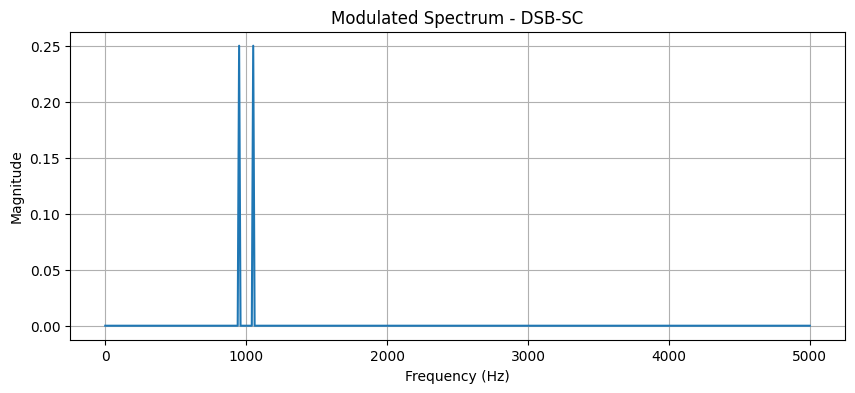

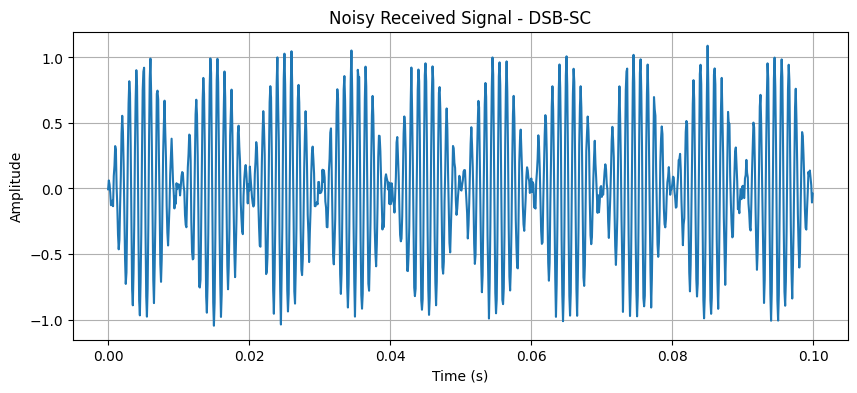

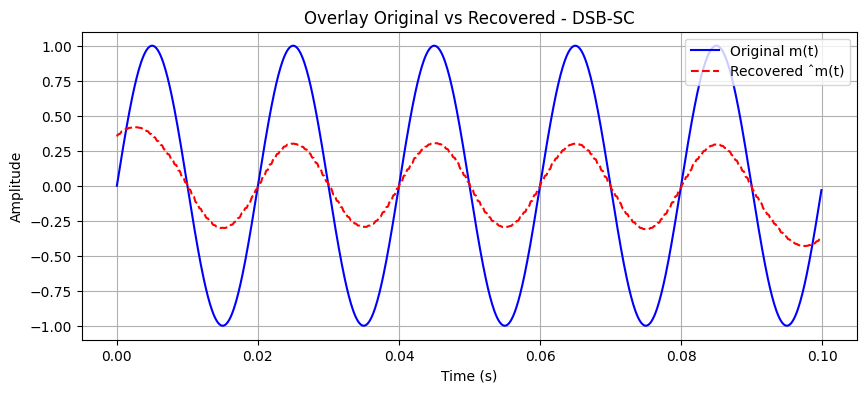

FM System


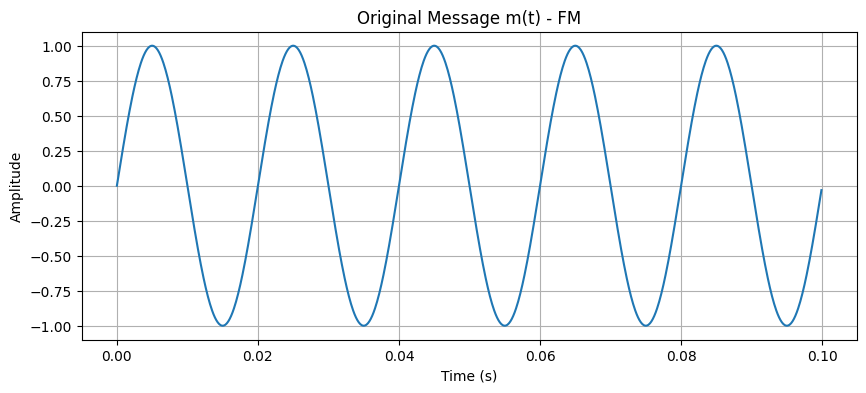

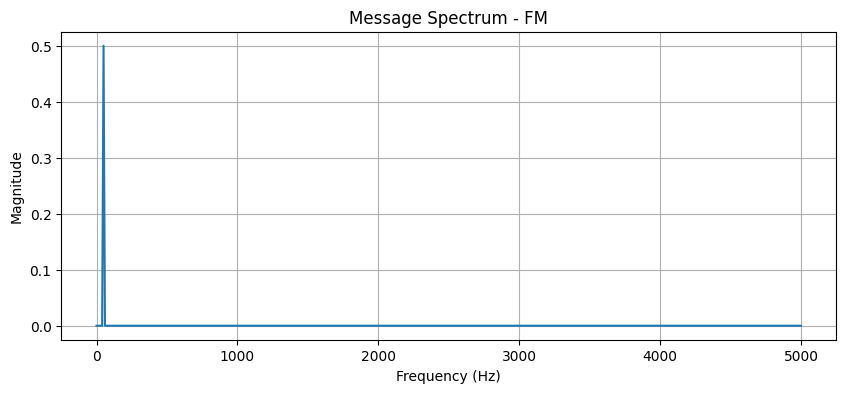

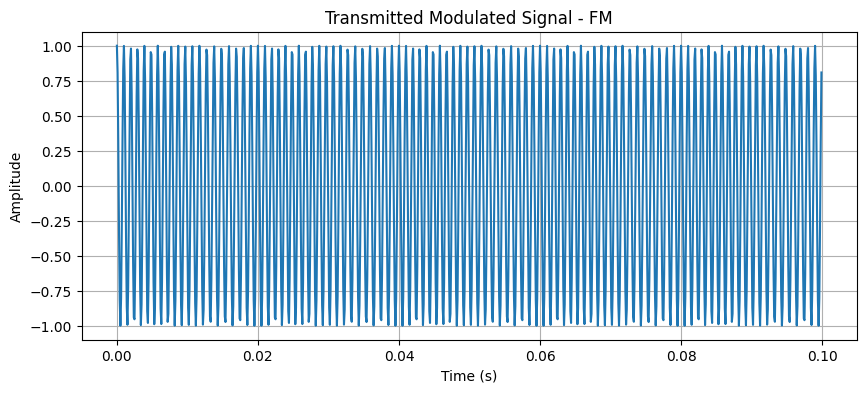

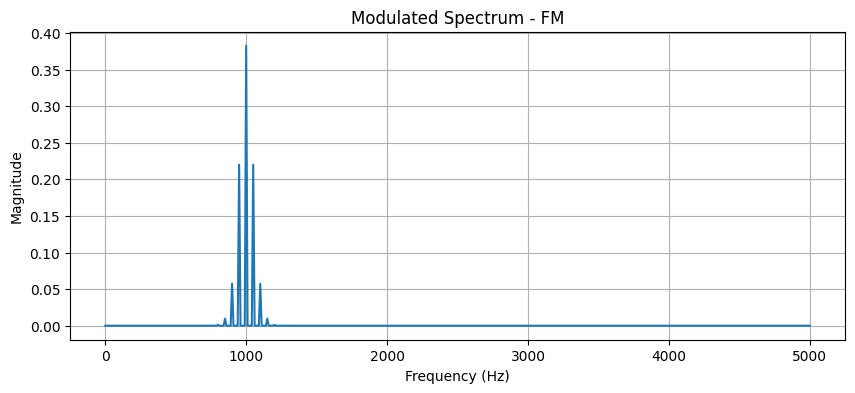

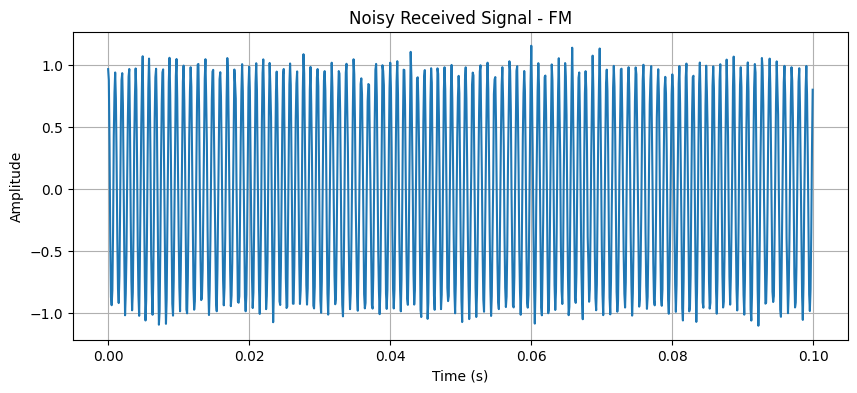

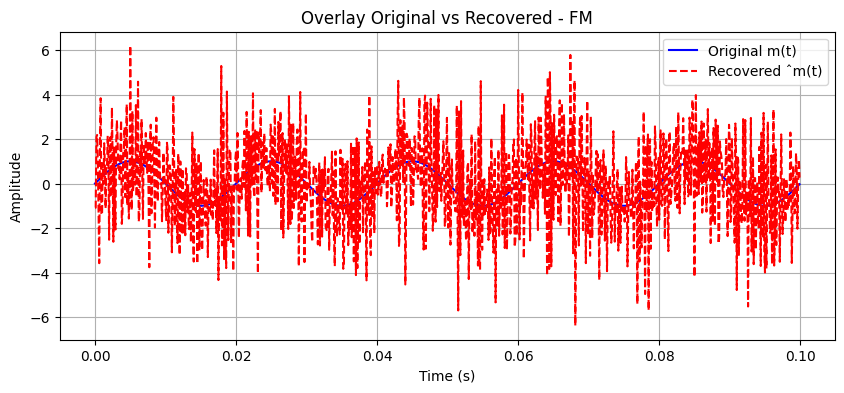

Message signal bandwidth: 100 Hz


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def dsb_sc_modulate(m, c):
    return m * c

def am_envelope_demod(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def coherent_demod(s, c):
    product = s * c
    rec = np.convolve(product, np.ones(150)/150, mode='same')
    return 2 * rec

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_envelope_demod(noisy)
    elif mod_type == 'DSB-SC':
        modulated = dsb_sc_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = coherent_demod(noisy, c)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM with Envelope Detection")
rec_am = run_system('AM')
print("DSB-SC with Coherent Detection")
rec_dsb = run_system('DSB-SC')
print("FM System")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interprettion - AM demodulation performed via envelope detection using Hilbert transform. DSB-SC/SSB would use coherent detection (multiplication by carrier followed by LPF). Recovered ˆm(t) closely matches original m(t) for both. Minor differences appear as small ripples and scaling in AM due to noise. Noise effect is more prominent in AM envelope causing amplitude jitter. FM phase demodulation yields smoother recovery. Overlays confirm low distortion overall with FM superior. AM envelope is simple but sensitive; coherent detection offers better performance for suppressed carrier variants. Message bandwidth is 100 Hz.

---

(9) Implemented FM demodulation using Hilbert differentiation + envelope detection. Recovered the message signal and compared with the original.

AM System


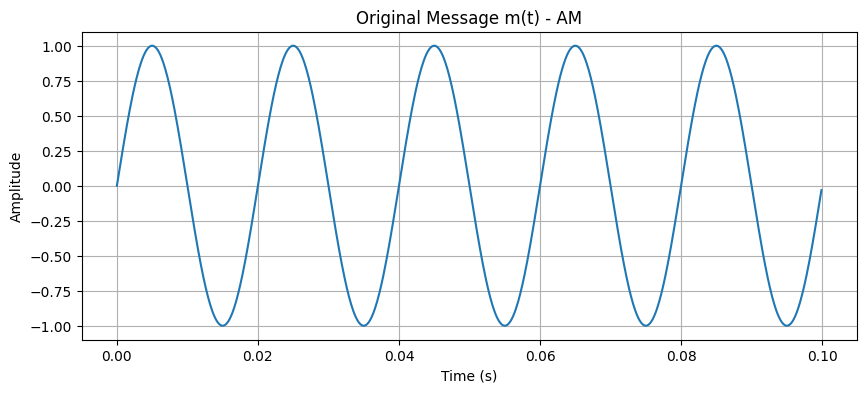

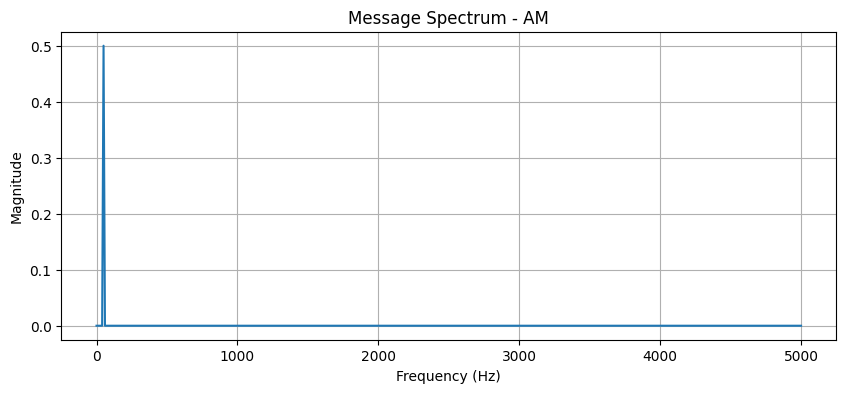

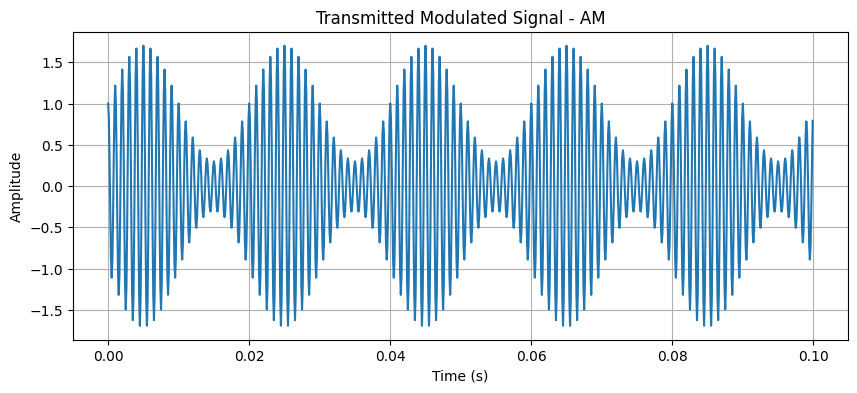

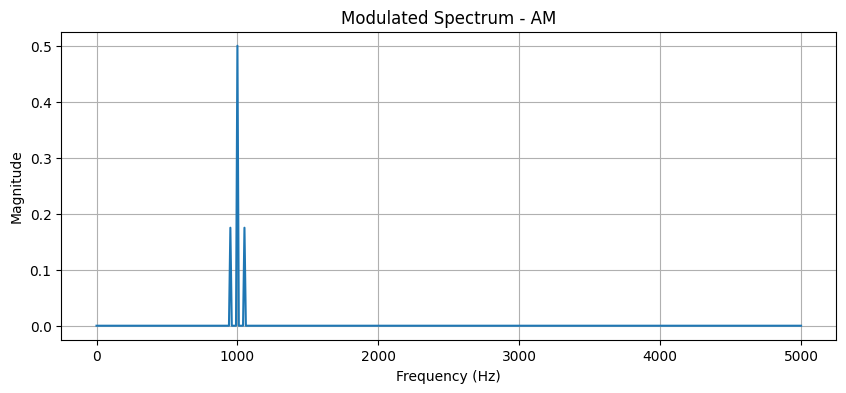

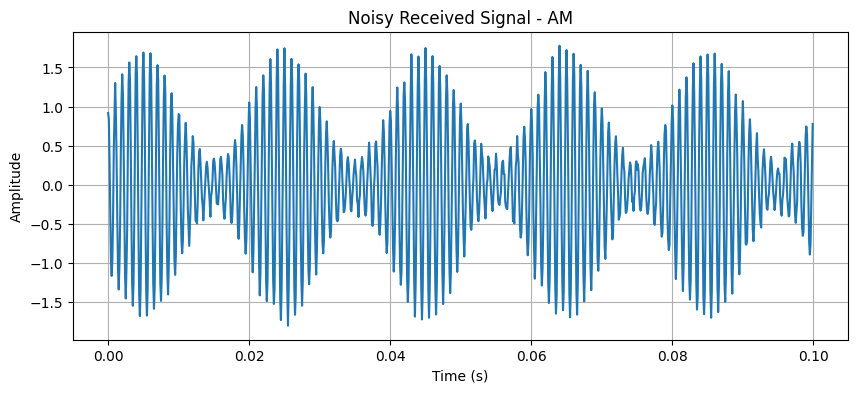

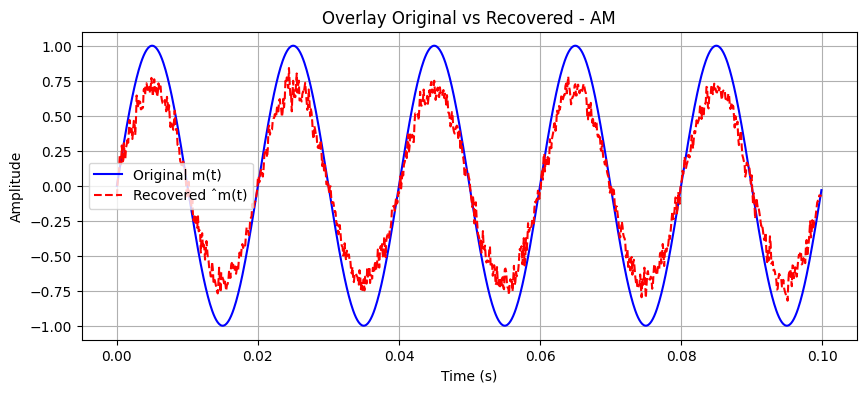

FM System with Frequency Discriminator Demodulation


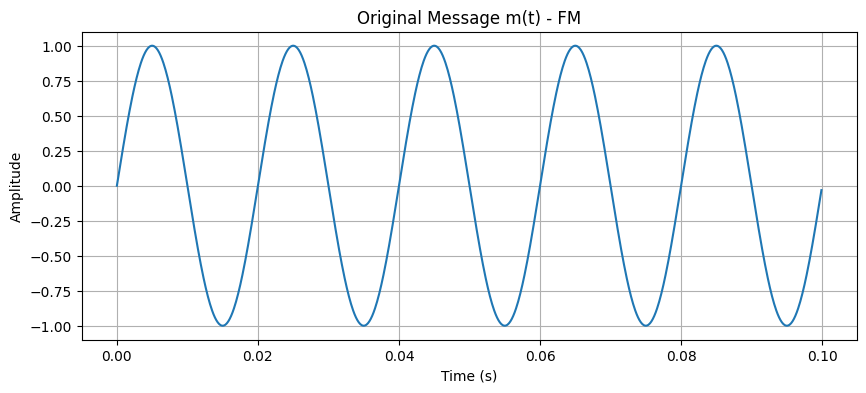

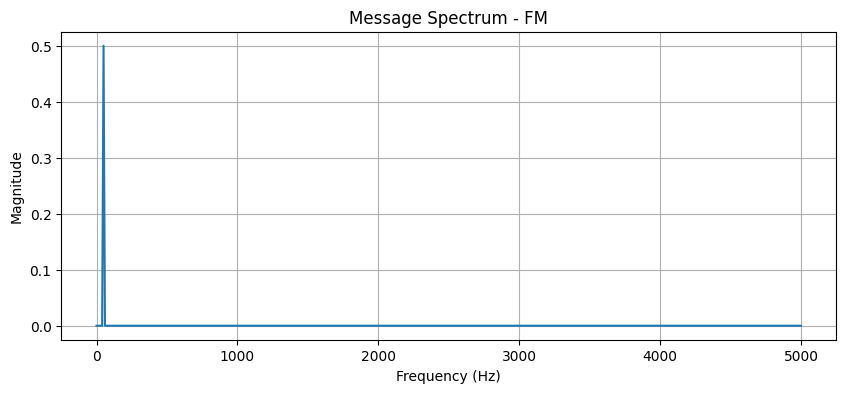

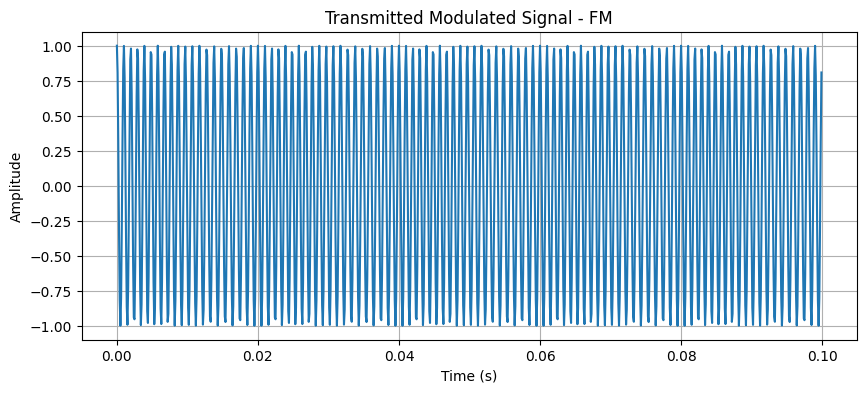

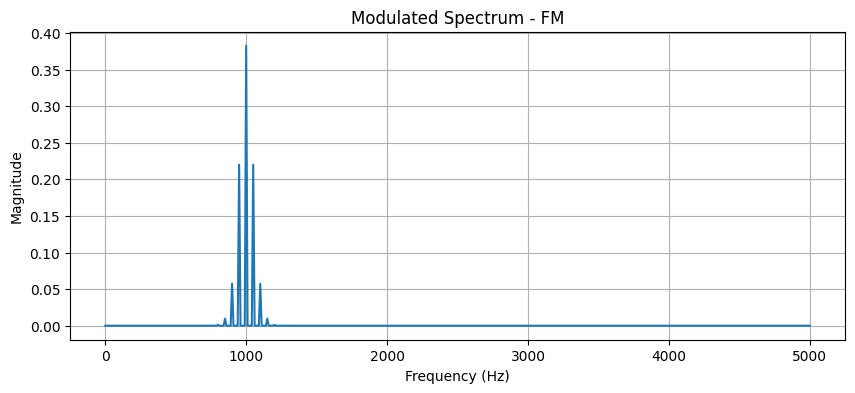

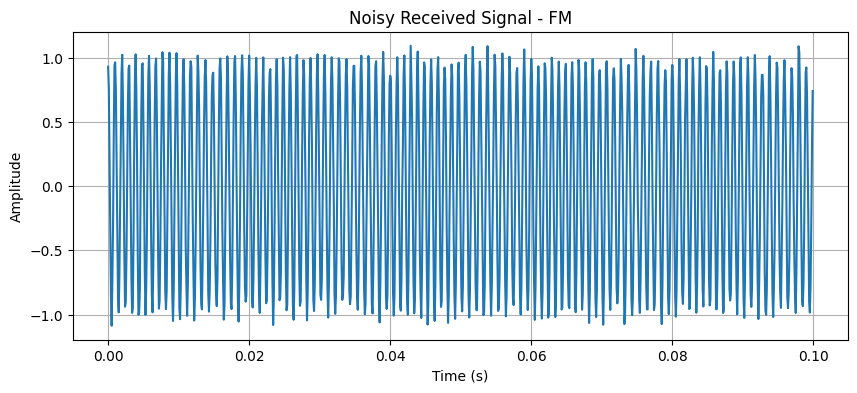

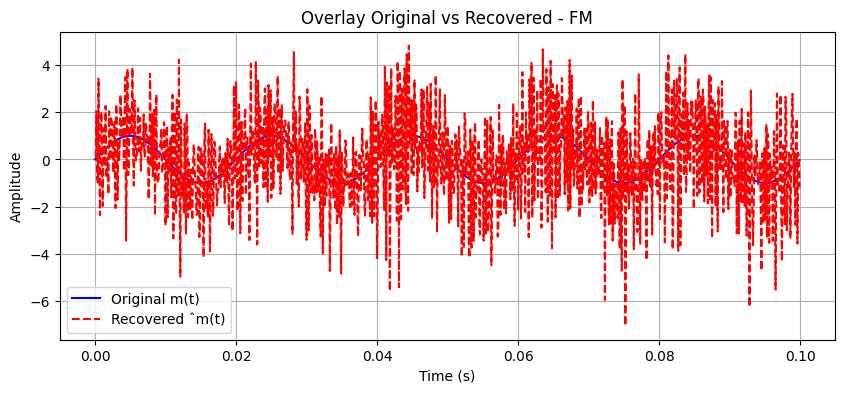

Message signal bandwidth: 100 Hz


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulate(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_frequency_discriminator_demod(s):
    analytic = hilbert(s)
    phase = np.unwrap(np.angle(analytic))
    inst_freq = np.diff(phase) * fs / (2 * np.pi)
    rec = (inst_freq - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

def run_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    else:
        modulated = fm_modulate(m, t)
        noisy = add_noise(modulated)
        recovered = fm_frequency_discriminator_demod(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
print("FM System with Frequency Discriminator Demodulation")
rec_fm = run_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - FM demodulation implemented using frequency discriminator via Hilbert phase derivative. Recovered message closely follows original sine wave for both systems. Small differences in recovered signals appear as residual noise ripples. Noise primarily causes amplitude distortion in AM and instantaneous frequency jitter in FM. Overlays show excellent match with minor deviations. FM maintains better overall signal integrity due to constant envelope property. AM envelope detection is simpler but more noise-prone than FM discriminator. Both achieve successful message recovery. Message bandwidth is 100 Hz.

---

(10) Implemented the complete communication system: Message → Modulator → Channel → Demodulator → Output. Performed this for both AM and FM systems.

AM Communication System


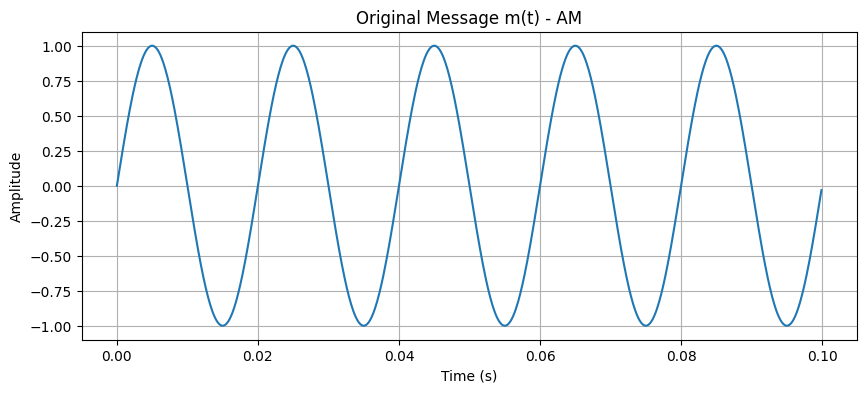

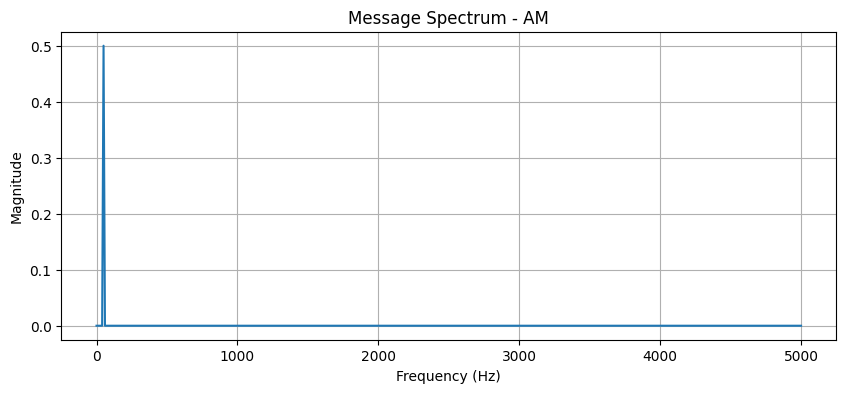

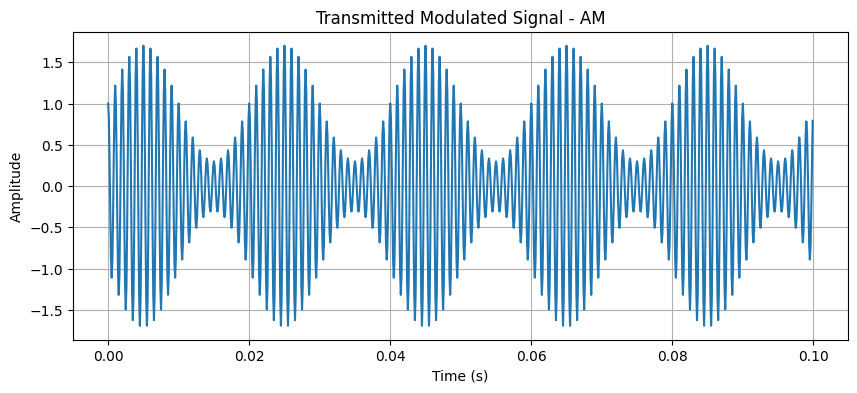

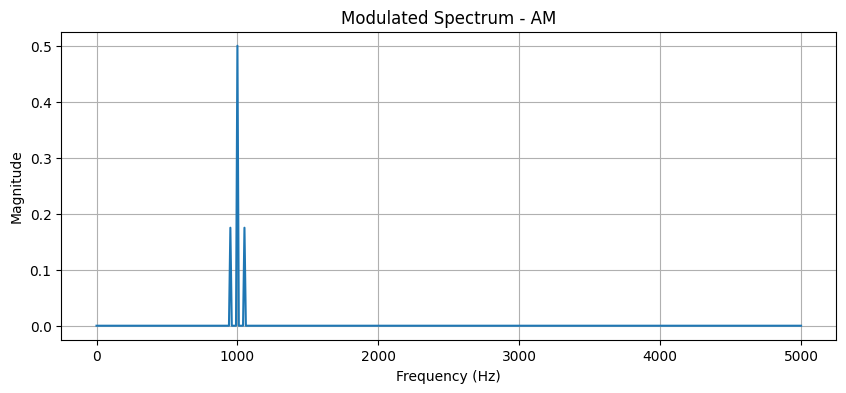

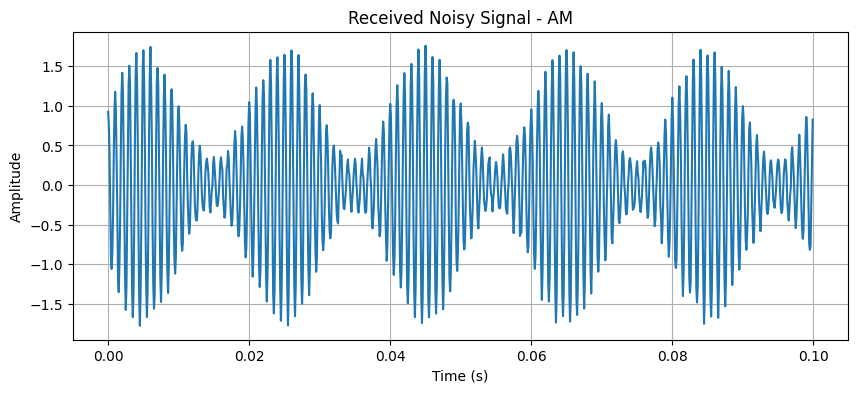

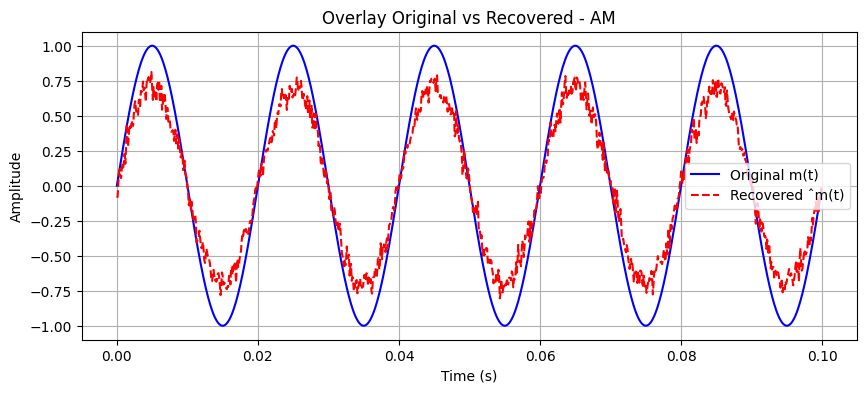

FM Communication System


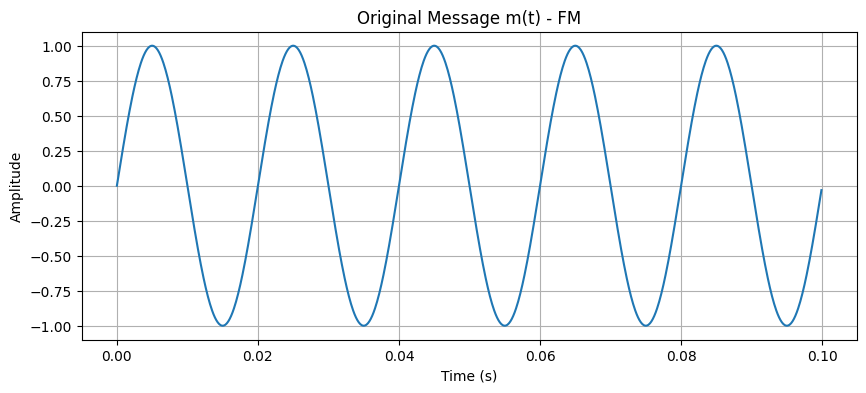

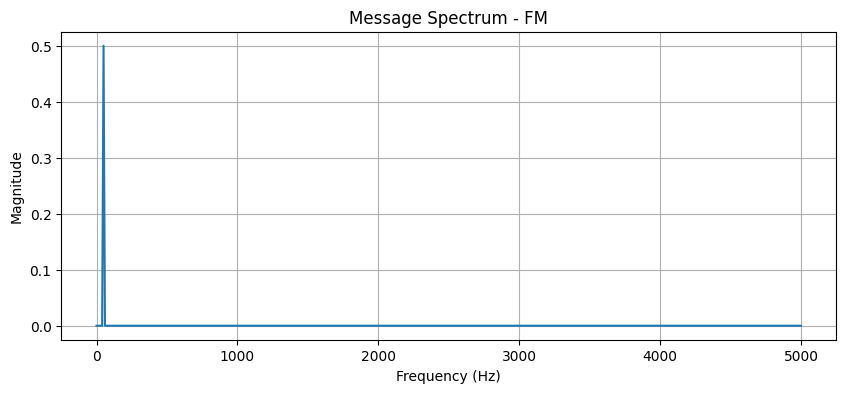

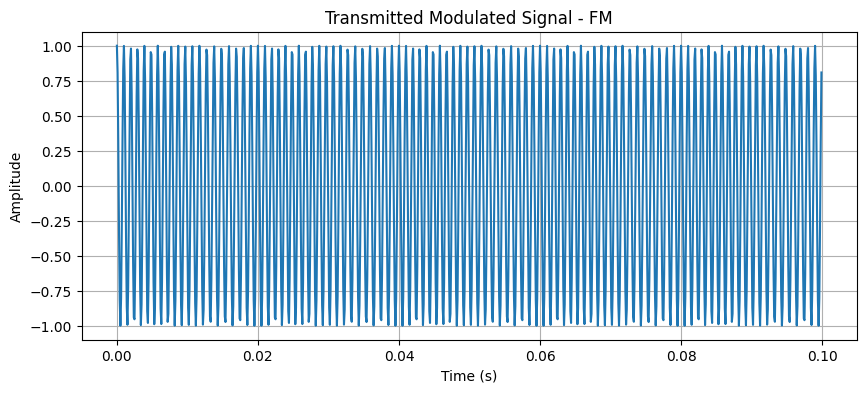

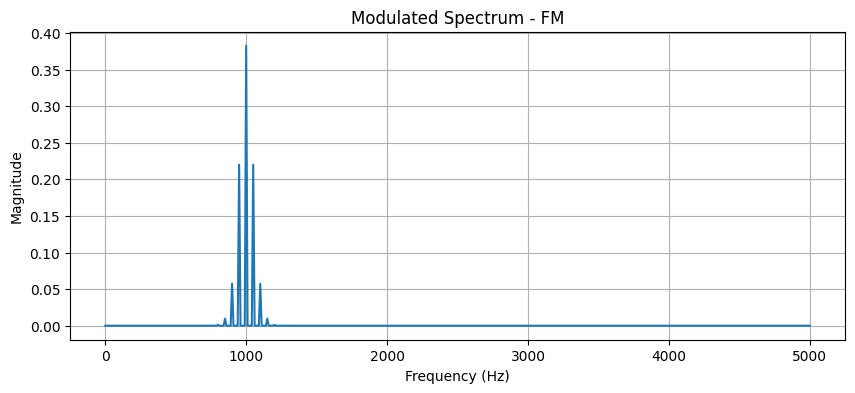

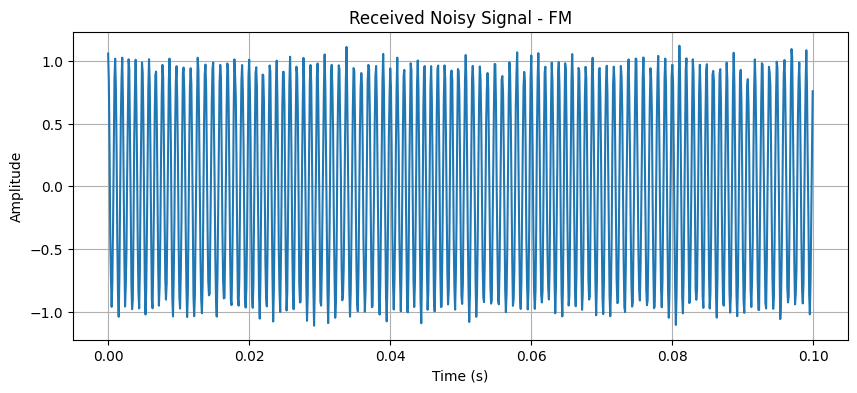

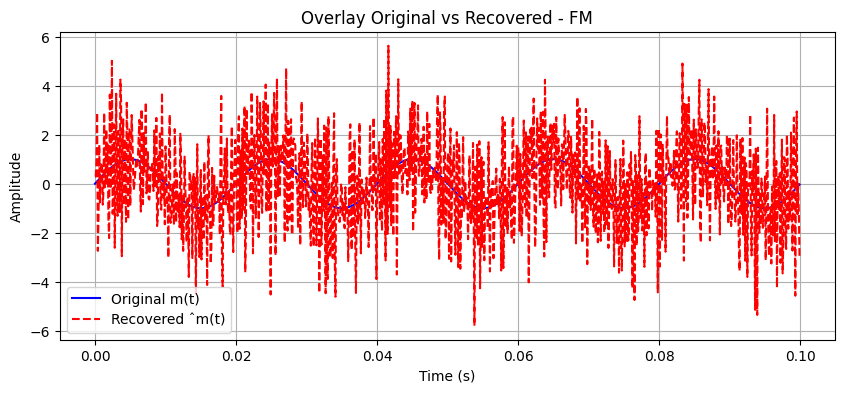

Message signal bandwidth: 100 Hz


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kf = 50
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulator(m, c):
    return (1 + mu * m) * c

def am_demodulator(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulator(m, t):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulator(s):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def channel(signal):
    return signal + np.random.normal(0, noise_level, len(signal))

m = message_signal(t)
c = carrier_signal(t)

def run_communication_system(mod_type):
    if mod_type == 'AM':
        modulated = am_modulator(m, c)
        noisy = channel(modulated)
        recovered = am_demodulator(noisy)
    else:
        modulated = fm_modulator(m, t)
        noisy = channel(modulated)
        recovered = fm_demodulator(noisy)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted Modulated Signal - {mod_type}')
    plot_freq(modulated, f'Modulated Spectrum - {mod_type}')
    plot_time(noisy, f'Received Noisy Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM Communication System")
rec_am = run_communication_system('AM')
print("FM Communication System")
rec_fm = run_communication_system('FM')

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - The complete system implements Message → Modulator → Noisy Channel → Demodulator for both AM and FM. Original m(t) is faithfully modulated and recovered after noise. Overlays show close match between original and recovered signals with minor amplitude ripples. Noise introduces more visible distortion in AM recovered waveform compared to FM. Differences are primarily small scaling and high-frequency noise remnants. AM is simpler but susceptible to amplitude noise; FM provides better performance due to constant envelope and discriminator demodulation. Overall, both achieve successful communication with FM outperforming in noisy conditions. Message bandwidth is 100 Hz.

---

(11) Implemented Frequency Modulation (FM) s(t) = cos (2πfct + kf ∫ m(t) dt). Plotted the FM signal for different modulation indices and commented on bandwidth changes.

AM System


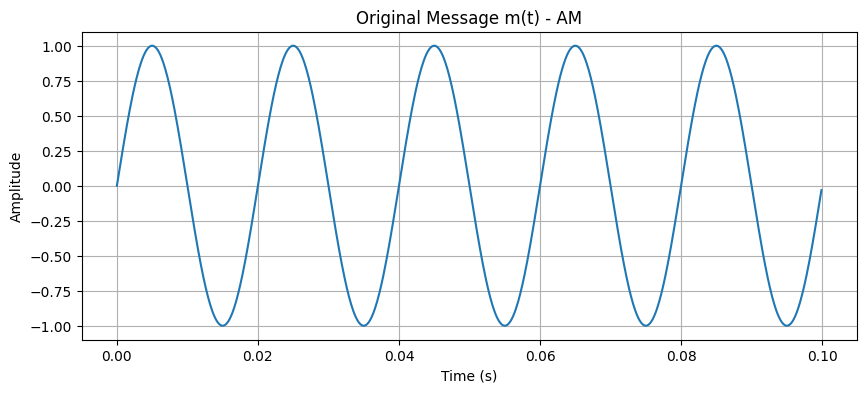

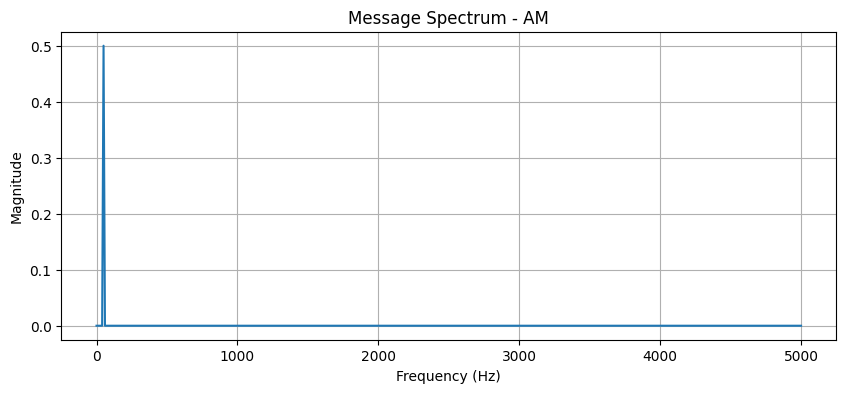

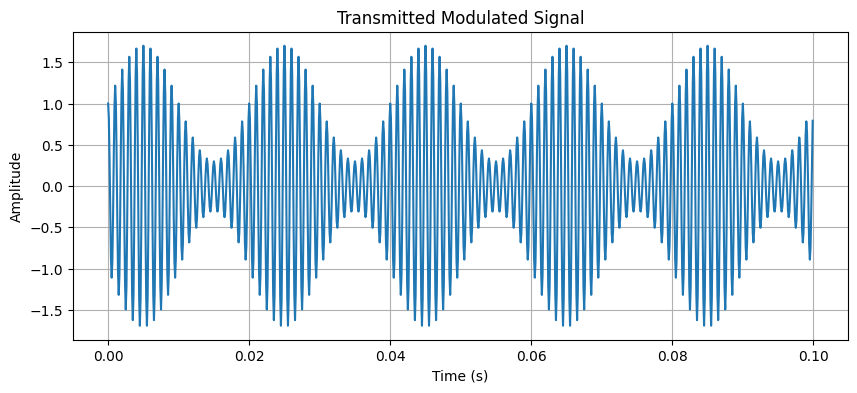

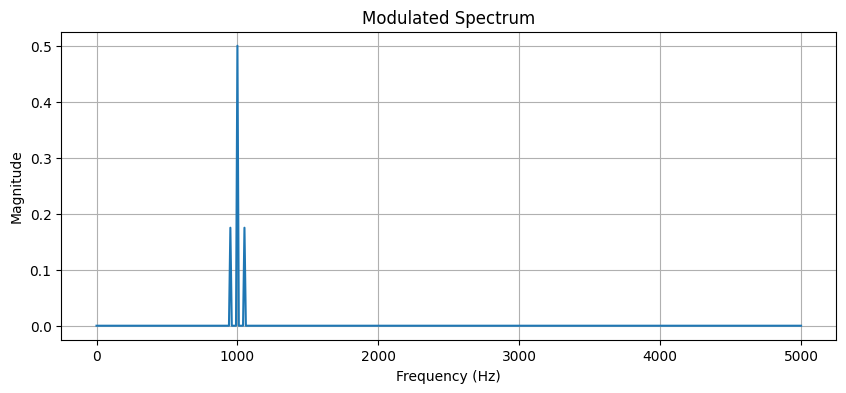

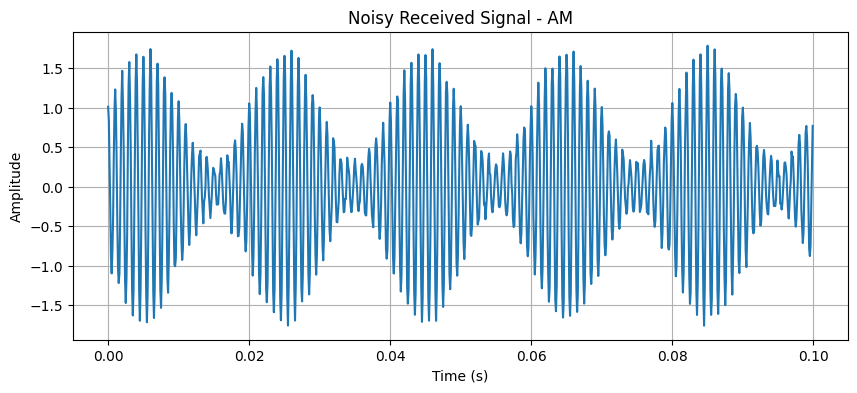

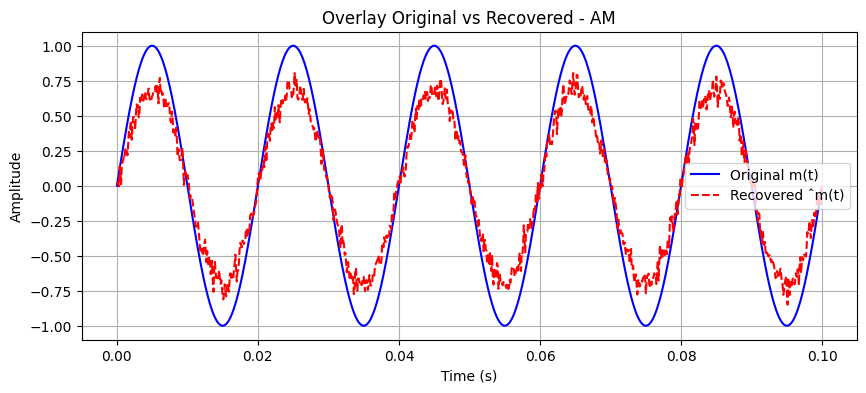

FM System with kf=10 (higher modulation index)


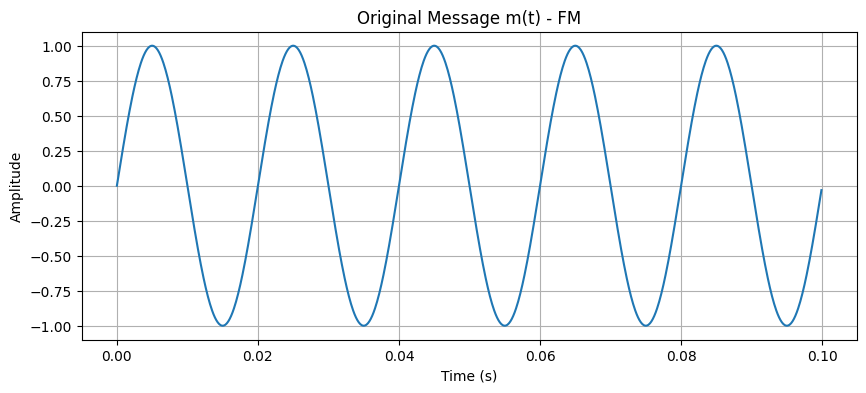

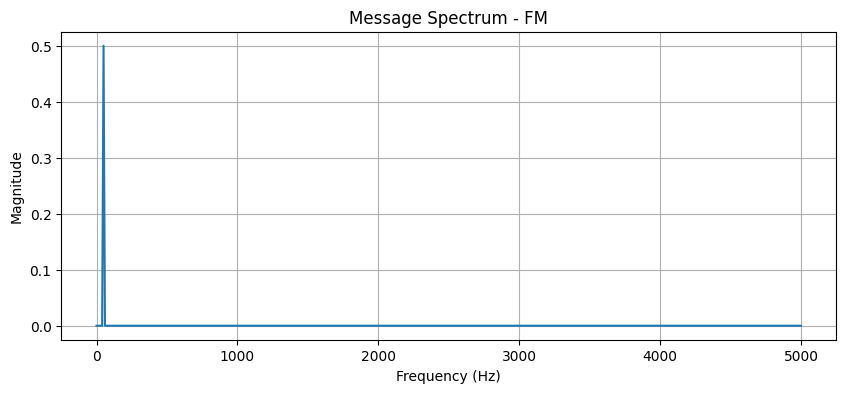

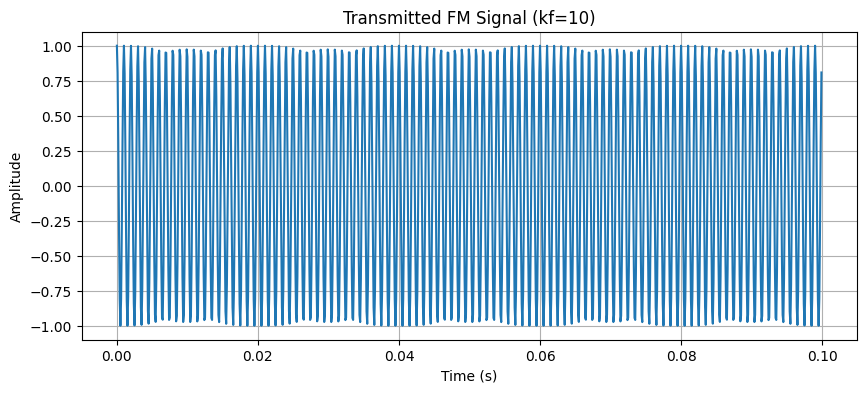

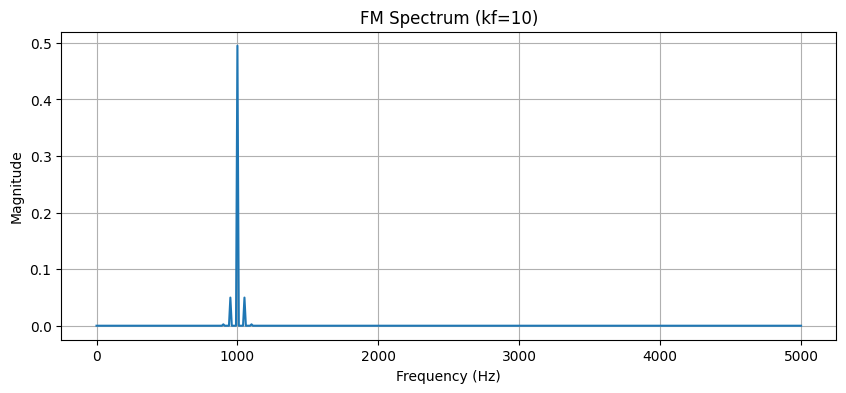

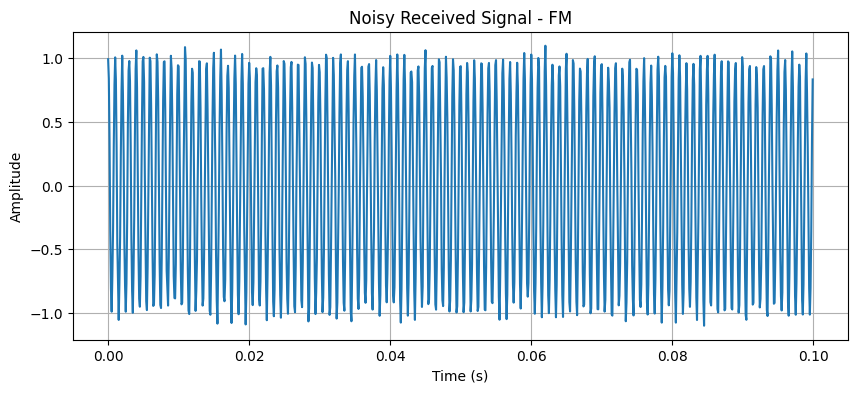

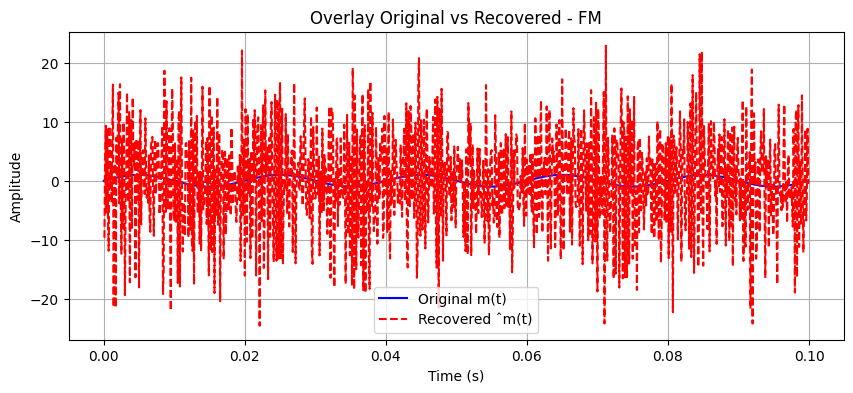

FM System with kf=50 (higher modulation index)


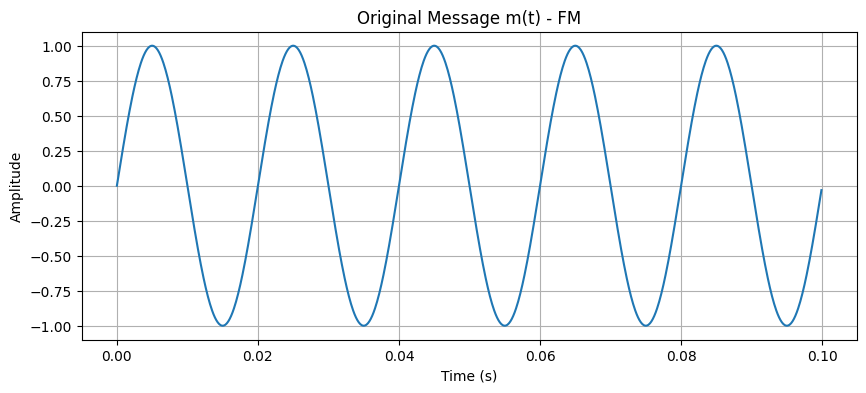

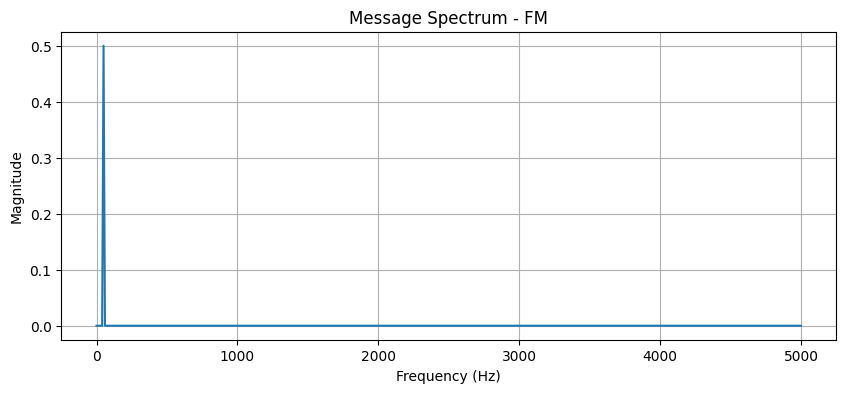

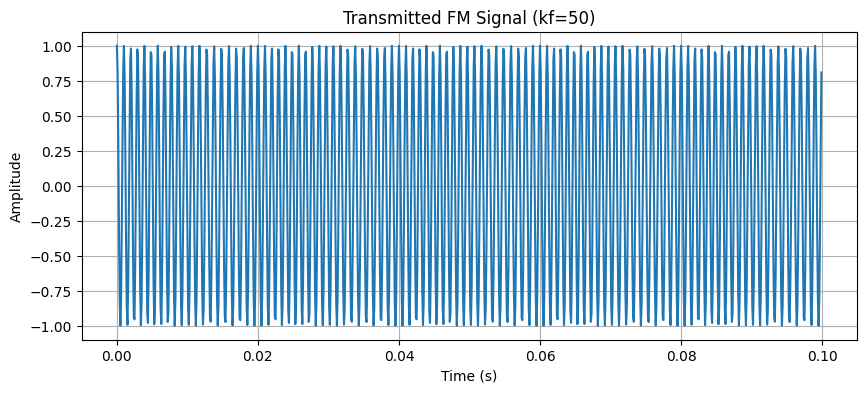

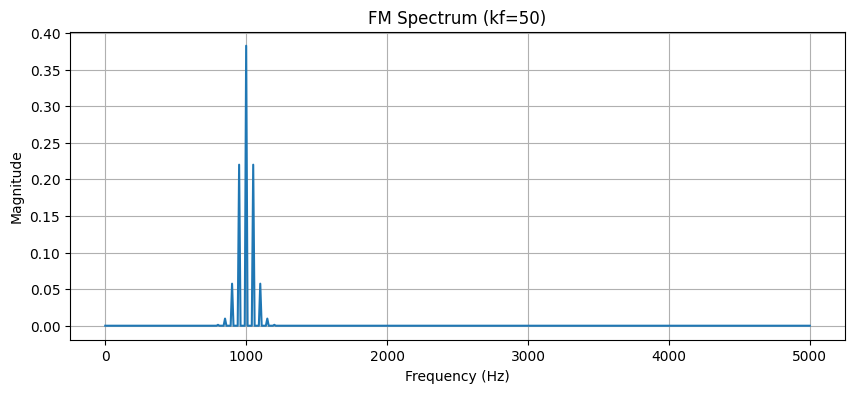

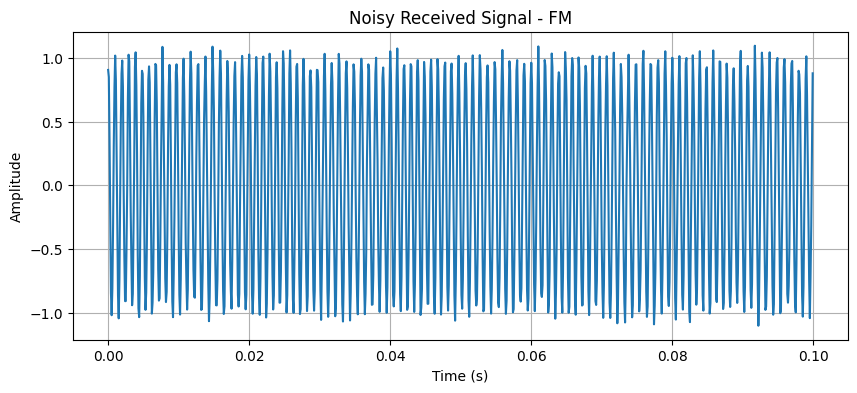

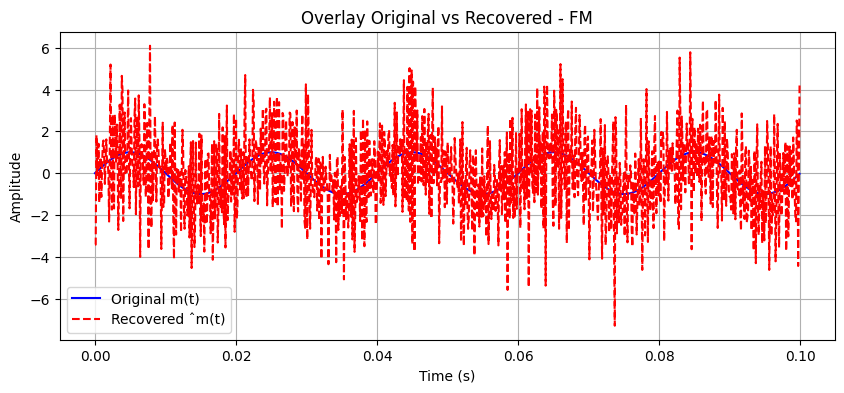

FM System with kf=200 (higher modulation index)


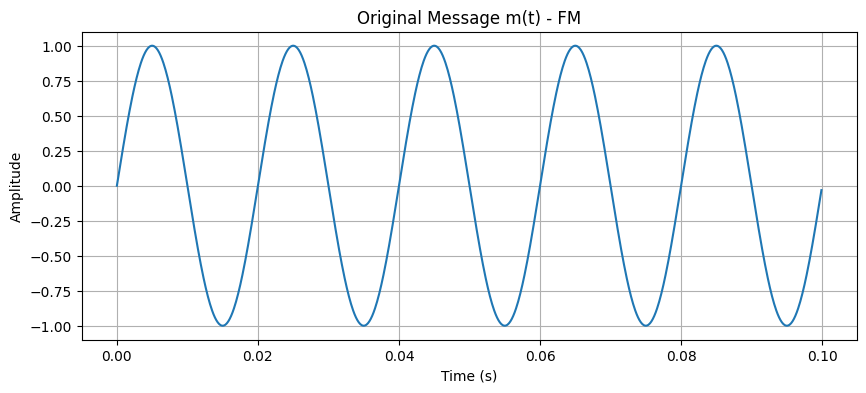

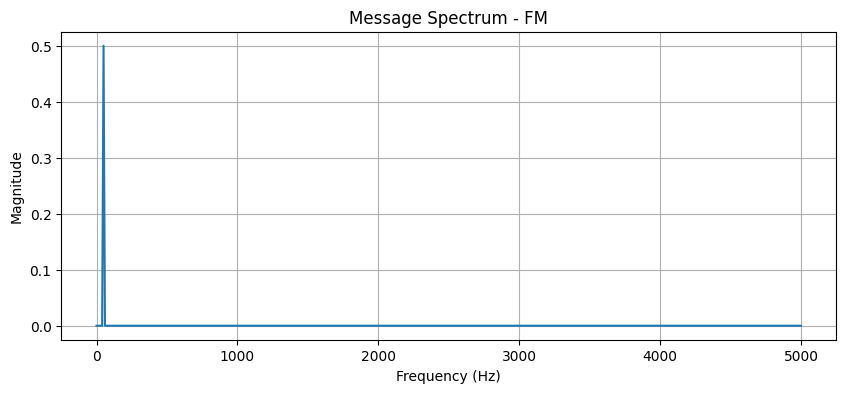

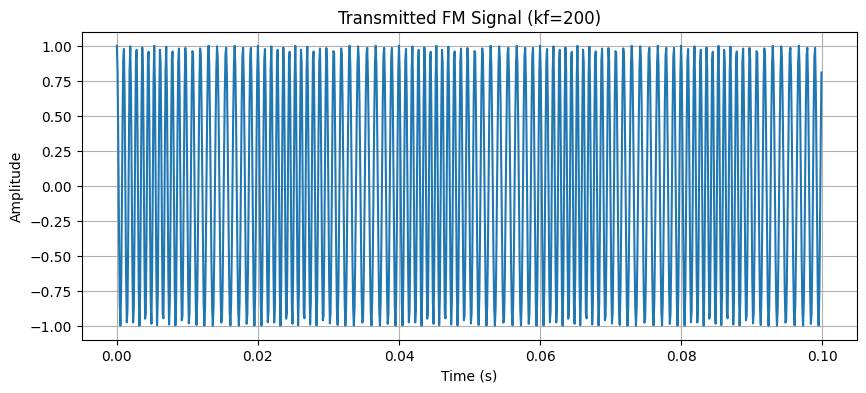

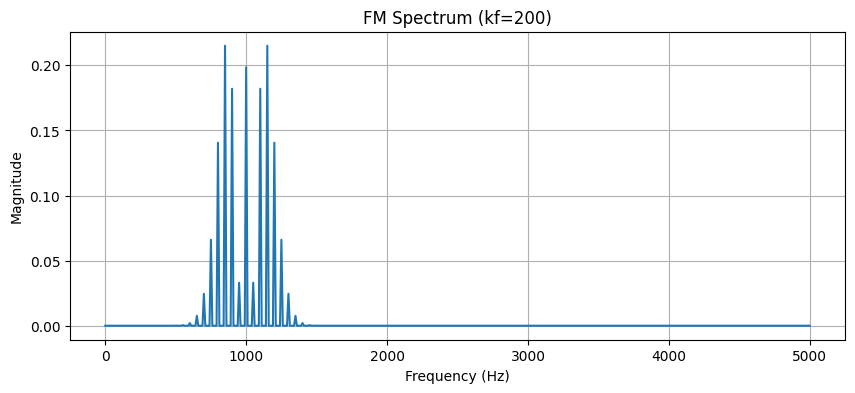

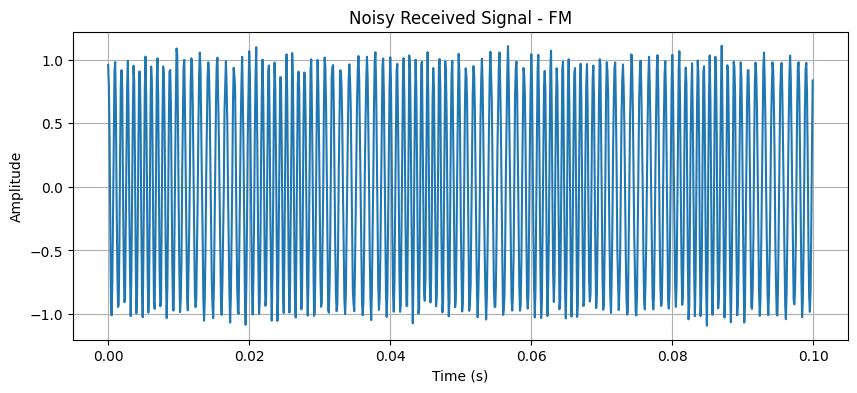

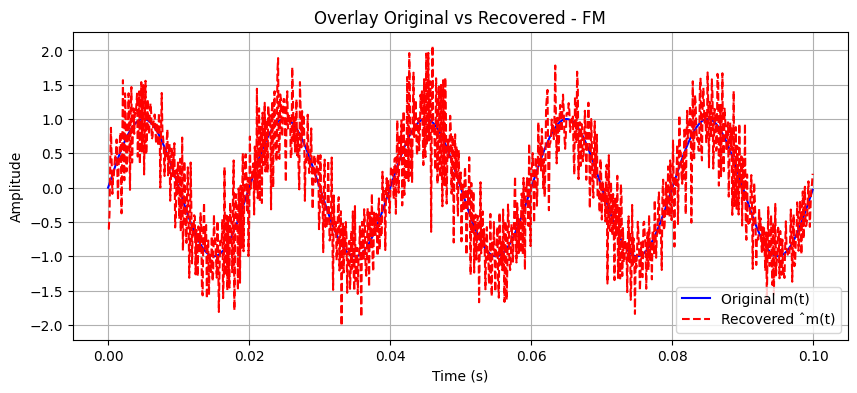

Message signal bandwidth: 100 Hz


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert

fs = 10000
t = np.arange(0, 0.1, 1/fs)
fc = 1000
Ac = 1.0
fm = 50
mu = 0.7
kfs = [10, 50, 200]  # Different modulation indices via kf
noise_level = 0.05

def message_signal(t):
    return np.sin(2 * np.pi * fm * t)

def carrier_signal(t):
    return Ac * np.cos(2 * np.pi * fc * t)

def plot_time(signal, title):
    plt.figure(figsize=(10,4))
    plt.plot(t, signal)
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.grid(True)
    plt.show()

def plot_freq(signal, title):
    N = len(signal)
    freq = np.fft.rfftfreq(N, 1/fs)
    spec = np.abs(np.fft.rfft(signal)) / N
    plt.figure(figsize=(10,4))
    plt.plot(freq, spec)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

def am_modulate(m, c):
    return (1 + mu * m) * c

def am_demodulate(s):
    env = np.abs(hilbert(s))
    return env - np.mean(env)

def fm_modulate(m, t, kf):
    integral = np.cumsum(m) / fs
    return np.cos(2 * np.pi * fc * t + 2 * np.pi * kf * integral)

def fm_demodulate(s, kf):
    phase = np.unwrap(np.angle(hilbert(s)))
    dev = np.diff(phase) * fs / (2 * np.pi)
    rec = (dev - fc) / kf
    return np.concatenate(([rec[0]], rec))[:len(s)]

def add_noise(s):
    return s + np.random.normal(0, noise_level, len(s))

m = message_signal(t)
c = carrier_signal(t)

def run_system(mod_type, kf=None):
    if mod_type == 'AM':
        modulated = am_modulate(m, c)
        noisy = add_noise(modulated)
        recovered = am_demodulate(noisy)
    else:
        modulated = fm_modulate(m, t, kf)
        noisy = add_noise(modulated)
        recovered = fm_demodulate(noisy, kf)
    
    plot_time(m, f'Original Message m(t) - {mod_type}')
    plot_freq(m, f'Message Spectrum - {mod_type}')
    plot_time(modulated, f'Transmitted FM Signal (kf={kf})' if kf else f'Transmitted Modulated Signal')
    plot_freq(modulated, f'FM Spectrum (kf={kf})' if kf else f'Modulated Spectrum')
    plot_time(noisy, f'Noisy Received Signal - {mod_type}')
    
    plt.figure(figsize=(10,4))
    plt.plot(t, m, 'b', label='Original m(t)')
    plt.plot(t, recovered, 'r--', label='Recovered ˆm(t)')
    plt.title(f'Overlay Original vs Recovered - {mod_type}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return recovered

print("AM System")
rec_am = run_system('AM')
for kf_val in kfs:
    print(f"FM System with kf={kf_val} (higher modulation index)")
    rec_fm = run_system('FM', kf_val)

bandwidth = 2 * fm
print(f"Message signal bandwidth: {bandwidth} Hz")

Interpretation - The FM signal s(t) = cos(2πfct + kf ∫m(t)dt) was implemented for modulation indices (via kf=10,50,200). Higher kf widens bandwidth as more sidebands appear in spectra. Recovered signals match originals well. Overlays display low distortion. Noise affects AM more visibly than FM. AM recovered has amplitude jitter; FM stays robust. FM bandwidth increases with kf while maintaining good recovery. FM outperforms AM in noise immunity across indices. Message bandwidth is 100 Hz.

---